## imports

In [ ]:
import jax.numpy as jnp
import numpy as np
from jax.experimental.ode import odeint
import numpy.random as npr
from jax import jit, grad
from functools import partial
from jax import value_and_grad
import jax
from jax import jit
from matplotlib import pyplot
import matplotlib.pyplot as plt
import copy
from jax import vmap ### Batching an ODE Net

#for graphing 
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D

from copy import deepcopy

## NN functions define

In [ ]:

'''
`mlp` is simply a composition of linear and nonlinear layers.  
Its parameters `params` are a list of weight matrices and bias vectors.
To make larger models, we can always chain together or compose layers.  
'''

def relu(x):
  return jnp.maximum(0.0, x)


#### our controller h(x,t)
'''
`mlp` is simply a composition of linear and nonlinear layers.  
Its parameters `params` are a list of weight matrices and bias vectors.
To make larger models, we can always chain together or compose layers.  
'''

def relu(x):
  return jnp.maximum(0.0, x)


# #### our controller h(x,t)
# def mlp_control(params, inputs):
#     """ Compute the forward pass for each example individually """
#     activations = inputs
#     # Loop over the ReLU hidden layers
#     for w, b in params[:-1]:
#         activations = jax.nn.elu(jnp.dot(activations,w) + b)
#     # Perform final trafo to logits
#     final_w, final_b = params[-1]
#     # logits = jnp.tanh(jnp.dot(activations, final_w) + final_b)

#     logits = jnp.dot(activations, final_w) + final_b
#     return logits


#### our dynamic learner g(x,u,t) 
def mlp_dyn(params, inputs, control):
  inputs_ = jnp.hstack([inputs, jnp.array(control)])
  for w, b in params:
    outputs = jnp.dot(inputs_, w) + b  # Linear transform
    inputs_ = jnp.tanh(outputs)            # Nonlinearity
    # inputs_ = jax.nn.elu(outputs)

  # outputs = jnp.tanh(inputs_)   
  return outputs


'''
To fit this model to data, we also need a loss, an initializer, and an optimizer: 
'''

def init_random_params(scale, layer_sizes, rng=npr.RandomState(0)):
  return [(scale * rng.randn(m, n), scale * rng.randn(n))
          for m, n, in zip(layer_sizes[:-1], layer_sizes[1:])]


#### our dynamic learner g(x,u,t) 
def mlp_dyn(params, inputs, control):
  inputs_ = jnp.hstack([inputs, jnp.array(control)])
  for w, b in params:
    outputs = jnp.dot(inputs_, w) + b  # Linear transform
    inputs_ = jnp.tanh(outputs)            # Nonlinearity
    # inputs_ = jax.nn.elu(outputs)

  # outputs = jnp.tanh(inputs_)   
  return outputs


'''
To fit this model to data, we also need a loss, an initializer, and an optimizer: 
'''

def init_random_params(scale, layer_sizes, rng=npr.RandomState(0)):
  return [(scale * rng.randn(m, n), scale * rng.randn(n))
          for m, n, in zip(layer_sizes[:-1], layer_sizes[1:])]

## Define neural dynamics
This is our $\dot x = \hat g(x,\hat h(x, \theta), \gamma)$ \\

In [ ]:
# def nn_unknown_dynamics_with_control(state, time, params): #dx/dt = g(x,u)

def nn_unknown_dynamics_with_control(state, time, params): #dx/dt = g(x,u)
  params_dyn, params_control = params
  state_and_time = jnp.hstack([state, jnp.array(time)])
  u = mlp_control(params_control,state_and_time)
  # u = mlp_control(params_control,state)
  return mlp_dyn(params_dyn, state, u) ## dx/dt = g(x,u)


#### integrate g with odeint
def ode_control_net(params, input, n_points=10, mode = 'train_with_sequence'): 
  # print("!!!!!!! end time for ode net is {}".format(end_time))
  start_and_end_times = jnp.array([0.0, end_time])
  n_points = int(end_time*10+1) ## make sure that multi-stage train always include the same points

  if mode not in ['train_with_sequence', 'train_with_end_data', 'return_control']:
      print("Mode error")

  if mode == 'train_with_sequence':
      TS = jnp.linspace(0, end_time, n_points)
      final_state = input
      sequence = odeint(nn_unknown_dynamics_with_control, final_state, TS, params, atol=0.001, rtol=0.001)
      return sequence

  elif mode == 'return_control': ## can do this as we only return control when do testing, and no need for batching there
      all_controls = []
      sequence = [input]
      TS = jnp.linspace(0, end_time, n_points)## fix n_points for all the nets
      final_state = input
    
      for i in range(len(TS)-1):
          state_and_time = jnp.hstack([final_state, jnp.array(TS[i])])
          params_control = params[1]
          control_used =  np.sum(np.array(mlp_control(params_control,state_and_time))**2) # call controler mlp here, need to only use part of params as well
          control_used = control_used*start_and_end_times[-1]/n_points
          all_controls.append(control_used)

          inter_start_and_end_times = jnp.array([TS[i], TS[i+1]])
          init_state, final_state = odeint(nn_unknown_dynamics_with_control, final_state, inter_start_and_end_times, params, atol=0.001, rtol=0.001)
          sequence.append(list(jnp.array(final_state)))
   
      # all_controls = np.asarray(all_controls).cumsum()
      return jnp.asarray(sequence),all_controls ## return [y0,y1,y2,y3,...], [a0,a1,a2,a3,...]

  elif mode == 'train_with_end_data':
      init_state, final_state = odeint(nn_unknown_dynamics_with_control, input, start_and_end_times, params, atol=0.001, rtol=0.001)
      return final_state


def ode_control_net_controller_train(params, input):
    # start_and_end_times = jnp.array([0.0, 1.0]) #### this shall always be 1 ? 
    start_and_end_times = jnp.array([0.0, end_time]) #### this shall always be 1 ? 
    init_state, final_state = odeint(nn_unknown_dynamics_with_control, input, start_and_end_times, params, atol=0.001, rtol=0.001)
    return final_state





## Create loss functions 
For both dyn: $\hat g(x,\hat h(x, \theta), \gamma)$ training and controller: $h(x, \theta)$ training

For $\hat g(x,\hat h(x, \theta), \gamma)$ training, we input sequence of true y and actions we use in f by plugging in $h(x, \theta)$

In [ ]:
# @partial(jit, static_argnums=(1,3,4))
def odenet_loss_dyn(params, inputs, targets_from_real_env):
  # params = params_dyn, params_control
  preds = batched_odenet(params, inputs)
  loss = jnp.mean(jnp.sum(jnp.abs(preds - targets_from_real_env),axis=1)) ## !!!!! this loss seem to make things better
  # loss = jnp.mean(jnp.sum((preds - targets_from_real_env)**2, axis=1))
  return loss

@jit
def odenet_update_dyn(params, inputs, targets_from_real_env): 
  '''
  Input: current params (tuple) before update, input data in a batch 
  Return: updated dyn_params, fixed con_params, 
  '''
  loss, grads = value_and_grad(odenet_loss_dyn)(params, inputs, targets_from_real_env) # can get grad and loss in one path: https://github.com/google/jax/issues/4857
  grad_dyn = grads[0]
  grad_control = grads[1]
  # print("The grad norm is {}".format(np.sum(grads[0][0][0]**2)/len(grads[0][0][0])))

  dyn_params = [(w - step_size * dw, b - step_size * db)
          for (w, b), (dw, db) in zip(params[0], grad_dyn)]
  con_params = [(w, b)
          for (w, b), (dw, db) in zip(params[1], grad_control)]

  return dyn_params, con_params, loss

In [ ]:
def odenet_loss_control(params, inputs,targets):
  preds = batched_odenet_controller_train(params, inputs)
  loss = jnp.mean(jnp.sum((preds - targets)**2, axis=1))
  return loss

@jit
def odenet_update_control(params, inputs, targets):
  loss, grads = value_and_grad(odenet_loss_control)(params, inputs, targets)
  grad_dyn = grads[0]
  grad_control = grads[1]

  dyn_params = [(w , b )
          for (w, b), (dw, db) in zip(params[0], grad_dyn)]
  con_params = [(w - step_size * dw, b - step_size * db)
          for (w, b), (dw, db) in zip(params[1], grad_control)]
  
  return dyn_params, con_params, loss

## Create visualization functions

plot traj rollout

plot vector field 

In [ ]:
#### this function plots the traj rollout calling mode 'return_control', which use scipy odeint --> no trace (no gradient stuff)
def plot_current(params,data_batch, task = "AxBu"):
    if task == "AxBu":
        controls_real = []
        controls_odenet = []
        plt.figure(figsize=(10,3))
        plt.subplot(1, 2, 1) # row 1, col 2 index 1
        for start in data_batch:
            traj_real,all_controls_real = real_net(params, start, mode='return_control') ### we deviate from y_sequence_true ??
            traj_ode,all_controls_ode = ode_control_net(params, start, mode='return_control')
            controls_real.append(all_controls_real)
            controls_odenet.append(all_controls_ode)
            
            plt.plot(traj_real[:,0],traj_real[:,1], linewidth=1, color = 'black')
            plt.plot(traj_ode[:,0],traj_ode[:,1], linewidth=1, color = 'red')
            
            plt.plot(start[0],start[1],marker="o", markersize=4, markeredgecolor="red", markerfacecolor="green", label="Start")
        plt.scatter(1, -1, s=2000, c='r', marker='+')
        
        plt.subplot(1, 2, 2) # index 2
        for i in range(len(controls_real)):
            plt.plot(np.array(controls_real[i]).T,c='black')
            plt.plot(np.array(controls_odenet[i]).T,c='r')
        
        plt.show()
    



## Task: Cartpole 

### Define real dynamics
This is our $\dot x = f(x,u)$ 

In [ ]:
#### real dyanmical function f, input state and control, returns d_state at each state dimension
# def real_dynamics_cart(state_and_L, time, params): 


def real_dynamics_cart(state, time, params): 
  ### following derivation on my ipad
  g = 9.8
  mc = 1.0
  mp = 0.1
  l = 0.5  # actually half the pole's length
  # self.force_mag = 10.0
  # self.theta_threshold_radians = 12 * 2 * math.pi / 360
  # self.x_threshold = 2.4
  # c = (mp*l)/(mc+mp)
  # a = 1/(mc+mp)

  sin = lambda x: jnp.sin(x)
  cos = lambda x: jnp.cos(x)

  x, x_dot, theta, theta_dot = state
  # x, x_dot, theta, theta_dot, L = state_and_L
  # state = x, x_dot, theta, theta_dot
  # state = state_and_L[:-1]

  params_dyn, params_control = params
  # state_and_time=state
  state_and_time = jnp.hstack([state, jnp.array(time)])
  
  F = mlp_control(params_control, state_and_time)[0] ## need to do [0], not in task 1 due to jnp.dot(B,u),u can be a list
  # dL = jnp.max(time-2.0,0)*(jnp.abs(x) + jnp.abs(x_dot) + jnp.abs(theta) + jnp.abs(theta_dot)) + jnp.abs(F)
  # dL = jnp.maximum(time-2,0)*(jnp.abs(x) + jnp.abs(x_dot) + jnp.abs(theta) + jnp.abs(theta_dot))
  # dL = jnp.abs(x) + jnp.abs(x_dot) + jnp.abs(theta) + jnp.abs(theta_dot)

  temp = (F + l*theta_dot ** 2 *sin(theta) ) / (mp+mc)
  thetaacc = (g * sin(theta) - cos(theta) * temp) / (l * (4/3 - l*cos(theta) ** 2 / (mc+mp)))
  xacc = temp - l* thetaacc * cos(theta) / (mc+mp)

  d_x = x_dot
  d_x_dot = xacc
  d_theta = theta_dot
  d_theta_dot = thetaacc
  d_state = jnp.array([d_x, d_x_dot, d_theta, d_theta_dot])
  # d_state = jnp.array([d_x, d_x_dot, d_theta, d_theta_dot,dL])
  return d_state

#### integrate f with odeint
def real_net_cart(params, input, mode = 'train_with_sequence'): 
  start_and_end_times = jnp.array([0.0, end_time])
  n_points = int(end_time*10+1)
  # n_points = int(end_time*25)

  if mode not in ['train_with_sequence', 'train_with_end_data','return_control']:
      print("Mode error")

  if mode == 'train_with_sequence':
      
      TS = jnp.linspace(start_and_end_times[0], start_and_end_times[1], n_points)

      # TS = jnp.linspace(2, 4, 40)
      final_state = input
      sequence = odeint(real_dynamics_cart, final_state, TS, params, atol=0.001, rtol=0.001)
      return sequence


  elif mode == 'return_control': ## can do this as we only return control when do testing, and no need for batching there
      all_controls = []
      sequence = [input]
      TS = jnp.linspace(start_and_end_times[0], start_and_end_times[1], n_points)
      final_state = input
      
      for i in range(len(TS)-1):
          state_and_time = jnp.hstack([final_state, jnp.array(TS[i])])
          # state_and_time = final_state
          params_control = params[1]
          control_used =  jnp.sum(jnp.array(mlp_control(params_control,state_and_time))**2) # call controler mlp here, need to only use part of params as well
          control_used = control_used*start_and_end_times[-1]/n_points
          all_controls.append(control_used)

          inter_start_and_end_times = jnp.array([TS[i], TS[i+1]])
          init_state, final_state = odeint(real_dynamics_cart, final_state, inter_start_and_end_times, params, atol=0.001, rtol=0.001)
          sequence.append(list(jnp.array(final_state)))

      # all_controls = np.asarray(all_controls).cumsum()
      return jnp.asarray(sequence),all_controls

  elif mode == 'train_with_end_data':
      init_state, final_state = odeint(real_dynamics_cart, input, start_and_end_times, params, atol=0.001, rtol=0.001)
      return final_state



def real_net_for_controller(params, input): ### drop this function later --> as controller is only trained wiht ode_net, not with real_net
  start_and_end_times = jnp.array([0.0, end_time])
  init_state, final_state = odeint(real_dynamics_cart, input, start_and_end_times, params, atol=0.001, rtol=0.001)
  return final_state

In [ ]:

#### our controller h(x,t)
def mlp_control(params, inputs):
    """ Compute the forward pass for each example individually """
    activations = inputs
    # Loop over the ReLU hidden layers
    for w, b in params[:-1]:
        activations = jax.nn.elu(jnp.dot(activations,w) + b)
    # Perform final trafo to logits
    final_w, final_b = params[-1]
    logits = 5* jnp.tanh(jnp.dot(activations,final_w) + final_b)
    return logits




### define problem params

In [ ]:

# total time for control (subject to change)
T = 1.5
# end_time = 2


# we evaluate two points in time, first point is matched to initial
# state and  second one is matched to the terminal state
t = jnp.linspace(0, T, 2)

# batched of initial states:
# x0_batch_control = np.array(np.random.uniform(low=-0.1, high=0.1, size=(5,4)))
x0_batch_control = np.array(np.random.uniform(low=-0.1, high=0.1, size=(5,4)))

# x0_batch_control = np.array(np.random.uniform(low=-0.1, high=0.1, size=(1,4)))
x0_batch_control[:, 0] = 0
x0_batch_control = jnp.asarray(x0_batch_control)

# batched target state, all -1,1
x_target = jnp.asarray([
    0, 0, 0, 0
])
x_target_batch = jnp.tile(x_target,(len(x0_batch_control),1))


#### learn optimal control under real dynamics
param_scale_con = 0.1
param_scale_dyn = 0.5
step_size= 0.001

# step_size = 0.01

# control_layer_size = [5, 256, 1] # input dim: state_time, layer size, output dim 1-control dimension
# control_layer_size = [5, 256, 128, 1]
control_layer_size = [5, 64, 1] # input dim: state_time, layer size, output dim 1-control dimension
dyn_layer_size = [5, 64, 32, 4] # input dim: state_control, layer size, output dim

params_dyn_prior = init_random_params(param_scale_dyn, dyn_layer_size)
params_control_prior = init_random_params(param_scale_con, control_layer_size)
odenet_params_prior = params_dyn_prior,params_control_prior

#### current problem: vmap can not input mode argument, so need to do have ...._for_controller with vmap
## --> for con train --> gives us one prediction
batched_real_controller_train = vmap(real_net_for_controller, in_axes=(None, 0)) ## just give us one pred
batched_odenet_controller_train = vmap(ode_control_net_controller_train, in_axes=(None, 0)) 


## --> for dyn train -->  gives us a the whole trajectory
batched_real = vmap(real_net_cart, in_axes=(None, 0)) ## gives us the whole trajectory
batched_odenet = vmap(ode_control_net, in_axes=(None, 0)) ## used for getting the whole trajectory




### Two stage combined train

In [ ]:
def multi_stage_dyn_train(odenet_params_prior, x0_batch_control, step_sizes, list_of_end_times, iter_per_stage = 30000):
    step_sizes = step_sizes
    list_of_end_times = list_of_end_times
    Loss = []
    iter_per_stage = iter_per_stage

    m = 0
    global end_time
    for end_time in list_of_end_times:
        global step_size
        step_size = step_sizes[m]
        
        print()
        print("########### Move to next end time {}".format(end_time))
        y_sequence_true = batched_real(odenet_params_prior,x0_batch_control)
        # print("y_sequence_true: ", y_sequence_true[0])
        y_sequence_true = np.array(y_sequence_true)

        m+=1

        for i in range(iter_per_stage):
            dyn_params, con_params, loss = odenet_update_dyn(odenet_params_prior, x0_batch_control, y_sequence_true)
            odenet_params_prior = dyn_params, con_params
            
            Loss.append(loss)
            if i%int(iter_per_stage/2)==0:
                # preds = batched_odenet(params, x0_batch)
                # print("preds: ", preds[0])

                print(loss)

                
                for input in x0_batch_control[0:1]:
                    '''
                    #############
                    # old plot ##
                    #############
                    print("From real dynamics")
                    result,controls_f = real_net_cart(odenet_params_prior,input,mode='return_control')
                    position_result = result[:,0]
                    v_result = result[:,1]
                    angle_result = result[:,2]
                    angular_result = result[:,3]

                    # print("the loss is {}".format(result[:,-1]))
                    plt.plot(position_result,label='position x',linewidth=1)
                    plt.plot(v_result,label='velocity x dot',linewidth=1)
                    plt.plot(angle_result,label='angle theta',linewidth=1)
                    plt.plot(angular_result,label='angular velocity theta dot',linewidth=1)
                    plt.legend()
                    plt.ylim([-2, 2])
                    plt.show()

                    ##############
                    print("From learned dynamics")
                    result, controls_g = ode_control_net(odenet_params_prior,input, mode='return_control')

                    position_result = result[:,0]
                    v_result = result[:,1]
                    angle_result = result[:,2]
                    angular_result = result[:,3]

                    # print("the loss is {}".format(result[:,-1]))
                    plt.plot(position_result,label='position x',linewidth=1)
                    plt.plot(v_result,label='velocity x dot',linewidth=1)
                    plt.plot(angle_result,label='angle theta',linewidth=1)
                    plt.plot(angular_result,label='angular velocity theta dot',linewidth=1)
                    plt.legend()
                    plt.ylim([-2, 2])
                    plt.show()

                    print("Compare controls")
                    plt.plot(controls_f, label = "real")
                    plt.plot(controls_g, label = "learned")
                    # print(min(controls_f))
                    # plt.ylim([-0.2, 0.2])
                    plt.legend()
                    plt.show()
                    # print("################################################")
                    print()
                    '''
                    
                    
                    print("From real dynamics and learned dynamics")



                    fig = plt.figure()
                    gs1 = gridspec.GridSpec(2, 1)
                    ax1 = fig.add_subplot(gs1[0])
                    ax2 = fig.add_subplot(gs1[1])


                    ax1.plot

                    #real 
                    result_real,controls_f = real_net_cart(odenet_params_prior,input,mode='return_control')
                    position_result_real = result_real[:,0]
                    v_result_real = result_real[:,1]
                    angle_result_real = result_real[:,2]
                    angular_result_real = result_real[:,3]

                    #learned
                    result_learned, controls_g = ode_control_net(odenet_params_prior,input, mode='return_control')
                    position_result_learned = result_learned[:,0]
                    v_result_learned = result_learned[:,1]
                    angle_result_learned = result_learned[:,2]
                    angular_result_learned = result_learned[:,3]

                    #plot
                    ax1.plot(position_result_real,label='position x',linewidth=1, color='red')
                    ax1.plot(position_result_learned,label='position x(learned)',linewidth=1,linestyle='dashed',color='red')
                    
                    ax1.plot(v_result_real,label='velocity x dot',linewidth=1,color='green')
                    ax1.plot(v_result_learned,label='velocity x dot(learned)',linewidth=1,linestyle='dashed',color='green')

                    ax1.plot(angle_result_real,label='angle theta',linewidth=1,color='blue')
                    ax1.plot(angle_result_learned,label='angle theta(learned)',linewidth=1,linestyle='dashed',color='blue')

                    ax1.plot(angular_result_real,label='angular velocity theta dot',linewidth=1,color='orange')
                    ax1.plot(angular_result_learned,label='angular velocity theta dot(learned)',linewidth=1,linestyle='dashed',color='orange')
        
                    #creating lines for legend
                    line_dash = Line2D([0,1],[0,1],linestyle='--', color='black')
                    line_solid = Line2D([0,1],[0,1],linestyle='-', color='black')

                    
                    ax1.legend([line_dash, line_solid],['Real Dynamics', 'Learned Dynamics'],fontsize="8")
        
                    ax1.set_xlabel('Time')
                    ax1.set_ylabel('State Value')
                    #ax1.set_title("The State Value of each control")
                    ax1.set_ylim([-3,3])
                    ax1.grid()

                   
                
                    ################
                    # control plot #
                    ################

                    ax2.plot(controls_f, label = "real")
                    ax2.plot(controls_g, label = "learned")
                    
                    ax2.legend()
                    ax2.set_xlabel('Time')
                    ax2.set_ylabel("Control u")
                    ax2.grid()
                    #ax2.set_title("The loss of control u over time")

                    gs1.tight_layout(fig)

                    plt.show()
                    
                    
                    print()

                    ###########
                    # 3d plot #
                    ###########
                    print("3d plot")
                    fig2 = plt.figure(figsize=(15, 5))
                    gs2 = gridspec.GridSpec(1, 2, width_ratios=[3, 1], wspace=0)  # Adjust the width ratios as desired
                    ax3 = fig2.add_subplot(gs2[0], projection='3d')
                    #ax4 = fig.add_subplot(gs2[1])
                    # 3d subplot
                    ax3.plot(v_result_real, angle_result_real, position_result_real, label='Real trajectory', linewidth=1)
                    ax3.plot(v_result_learned, angle_result_learned, position_result_learned, label='Learned trajectory', linestyle='dashed', linewidth=1)
                    ax3.scatter([0], [0], [0], c='r', marker='+', label = 'Target State')
                    ax3.scatter(input[0], input[1], input[2], c='g', marker='o', label = 'Start State')

                    ax3.legend(fontsize="8")
                    ax3.set_xlim([-5, 5])
                    ax3.set_ylim([-5, 5])
                    ax3.set_zlim([-5, 5])
                    ax3.set_xlabel('Velocity')
                    ax3.set_ylabel('Angle Theta')
                    ax3.set_zlabel('Position')
                    ax3.grid(True, linestyle='dotted') 
                    
                    plt.show()


                    

        plt.plot(Loss)
        plt.xlabel('Training Iternations')
        plt.ylabel('Dynamics Learner Loss')
        plt.show()
    return odenet_params_prior

In [ ]:
def odenet_loss_control(params, inputs,targets):
  # preds = batched_odenet_controller_train(params, inputs) #### for cartpole we can not use the point based loss anymore
  # loss = jnp.mean(jnp.sum((preds - targets)**2, axis=1))

  preds = batched_odenet(params, inputs) ## getting the whole controlled trajectory
  loss = jnp.mean(jnp.sum((preds)**2, axis=1))
  return loss

# #### learn optimal control under real dynamics
# def odenet_loss_control(params, inputs, targets): ## try to use similar loss as dyn_learner as well (the whole trajectory)
#   preds = batched_real_cart(params, inputs)
#   loss = jnp.mean(jnp.sum(jnp.abs(preds),axis=1)) 
#   return loss


@jit
def odenet_update_control(params, inputs, targets, step_size):
  loss, grads = value_and_grad(odenet_loss_control)(params, inputs, targets)
  grad_dyn = grads[0]
  grad_control = grads[1]

  dyn_params = [(w , b )
          for (w, b), (dw, db) in zip(params[0], grad_dyn)]
  con_params = [(w - step_size * dw, b - step_size * db)
          for (w, b), (dw, db) in zip(params[1], grad_control)]
  
  return dyn_params, con_params, loss

In [ ]:
#### train the controller
def con_train_with_plot(params,con_iter,data_batch,x_target_batch,step_size):
    Loss = []
    count = 0
    for i in range(con_iter):
        params_dyn,params_control,loss = odenet_update_control(params, data_batch, x_target_batch, step_size)
        if i%(con_iter/10)==0:
          print(loss)
        params = params_dyn,params_control
        Loss.append(loss)
        if len(Loss)>=2:
            if Loss[-2] < Loss[-1]:
                count+=1
        if count>=4000:
            break ## early stopping
       

    print("Finish controller training, plot loss:")
    plt.plot(Loss)
    plt.xlabel('Training Iternations')
    plt.ylabel('Controller Loss')
    plt.show()
    print("Finish controller training, plot trajectories:")
    for input in x0_batch_control[0:2]:
        '''
        print("From real dynamics")
        result,controls_f = real_net_cart(odenet_params_prior,input,mode='return_control')
        position_result = result[:,0]
        v_result = result[:,1]
        angle_result = result[:,2]
        angular_result = result[:,3]

        # print("the loss is {}".format(result[:,-1]))
        plt.plot(position_result,label='position x',linewidth=1)
        plt.plot(v_result,label='velocity x dot',linewidth=1)
        plt.plot(angle_result,label='angle theta',linewidth=1)
        plt.plot(angular_result,label='angular velocity theta dot',linewidth=1)
        plt.legend()
        plt.ylim([-2, 2])
        plt.show()

        ##############
        print("From learned dynamics")
        result, controls_g = ode_control_net(odenet_params_prior,input, mode='return_control')

        position_result = result[:,0]
        v_result = result[:,1]
        angle_result = result[:,2]
        angular_result = result[:,3]

        # print("the loss is {}".format(result[:,-1]))
        plt.plot(position_result,label='position x',linewidth=1)
        plt.plot(v_result,label='velocity x dot',linewidth=1)
        plt.plot(angle_result,label='angle theta',linewidth=1)
        plt.plot(angular_result,label='angular velocity theta dot',linewidth=1)
        plt.legend()
        plt.ylim([-2, 2])
        plt.show()

        print("Compare controls")
        plt.plot(controls_f, label = "real")
        plt.plot(controls_g, label = "learned")
        # print(min(controls_f))
        # plt.ylim([-0.2, 0.2])
        plt.legend()
        plt.show()
        # print("################################################")
        print()
        '''

        fig = plt.figure()
        gs1 = gridspec.GridSpec(2, 1)
        ax1 = fig.add_subplot(gs1[0])
        ax2 = fig.add_subplot(gs1[1])


        ax1.plot

        #real 
        result_real,controls_f = real_net_cart(odenet_params_prior,input,mode='return_control')
        position_result_real = result_real[:,0]
        v_result_real = result_real[:,1]
        angle_result_real = result_real[:,2]
        angular_result_real = result_real[:,3]

        #learned
        result_learned, controls_g = ode_control_net(odenet_params_prior,input, mode='return_control')
        position_result_learned = result_learned[:,0]
        v_result_learned = result_learned[:,1]
        angle_result_learned = result_learned[:,2]
        angular_result_learned = result_learned[:,3]

        #plot
        ax1.plot(position_result_real,label='position x',linewidth=1, color='red')
        ax1.plot(position_result_learned,label='position x(learned)',linewidth=1,linestyle='dashed',color='red')
                    
        ax1.plot(v_result_real,label='velocity x dot',linewidth=1,color='green')
        ax1.plot(v_result_learned,label='velocity x dot(learned)',linewidth=1,linestyle='dashed',color='green')

        ax1.plot(angle_result_real,label='angle theta',linewidth=1,color='blue')
        ax1.plot(angle_result_learned,label='angle theta(learned)',linewidth=1,linestyle='dashed',color='blue')

        ax1.plot(angular_result_real,label='angular velocity theta dot',linewidth=1,color='orange')
        ax1.plot(angular_result_learned,label='angular velocity theta dot(learned)',linewidth=1,linestyle='dashed',color='orange')
        
        #creating lines for legend
        line_dash = Line2D([0,1],[0,1],linestyle='--', color='black')
        line_solid = Line2D([0,1],[0,1],linestyle='-', color='black')

                    
        ax1.legend([line_dash, line_solid],['Real Dynamics', 'Learned Dynamics'],fontsize="8")
        
        ax1.set_xlabel('Time')
        ax1.set_ylabel('State Value')
        # ax1.set_title("The State Value of each control")
        ax1.set_ylim([-3,3])
        ax1.grid()


        ################
        # control plot #
        ################

        ax2.plot(controls_f, label = "real")
        ax2.plot(controls_g, label = "learned")
                    
        ax2.legend()
        ax2.set_xlabel('Time')
        ax2.set_ylabel("Control u")
        ax2.grid()
        # ax2.set_title("The loss of control u over time")

        gs1.tight_layout(fig)

        plt.show()
        print("################################################")
        print()
    return params

#########################################################
Alternation 0
#########################################################
start dyn

########### Move to next end time 0.5
5.3654857
From real dynamics and learned dynamics


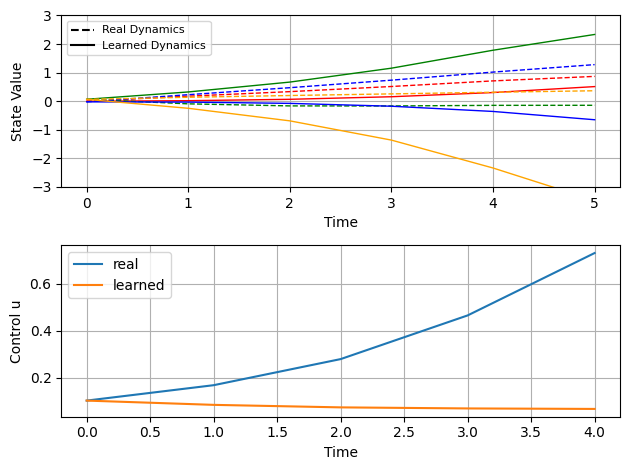


3d plot


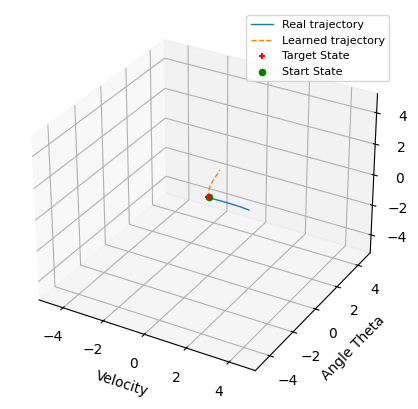

1.1722764
From real dynamics and learned dynamics


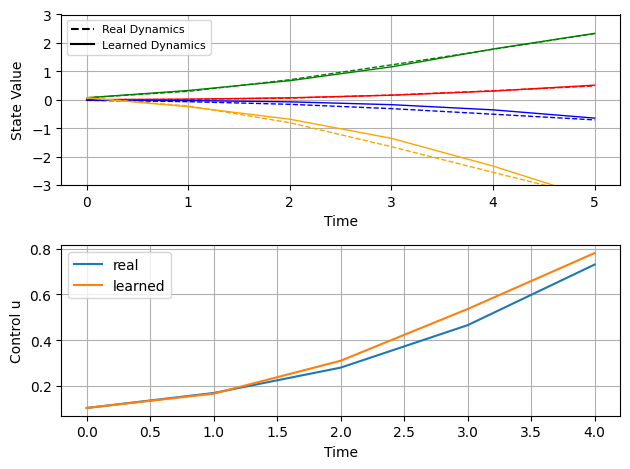


3d plot


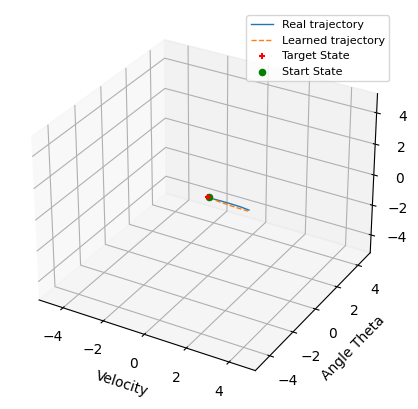

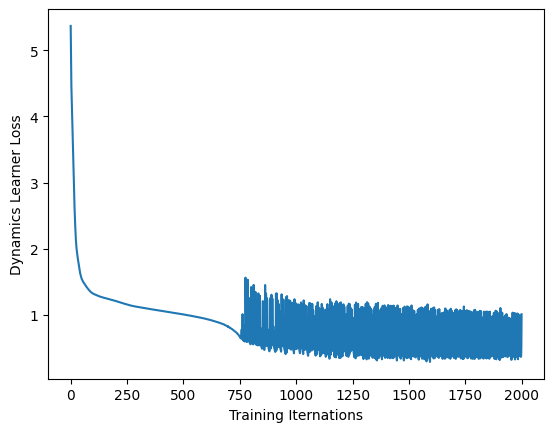


########### Move to next end time 1
7.836432
From real dynamics and learned dynamics


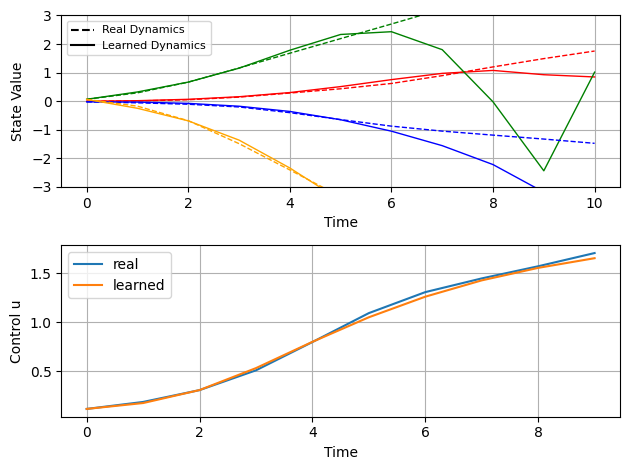


3d plot


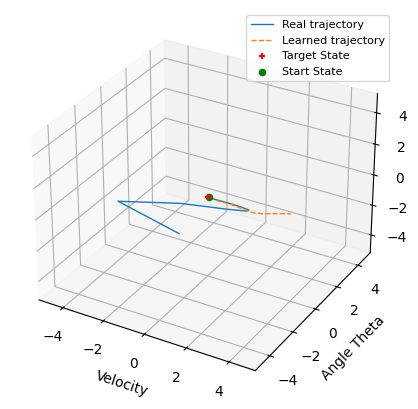

5.09927
From real dynamics and learned dynamics


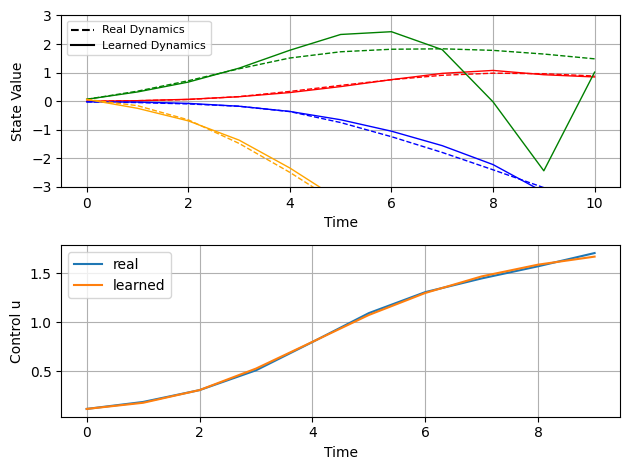


3d plot


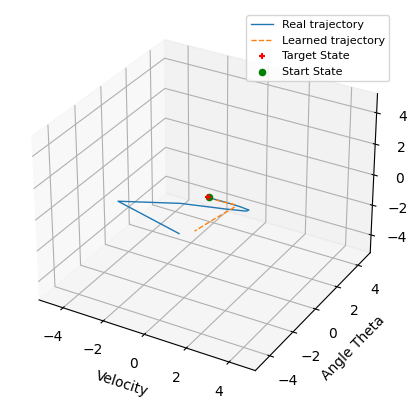

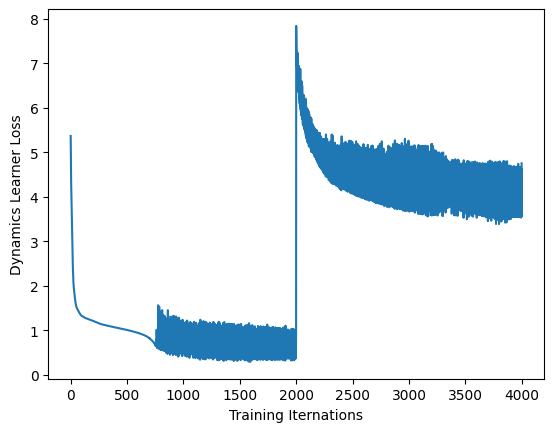


########### Move to next end time 1.5
18.206846
From real dynamics and learned dynamics


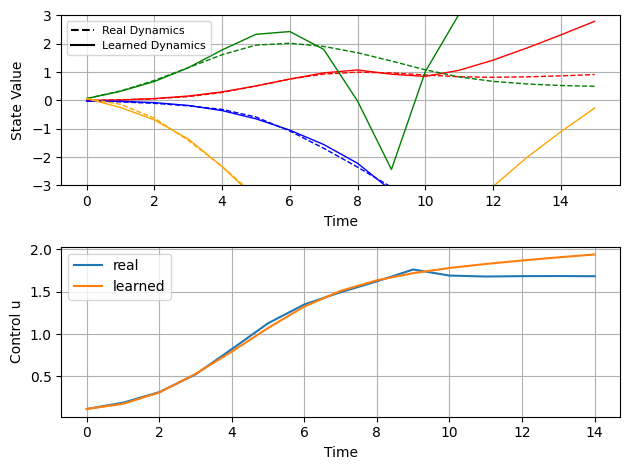


3d plot


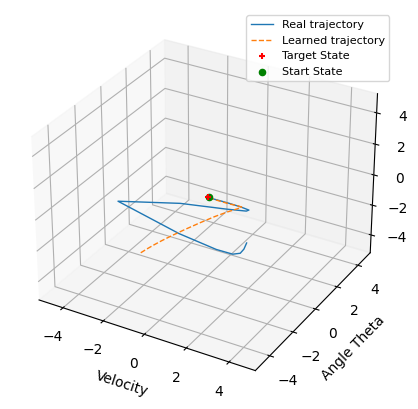

10.46182
From real dynamics and learned dynamics


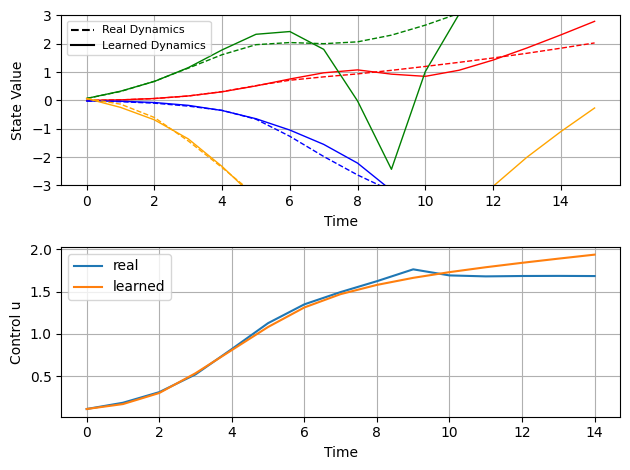


3d plot


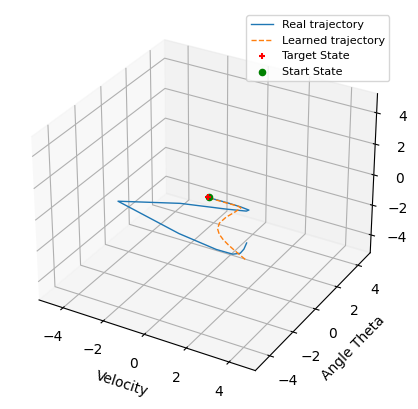

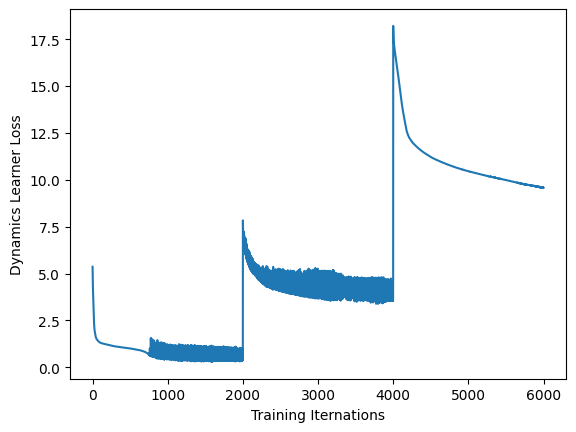

####### $$$$$$$$$$$$$$$$$$$$$#
start con
135.2079
7.566388
4.1819167
3.323375
3.2389152
3.1261315
3.1384714
2.9802074
2.985075
2.8492105
Finish controller training, plot loss:


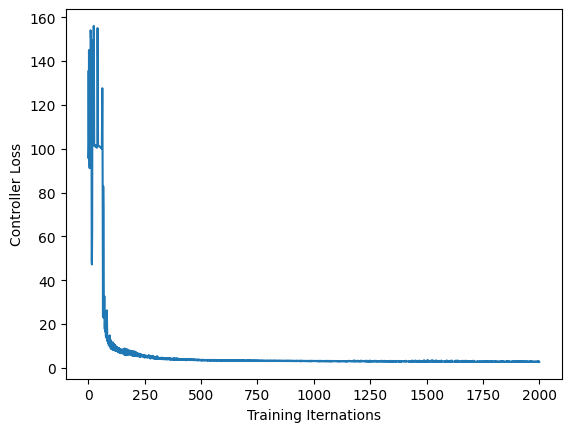

Finish controller training, plot trajectories:


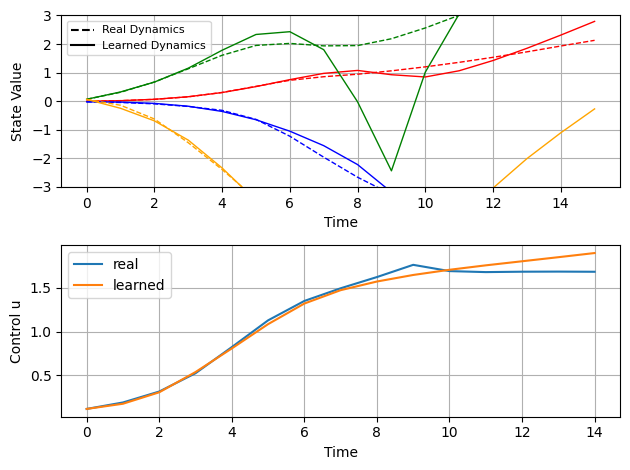

################################################



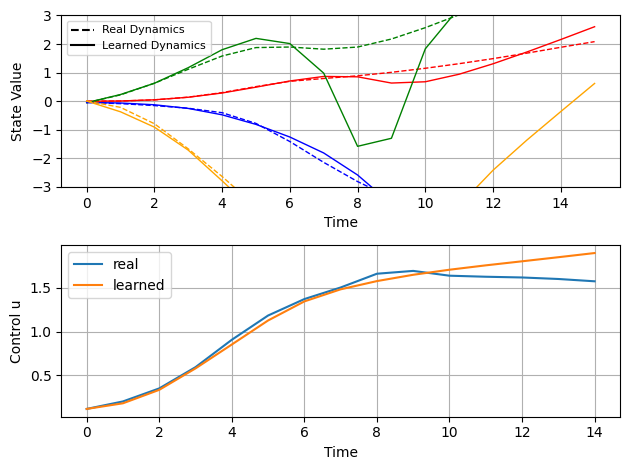

################################################


#########################################################
Alternation 1
#########################################################
start dyn

########### Move to next end time 0.5
0.7004024
From real dynamics and learned dynamics


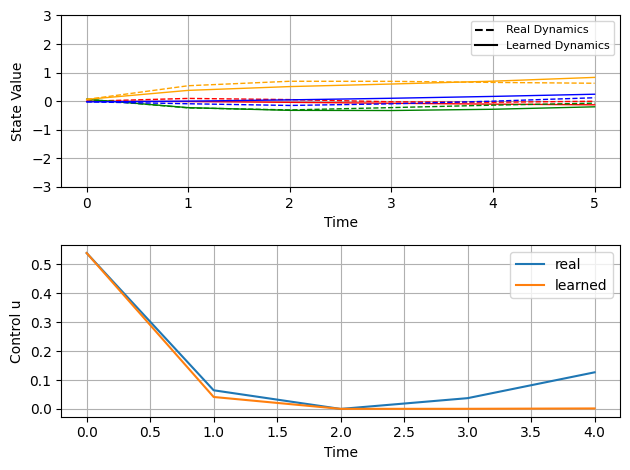


3d plot


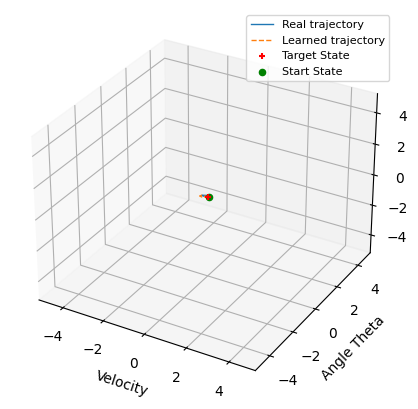

0.16646655
From real dynamics and learned dynamics


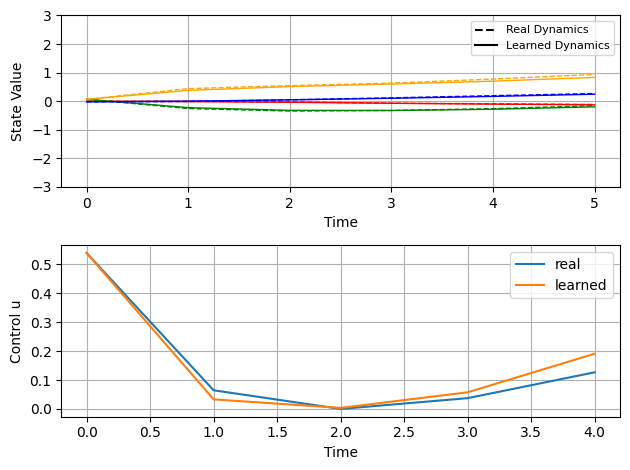


3d plot


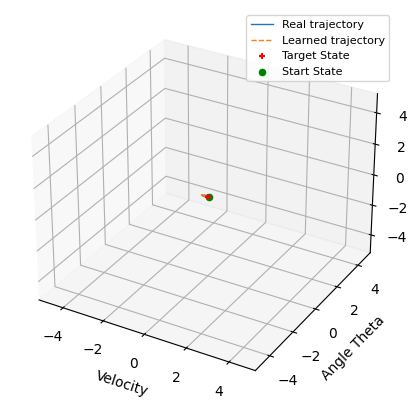

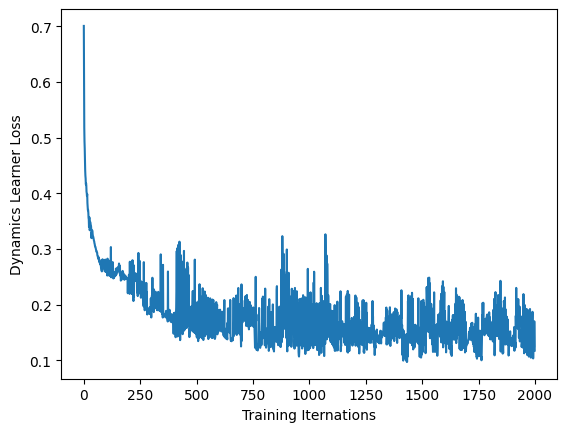


########### Move to next end time 1
1.4209836
From real dynamics and learned dynamics


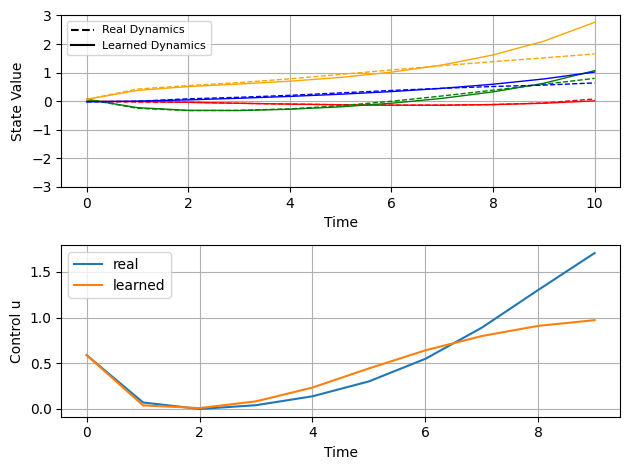


3d plot


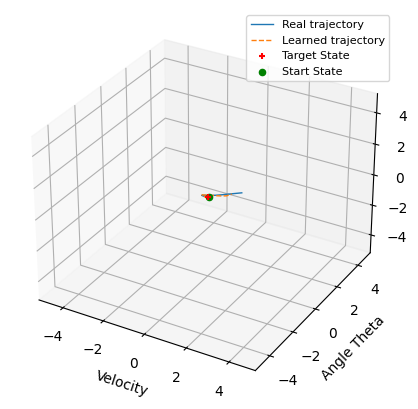

1.0878812
From real dynamics and learned dynamics


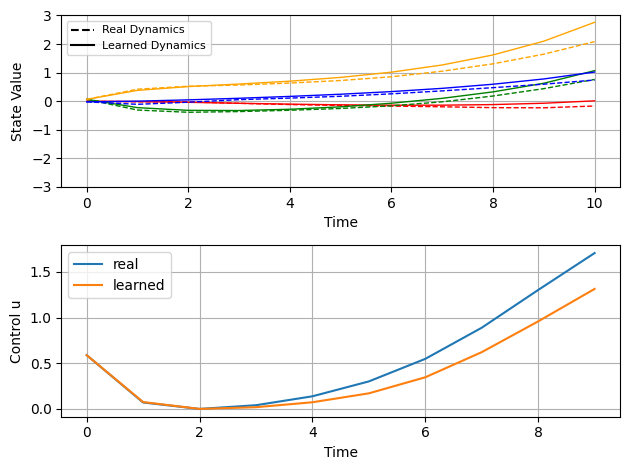


3d plot


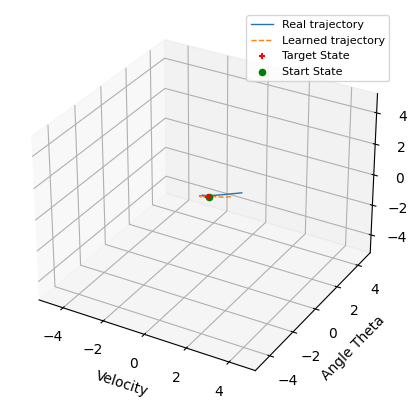

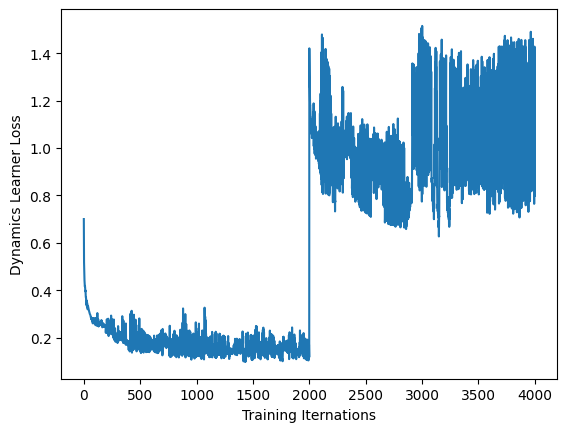


########### Move to next end time 1.5
7.831867
From real dynamics and learned dynamics


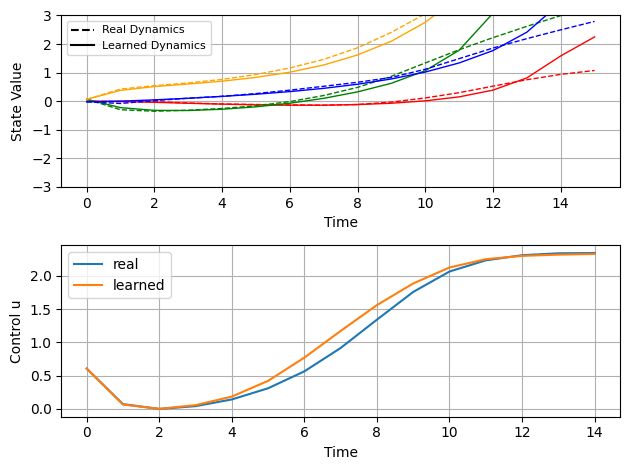


3d plot


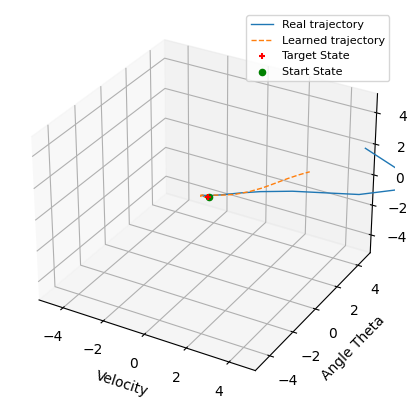

6.1197677
From real dynamics and learned dynamics


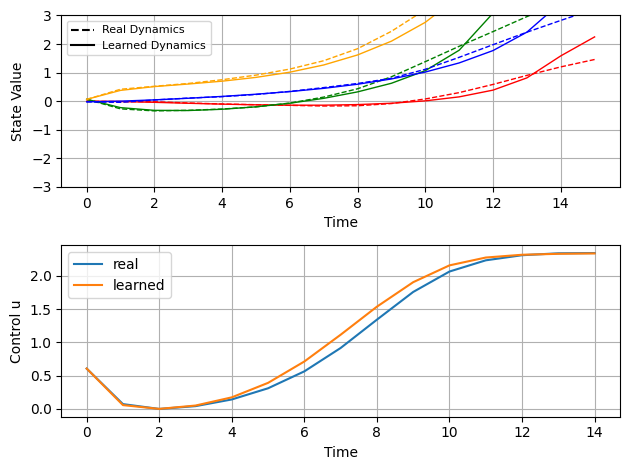


3d plot


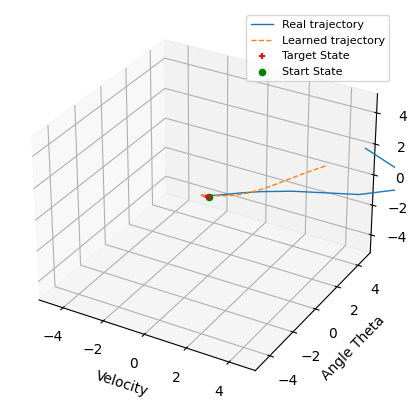

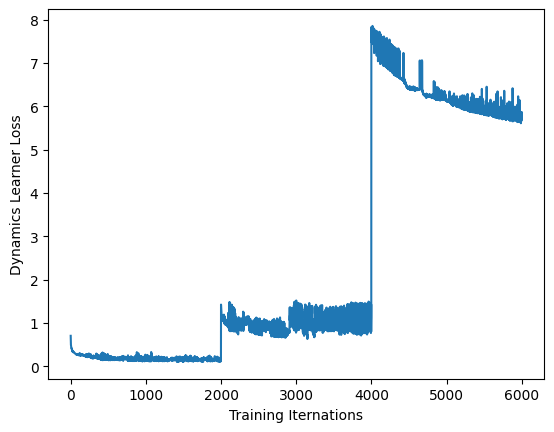

####### $$$$$$$$$$$$$$$$$$$$$#
start con
75.113266
21.739088
85.572235
29.455896
12.242455
15.096402
12.249009
10.763408
10.787551
8.235942
Finish controller training, plot loss:


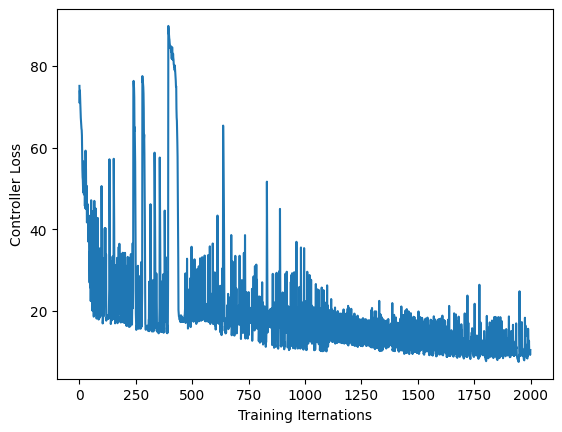

Finish controller training, plot trajectories:


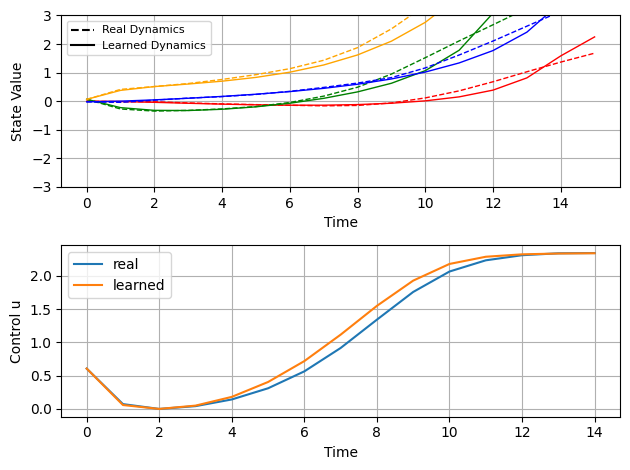

################################################



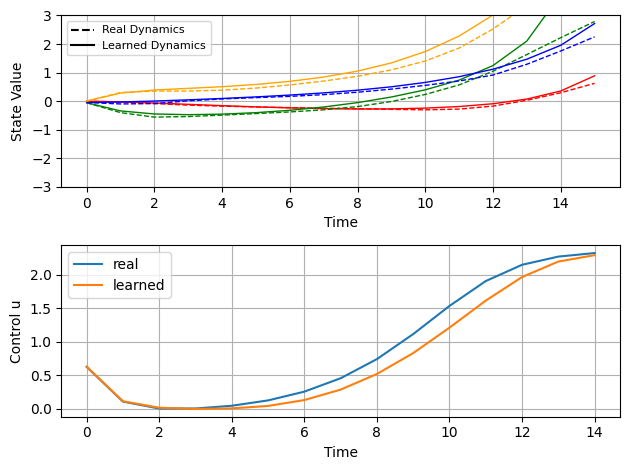

################################################


#########################################################
Alternation 2
#########################################################
start dyn

########### Move to next end time 0.5
2.0968318
From real dynamics and learned dynamics


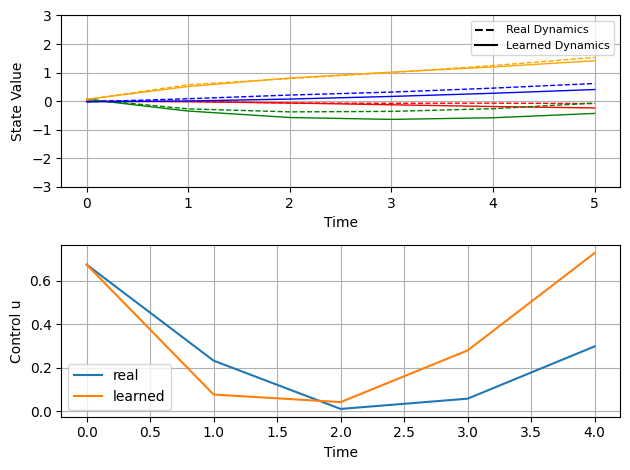


3d plot


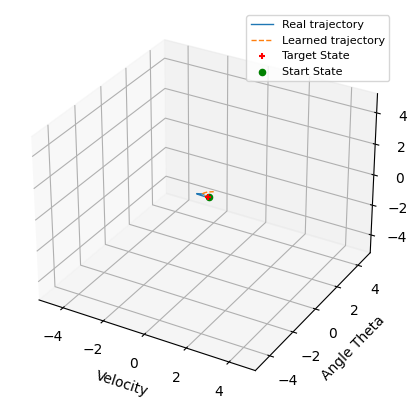

0.12034036
From real dynamics and learned dynamics


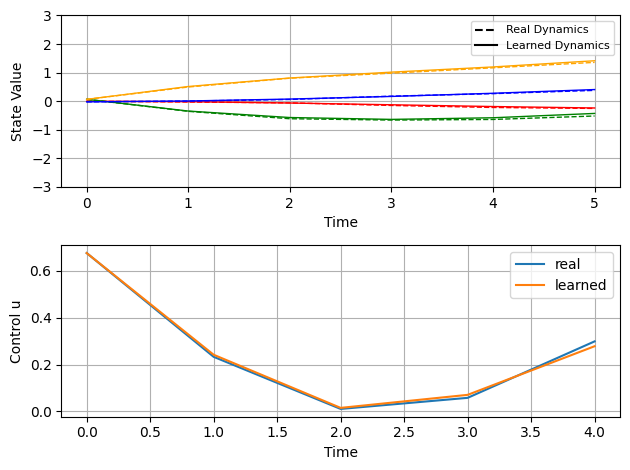


3d plot


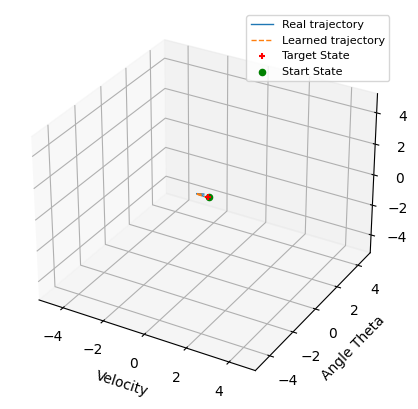

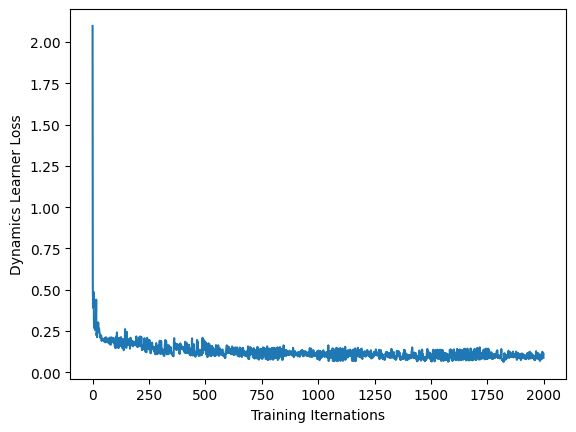


########### Move to next end time 1
1.8338082
From real dynamics and learned dynamics


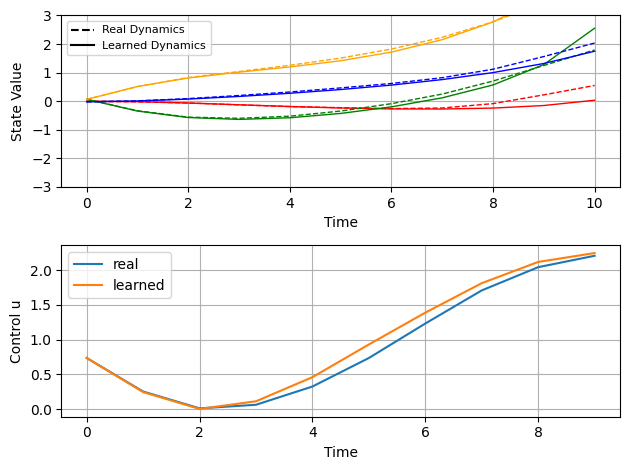


3d plot


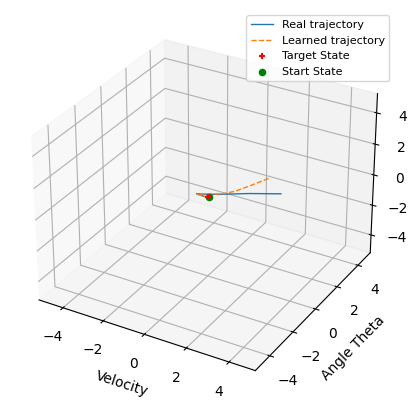

0.911421
From real dynamics and learned dynamics


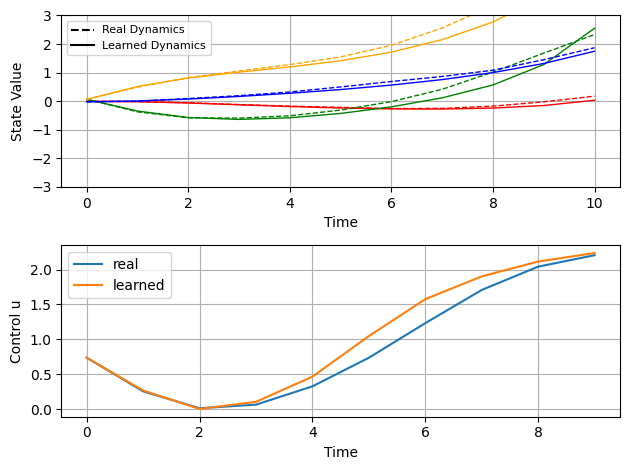


3d plot


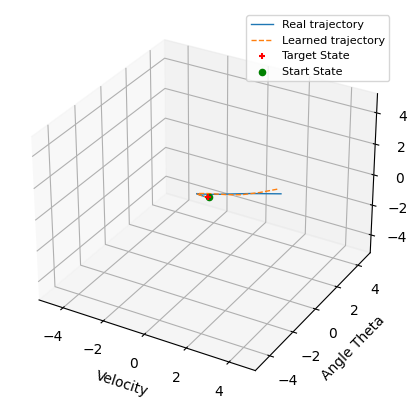

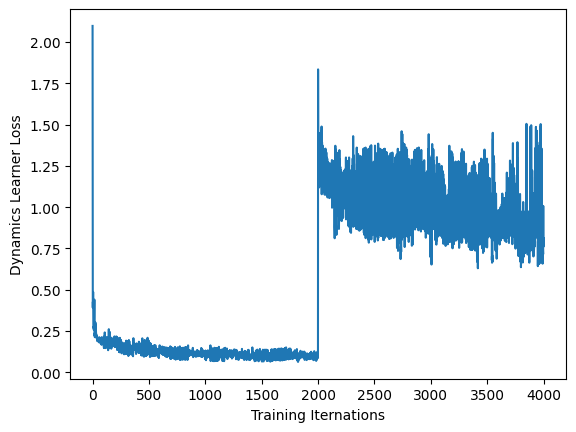


########### Move to next end time 1.5
9.505692
From real dynamics and learned dynamics


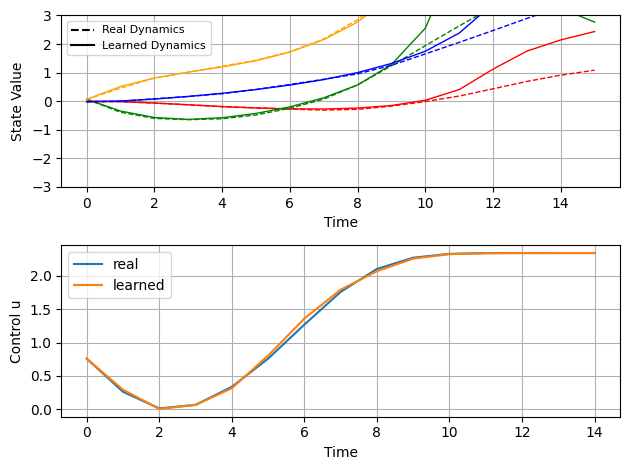


3d plot


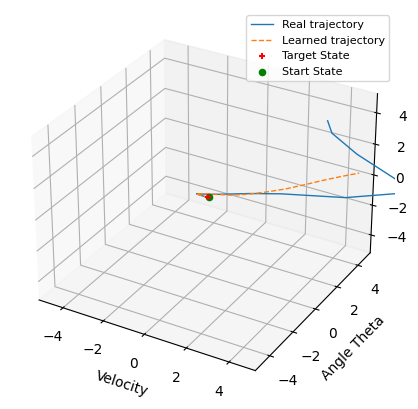

7.5674486
From real dynamics and learned dynamics


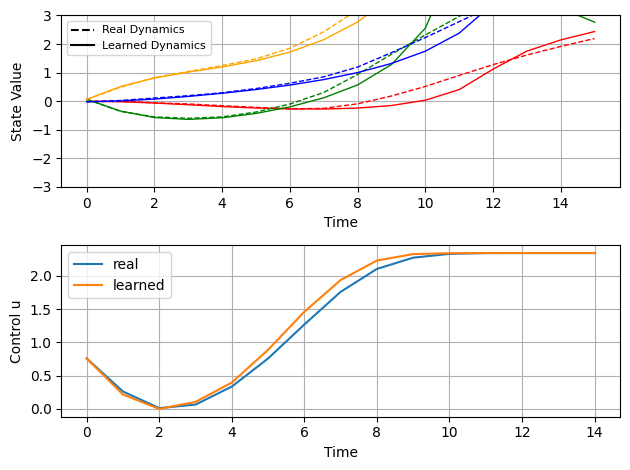


3d plot


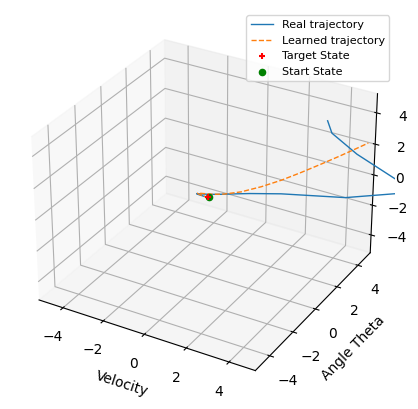

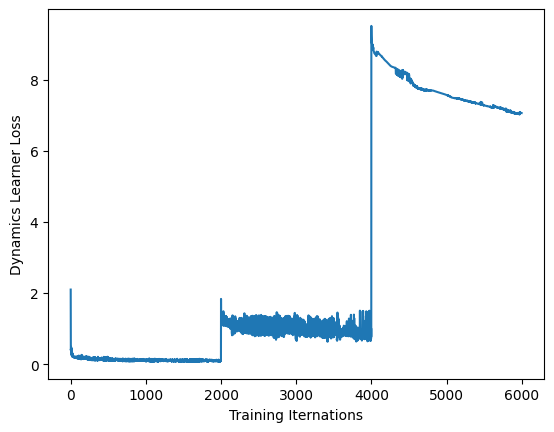

####### $$$$$$$$$$$$$$$$$$$$$#
start con
116.606606
81.91783
82.27223
81.10185
79.86698
79.38871
79.193535
78.96865
79.9987
78.79818
Finish controller training, plot loss:


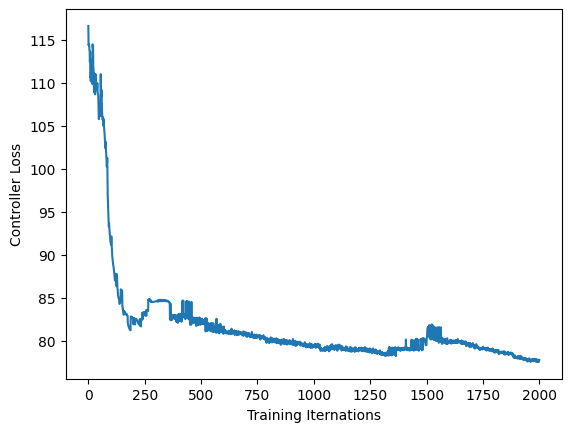

Finish controller training, plot trajectories:


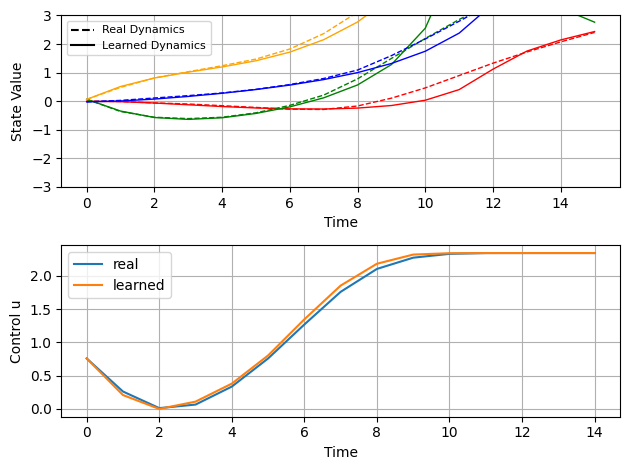

################################################



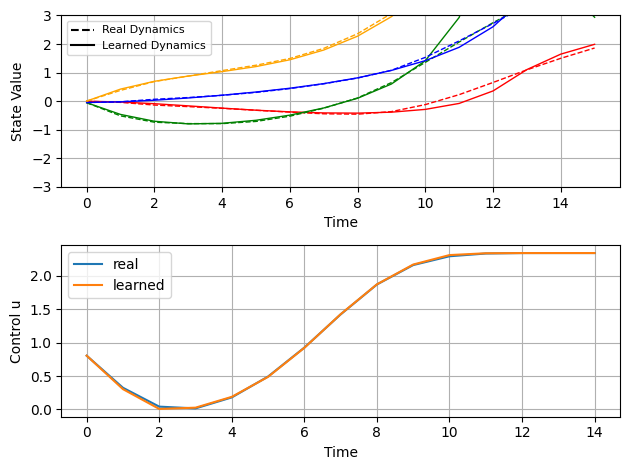

################################################


#########################################################
Alternation 3
#########################################################
start dyn

########### Move to next end time 0.5
0.33422872
From real dynamics and learned dynamics


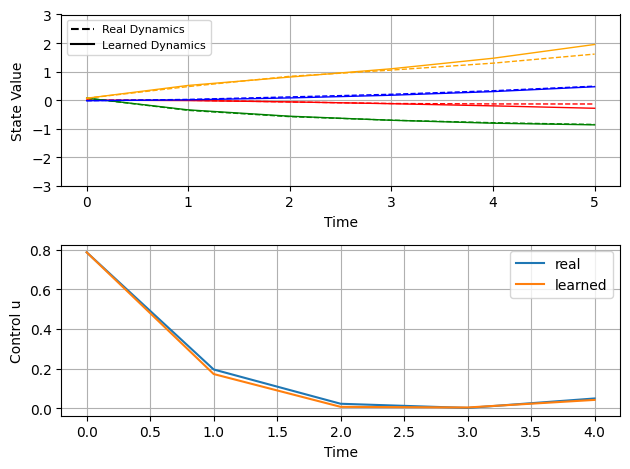


3d plot


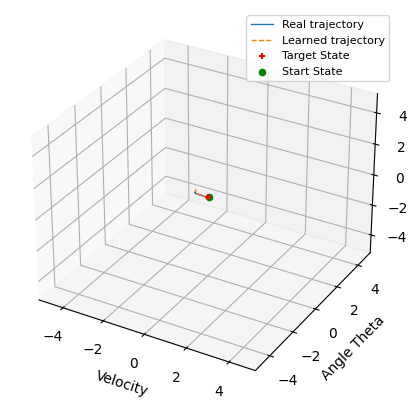

0.14586185
From real dynamics and learned dynamics


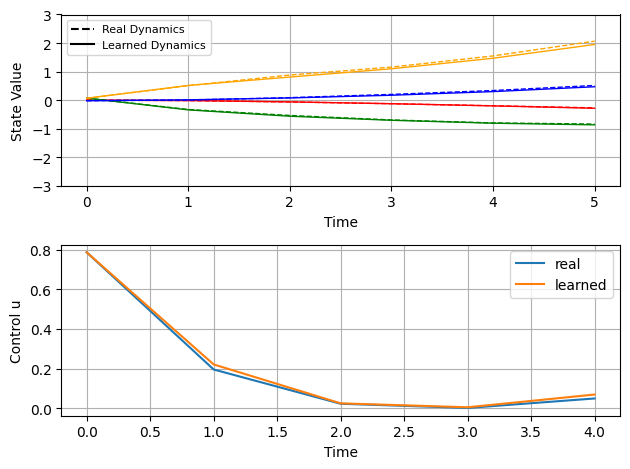


3d plot


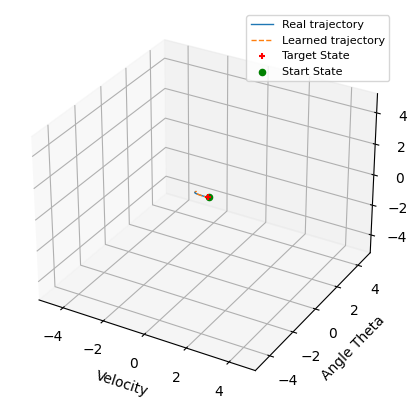

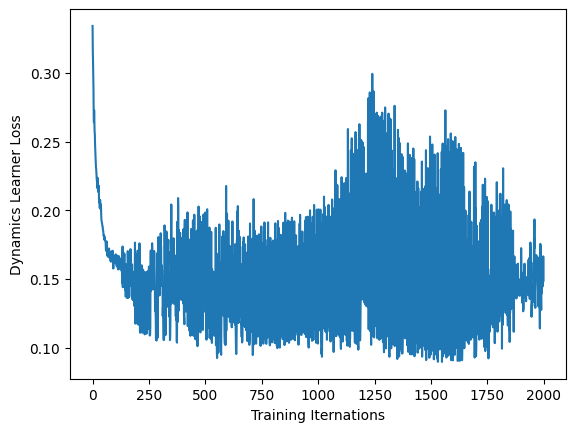


########### Move to next end time 1
3.9716442
From real dynamics and learned dynamics


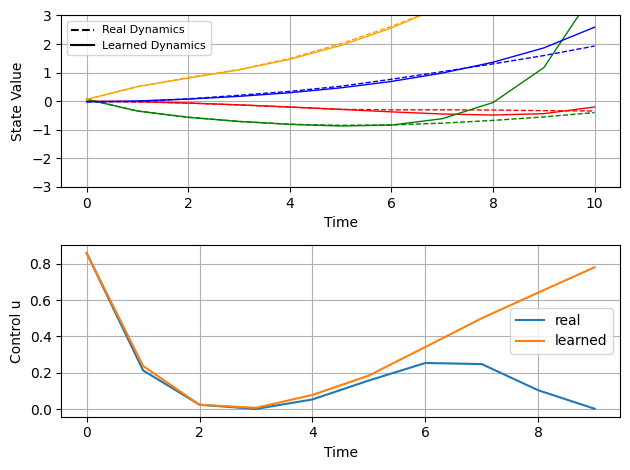


3d plot


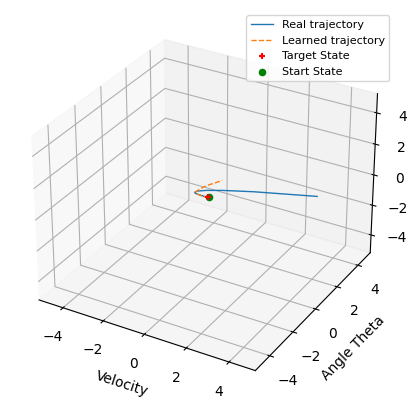

2.2540548
From real dynamics and learned dynamics


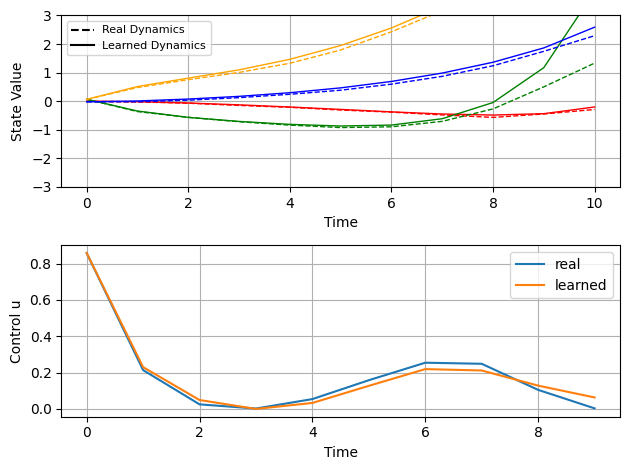


3d plot


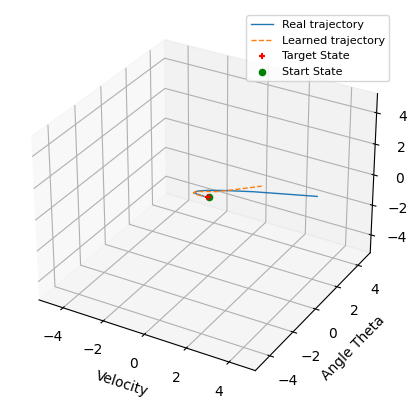

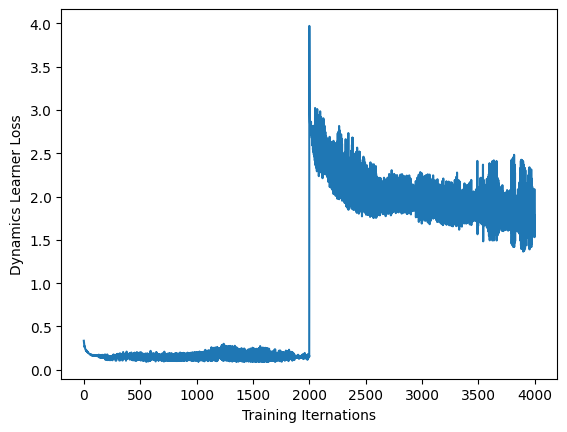


########### Move to next end time 1.5
16.356033
From real dynamics and learned dynamics


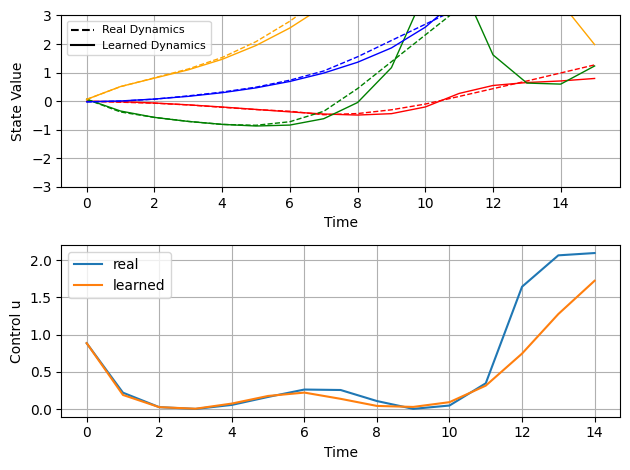


3d plot


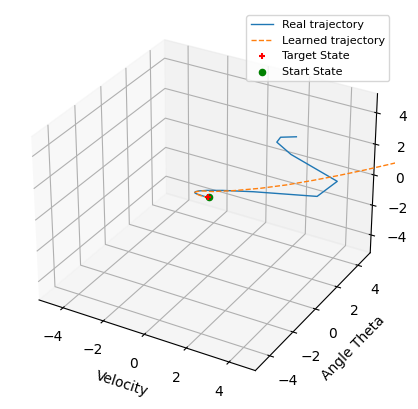

10.171016
From real dynamics and learned dynamics


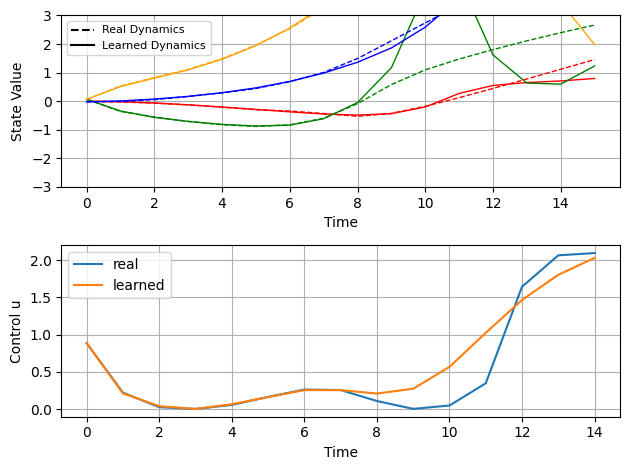


3d plot


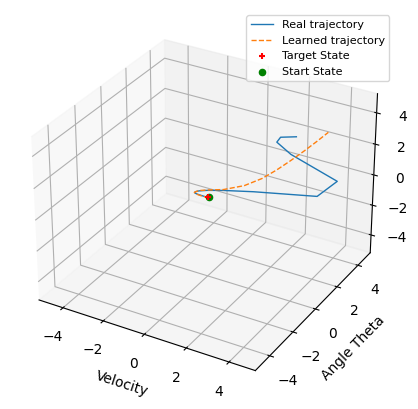

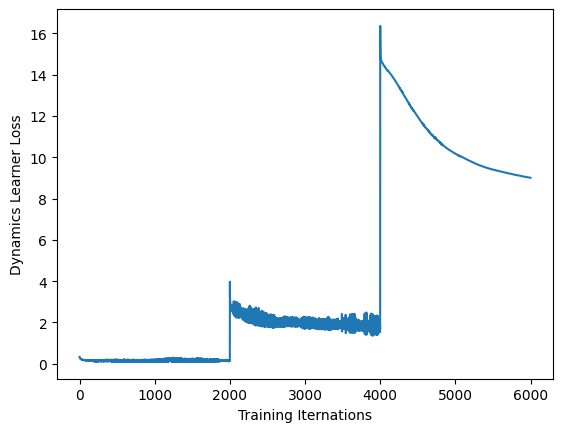

####### $$$$$$$$$$$$$$$$$$$$$#
start con
146.08884
141.9977
138.66614
136.49431
134.35118
133.02414
131.56386
131.00343
129.63826
129.69673
Finish controller training, plot loss:


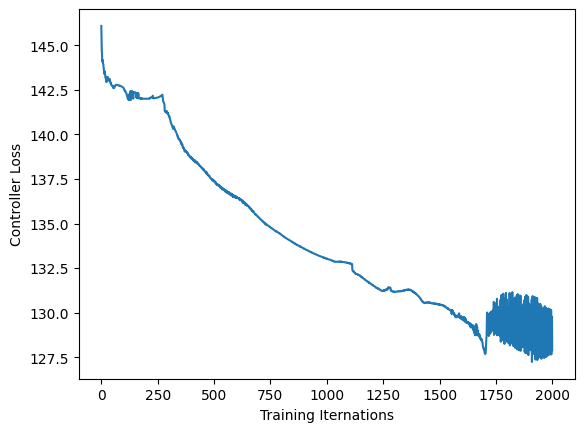

Finish controller training, plot trajectories:


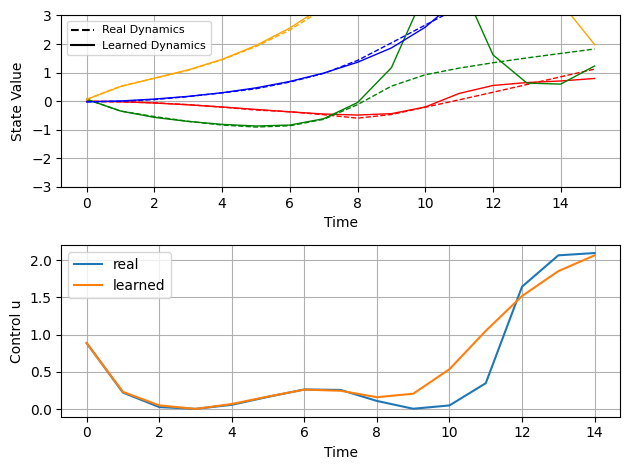

################################################



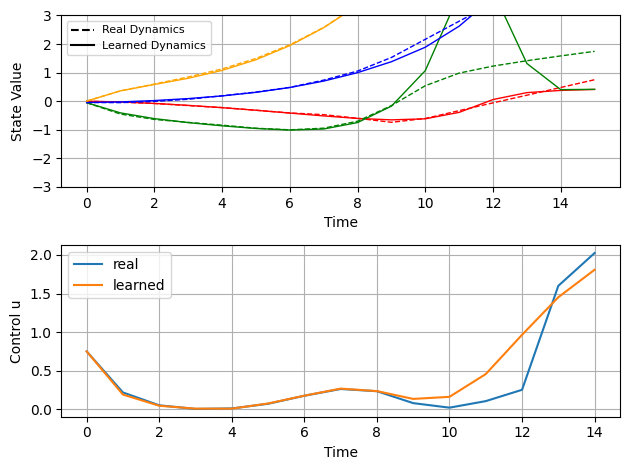

################################################


#########################################################
Alternation 4
#########################################################
start dyn

########### Move to next end time 0.5
0.27127314
From real dynamics and learned dynamics


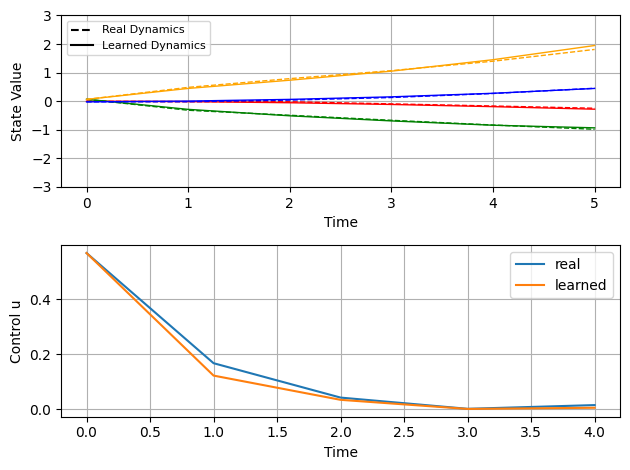


3d plot


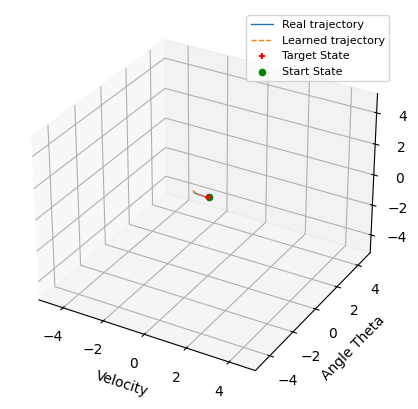

0.2002383
From real dynamics and learned dynamics


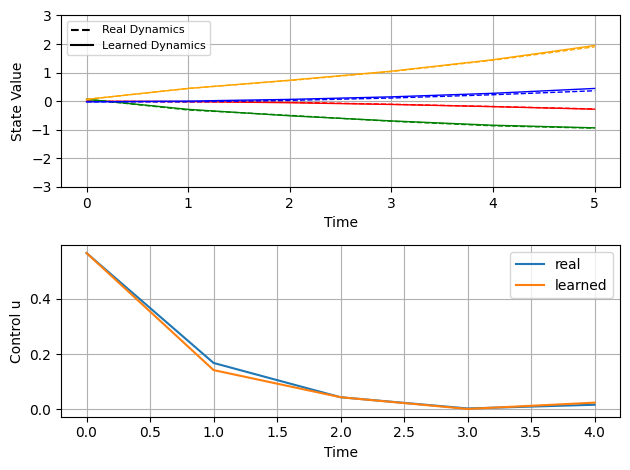


3d plot


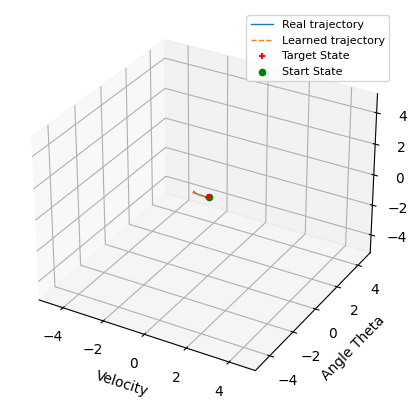

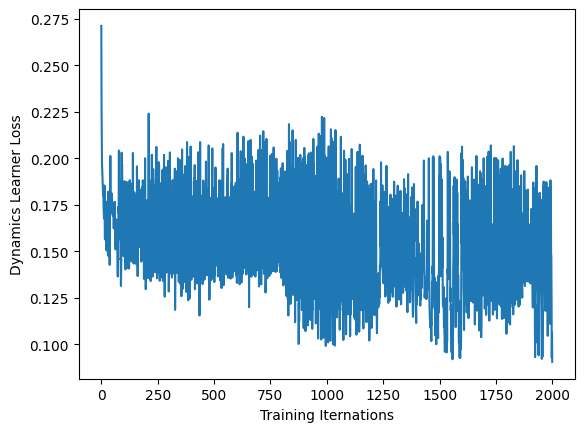


########### Move to next end time 1
3.0114503
From real dynamics and learned dynamics


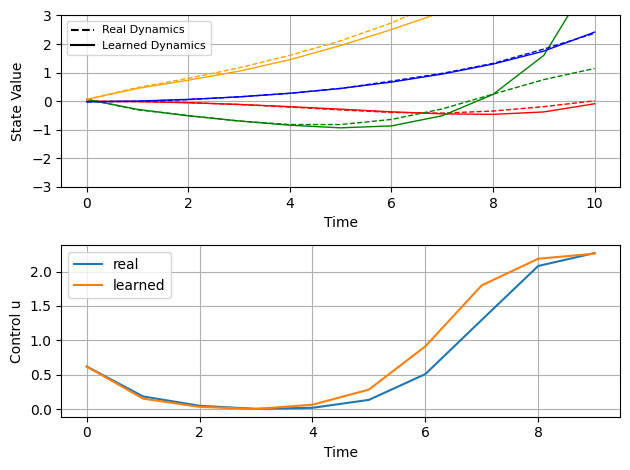


3d plot


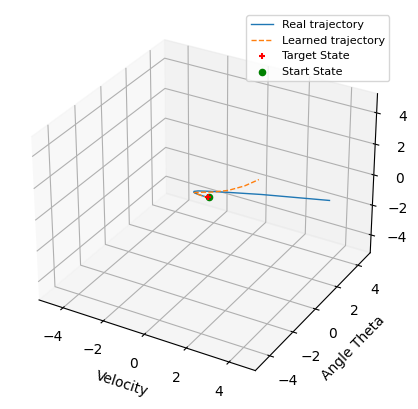

1.9609064
From real dynamics and learned dynamics


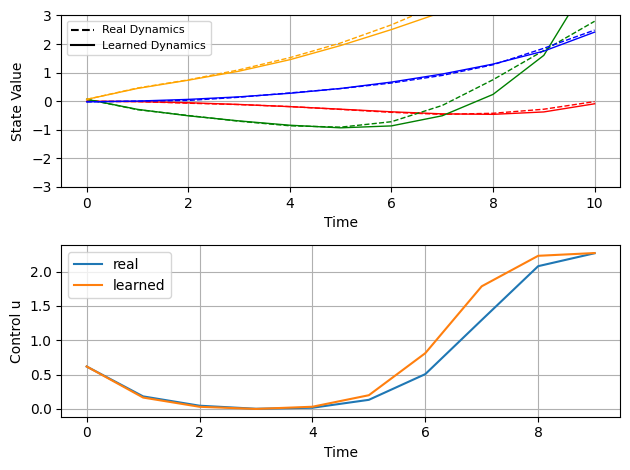


3d plot


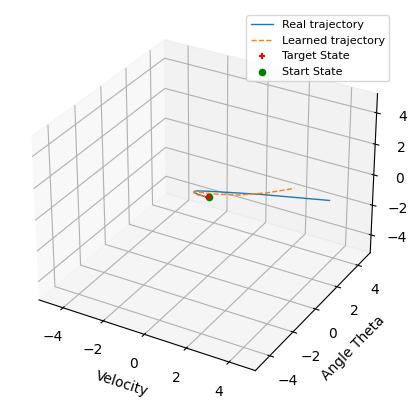

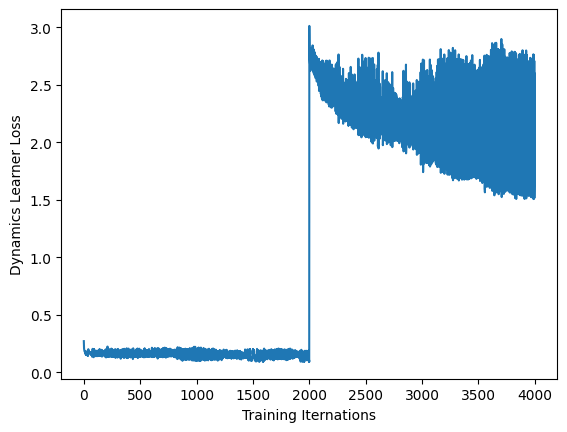


########### Move to next end time 1.5
13.548888
From real dynamics and learned dynamics


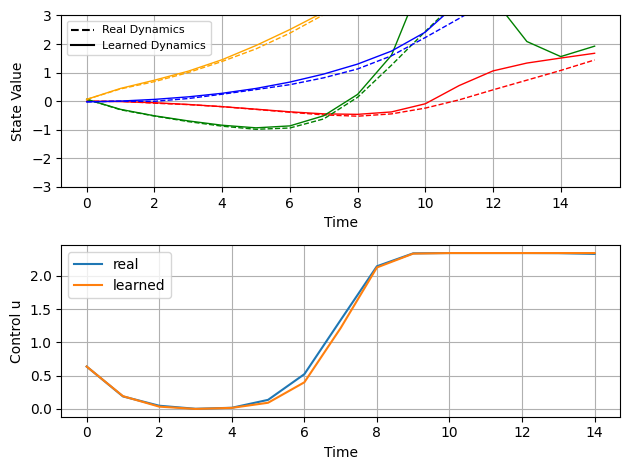


3d plot


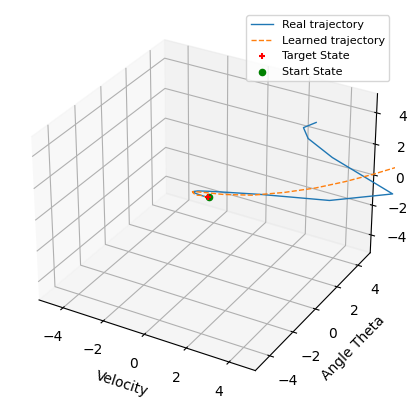

8.496408
From real dynamics and learned dynamics


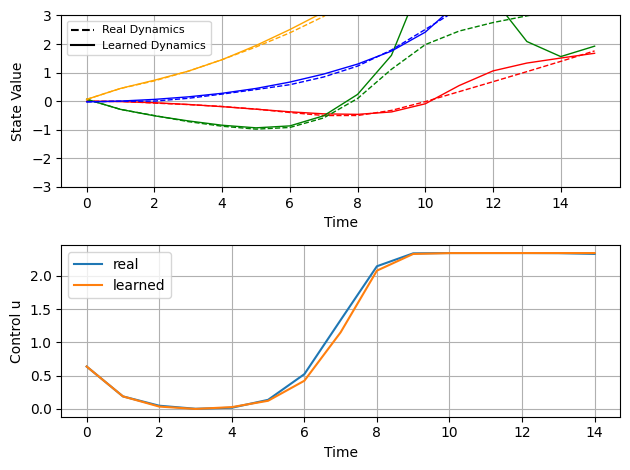


3d plot


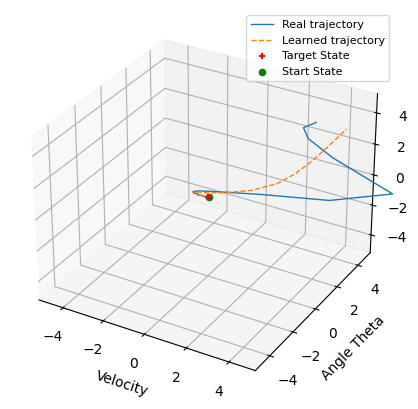

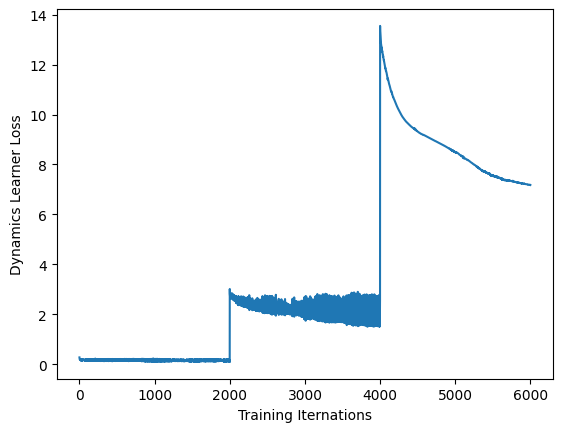

####### $$$$$$$$$$$$$$$$$$$$$#
start con
141.27705
95.30954
94.86387
91.83115
91.43129
88.4616
81.230125
80.11623
79.56531
79.83618
Finish controller training, plot loss:


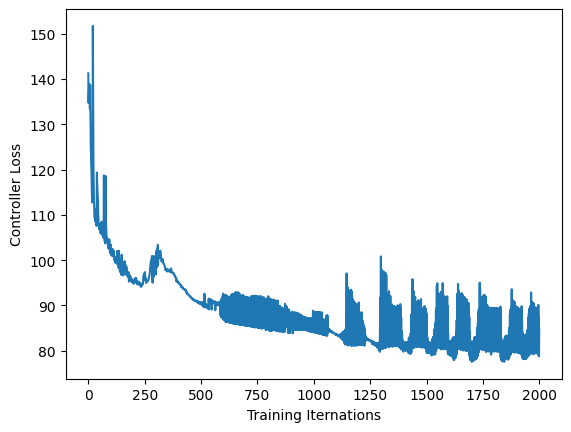

Finish controller training, plot trajectories:


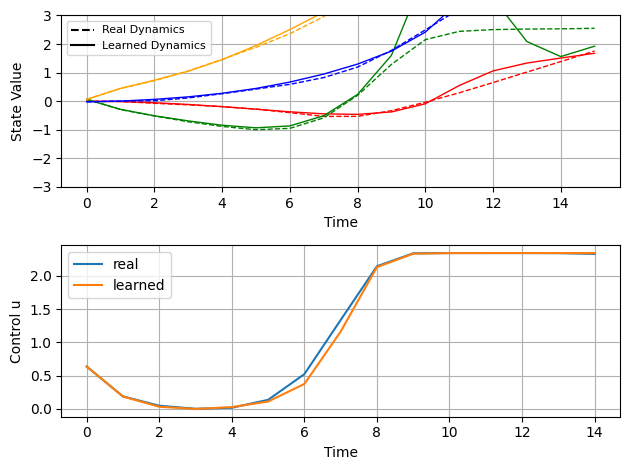

################################################



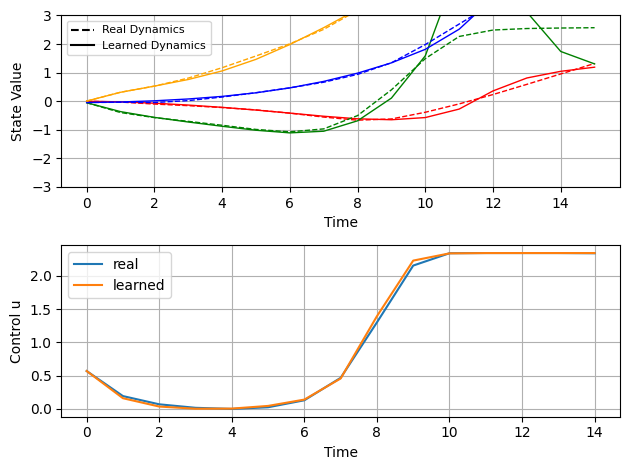

################################################


#########################################################
Alternation 5
#########################################################
start dyn

########### Move to next end time 0.5
0.7810273
From real dynamics and learned dynamics


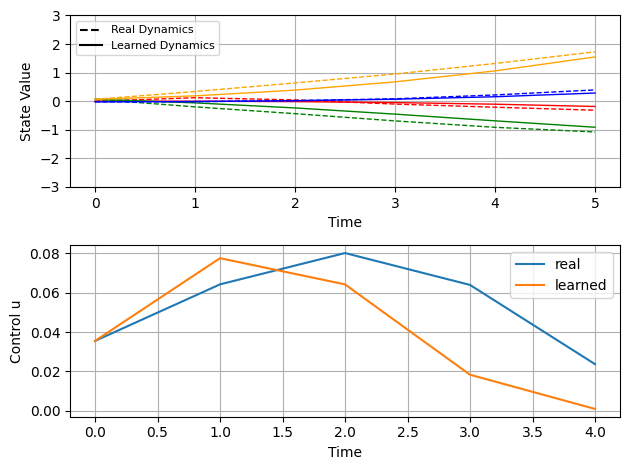


3d plot


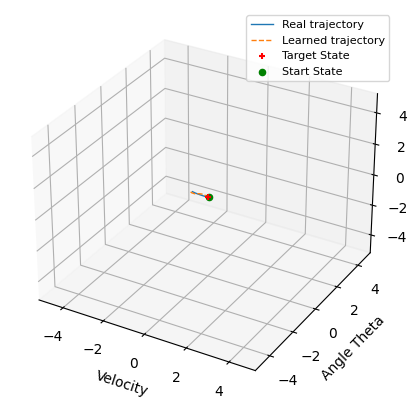

0.12554656
From real dynamics and learned dynamics


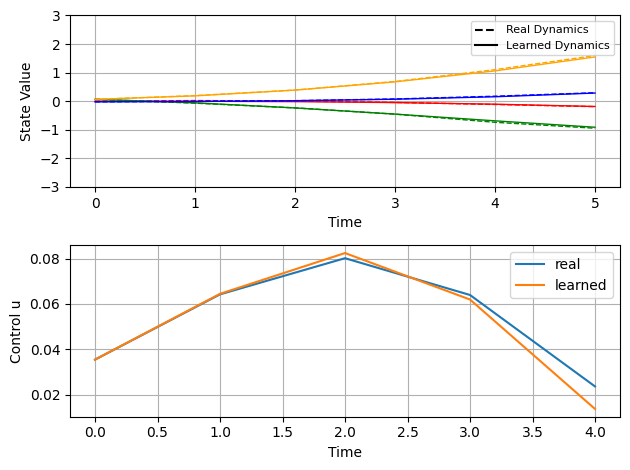


3d plot


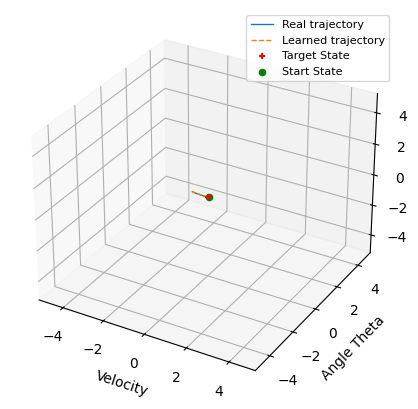

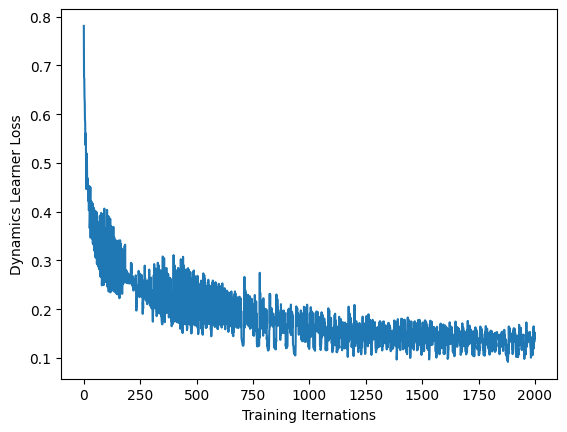


########### Move to next end time 1
2.142621
From real dynamics and learned dynamics


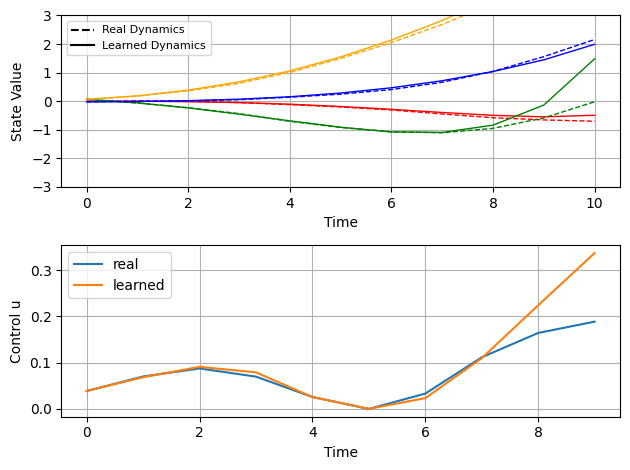


3d plot


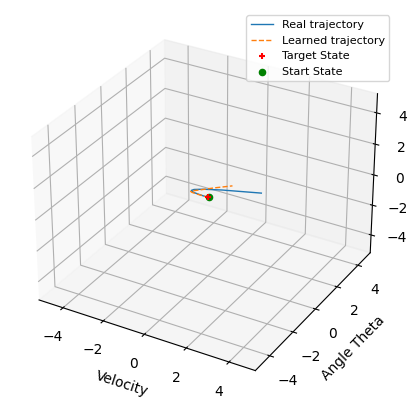

1.2347603
From real dynamics and learned dynamics


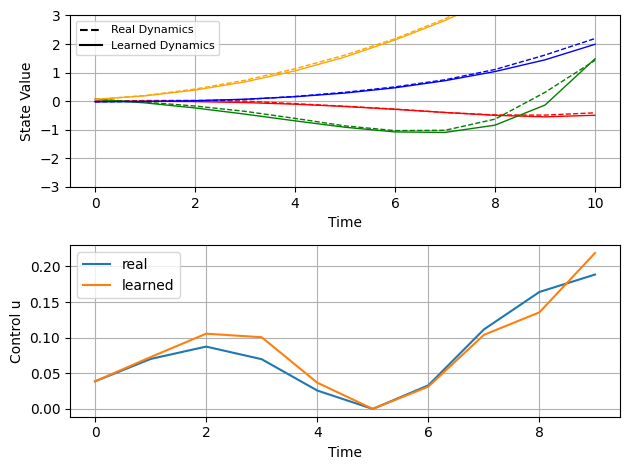


3d plot


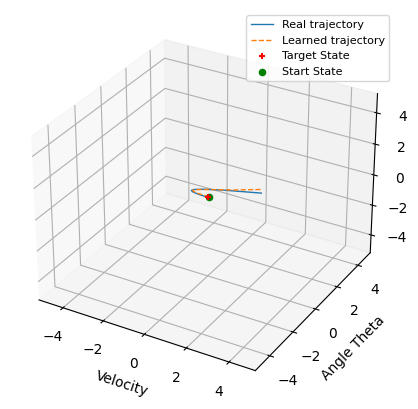

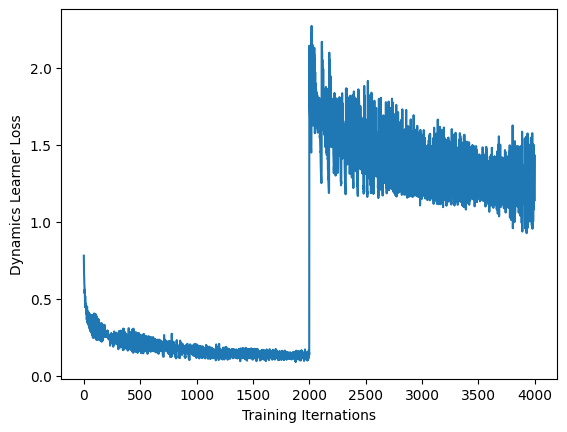


########### Move to next end time 1.5
12.33016
From real dynamics and learned dynamics


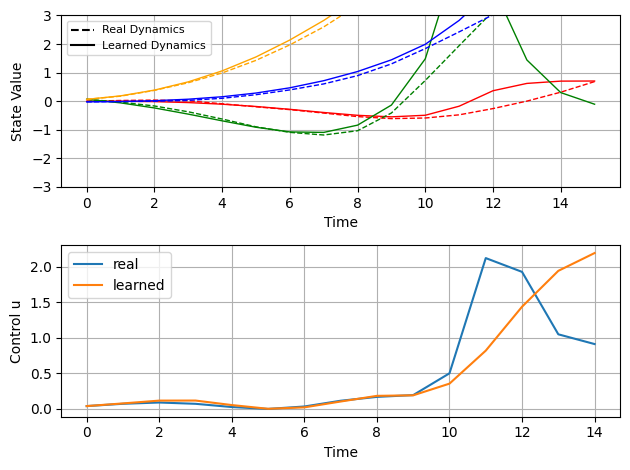


3d plot


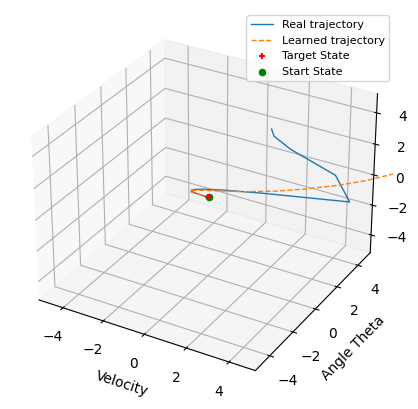

6.274949
From real dynamics and learned dynamics


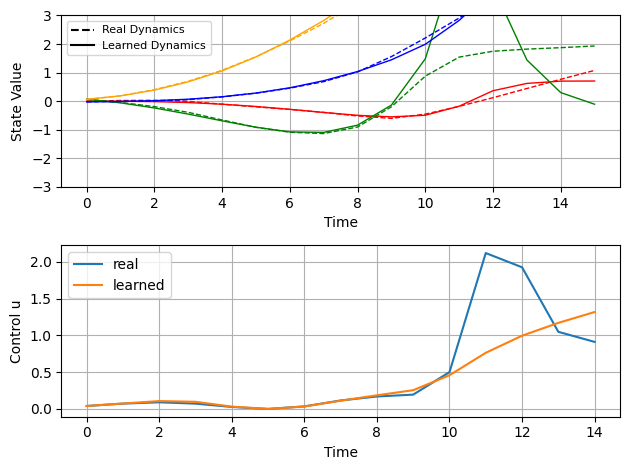


3d plot


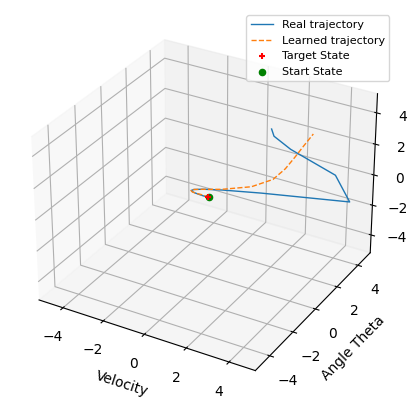

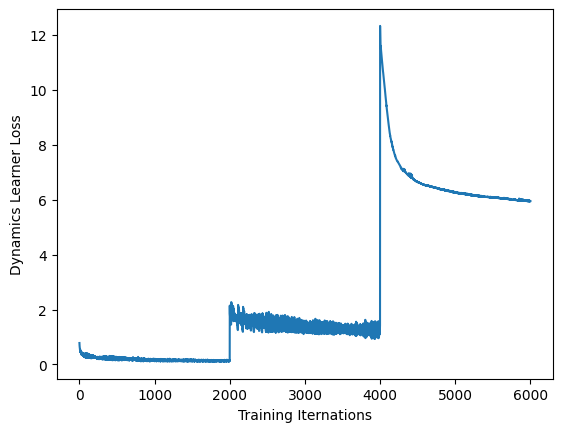

####### $$$$$$$$$$$$$$$$$$$$$#
start con
113.83135
110.86912
117.67272
113.29458
114.143875
115.0353
122.909966
118.39999
111.8044
113.63979
Finish controller training, plot loss:


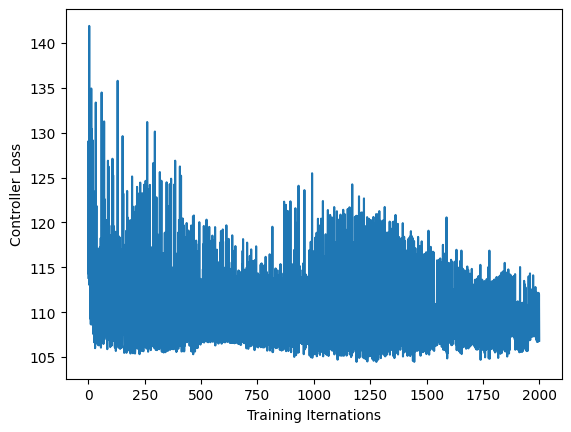

Finish controller training, plot trajectories:


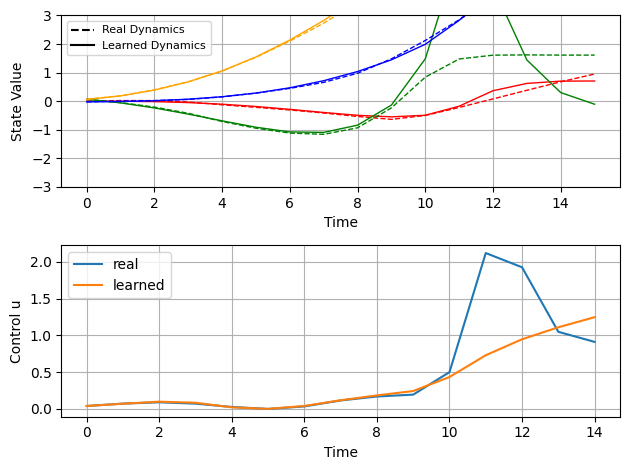

################################################



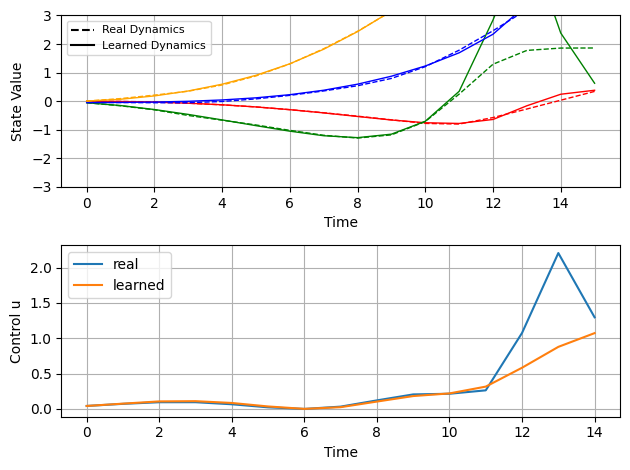

################################################


#########################################################
Alternation 6
#########################################################
start dyn

########### Move to next end time 0.5
0.2654366
From real dynamics and learned dynamics


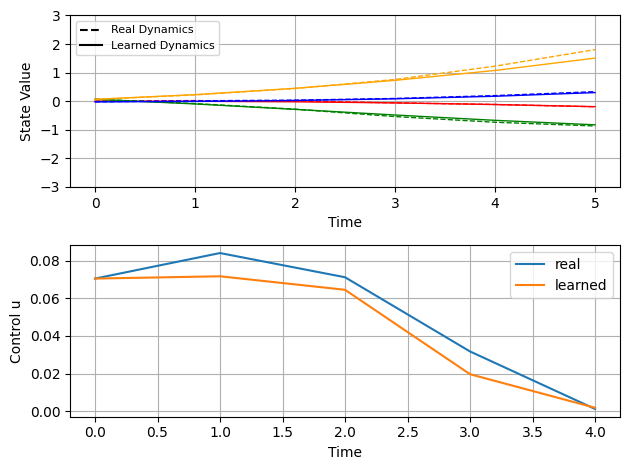


3d plot


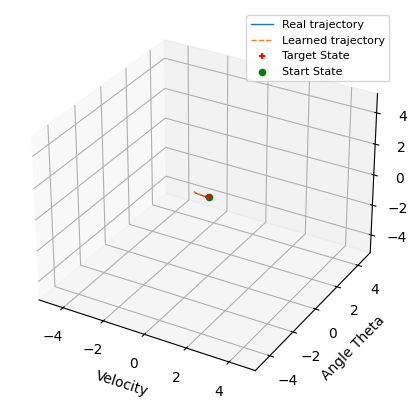

0.16872321
From real dynamics and learned dynamics


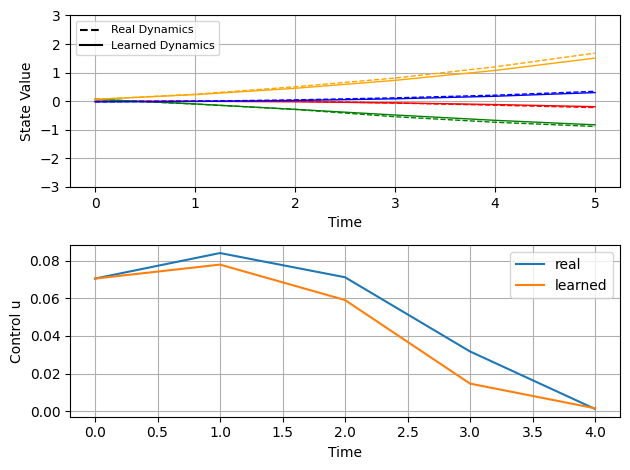


3d plot


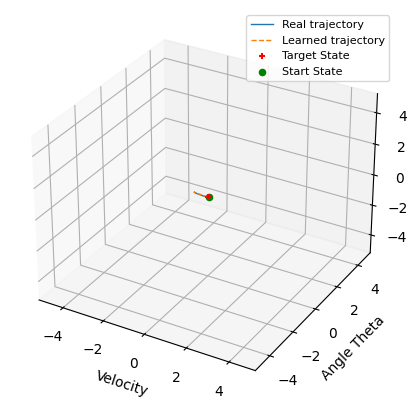

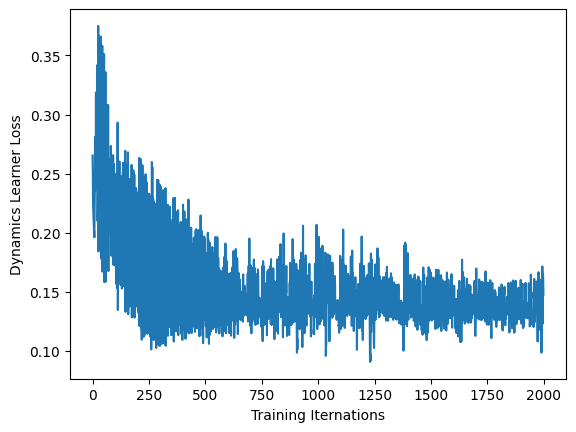


########### Move to next end time 1
1.9610415
From real dynamics and learned dynamics


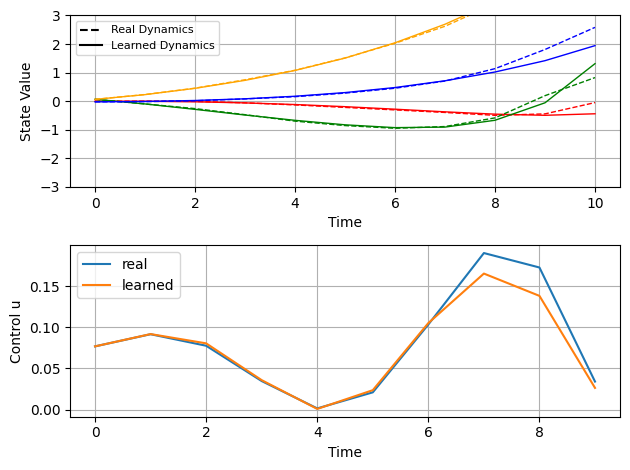


3d plot


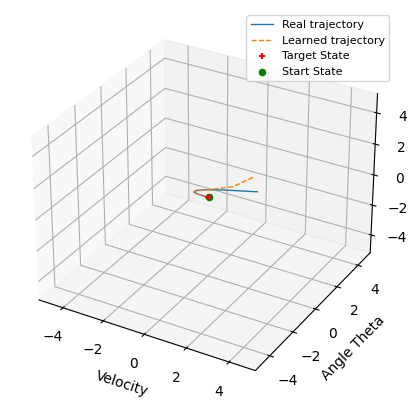

1.2497001
From real dynamics and learned dynamics


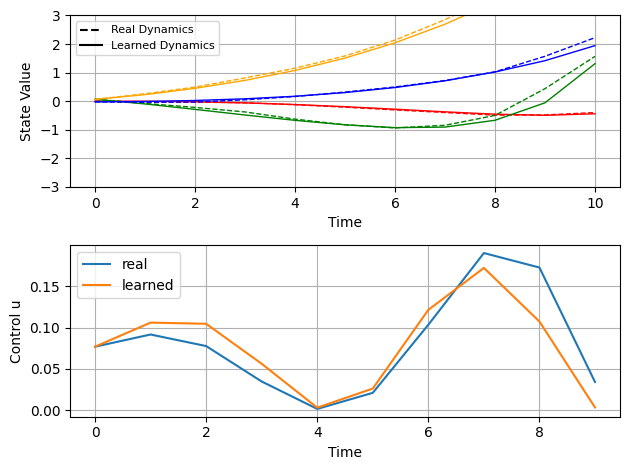


3d plot


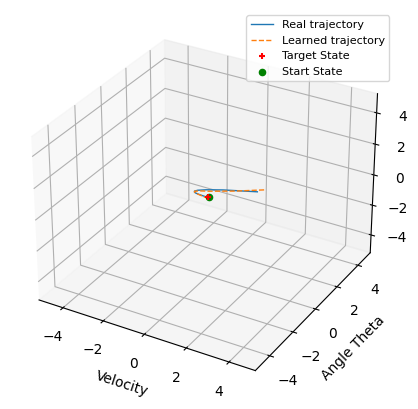

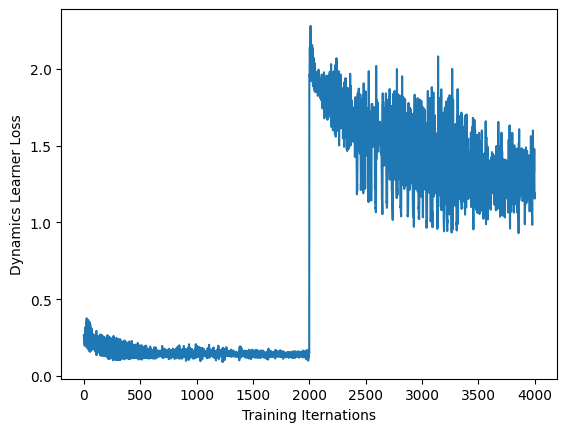


########### Move to next end time 1.5
12.755755
From real dynamics and learned dynamics


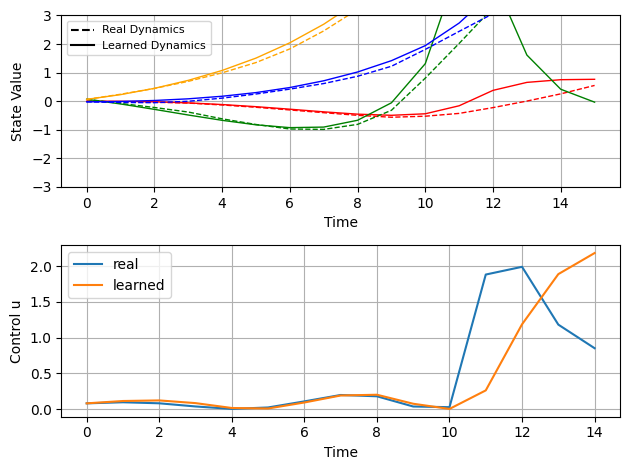


3d plot


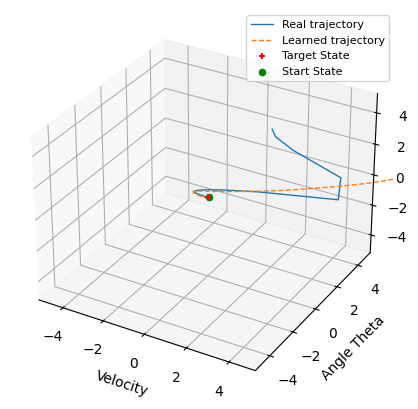

5.6731133
From real dynamics and learned dynamics


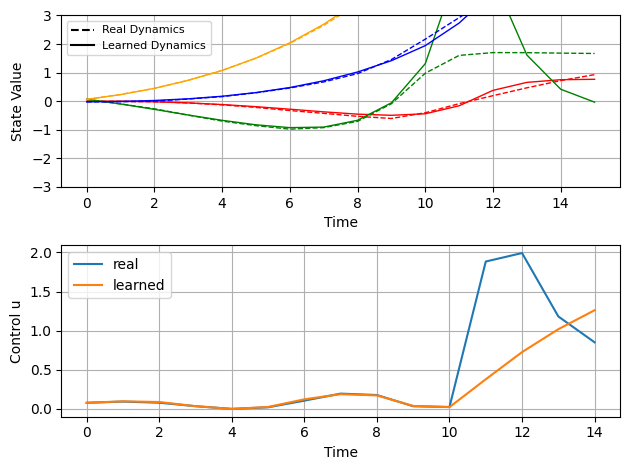


3d plot


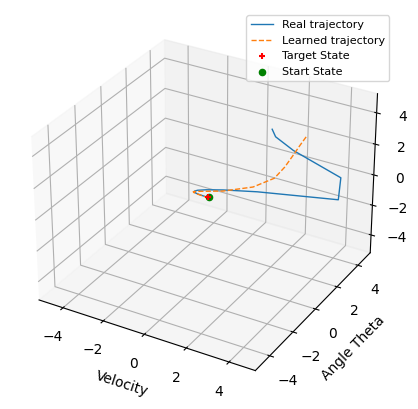

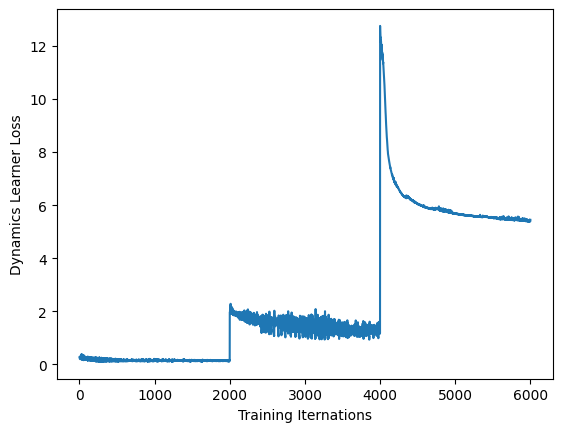

####### $$$$$$$$$$$$$$$$$$$$$#
start con
113.25651
107.58103
106.87046
105.28147
104.92947
105.32717
102.52675
101.86648
115.86956
148.33379
Finish controller training, plot loss:


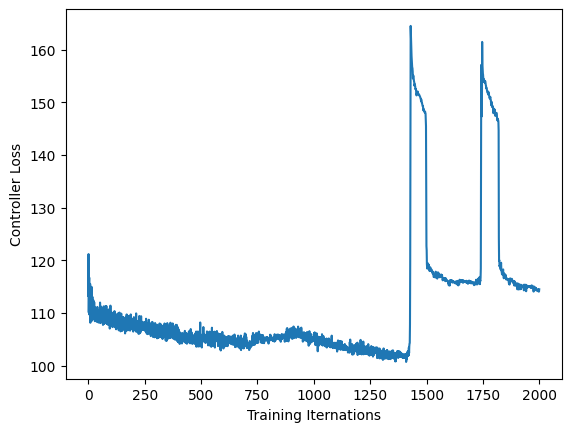

Finish controller training, plot trajectories:


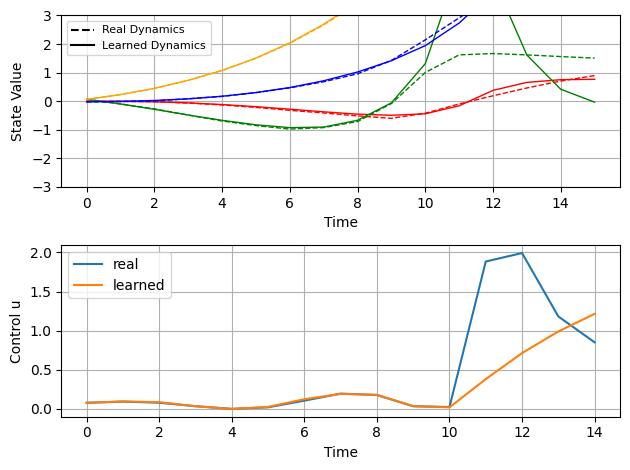

################################################



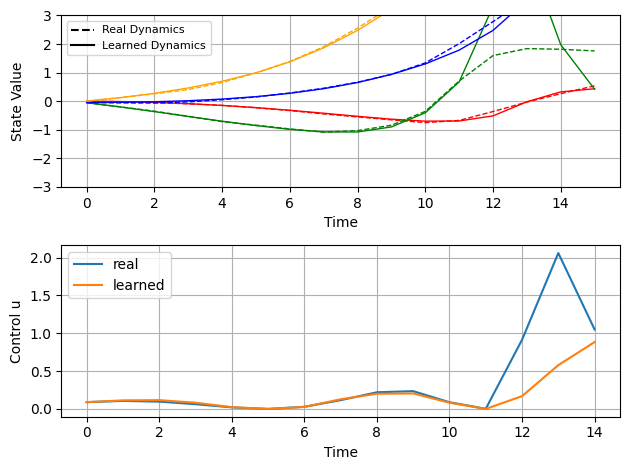

################################################


#########################################################
Alternation 7
#########################################################
start dyn

########### Move to next end time 0.5
1.6020383
From real dynamics and learned dynamics


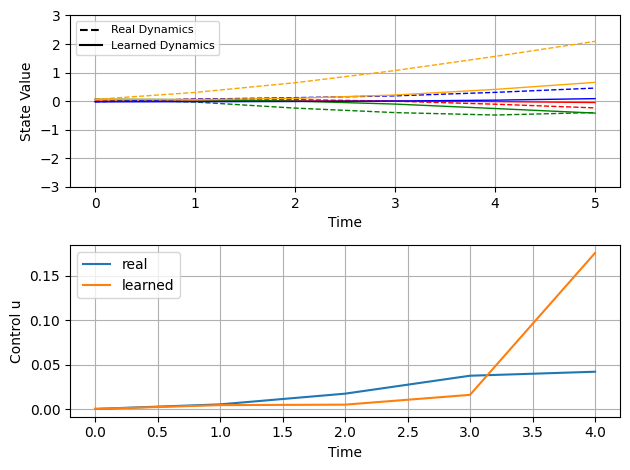


3d plot


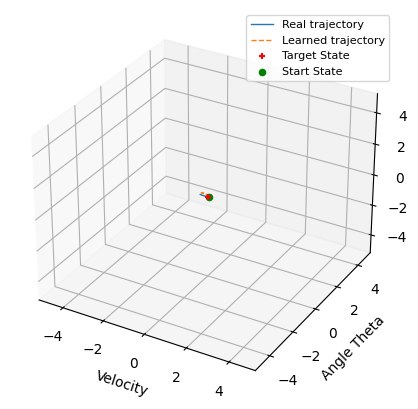

0.3430655
From real dynamics and learned dynamics


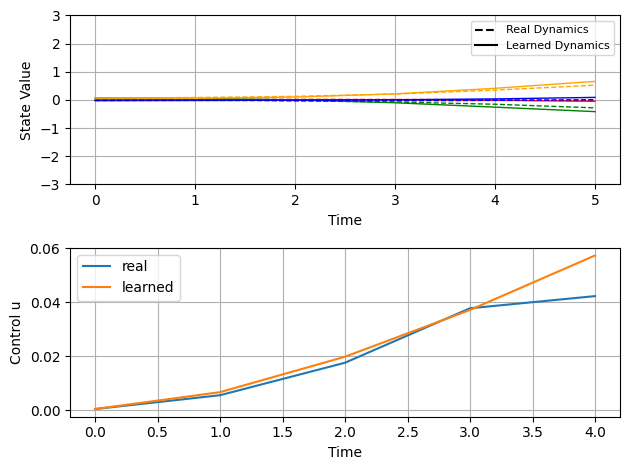


3d plot


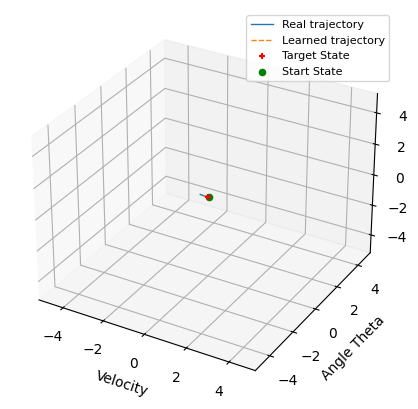

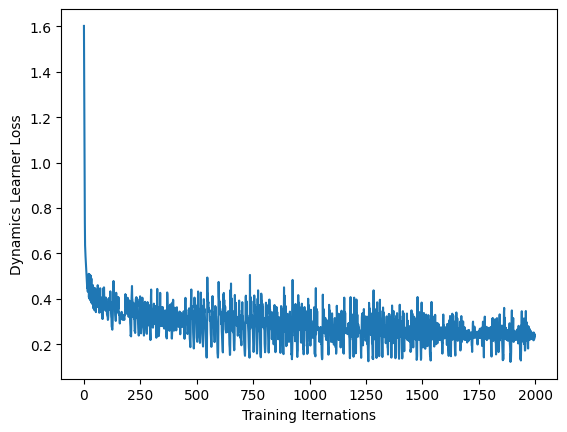


########### Move to next end time 1
1.9591824
From real dynamics and learned dynamics


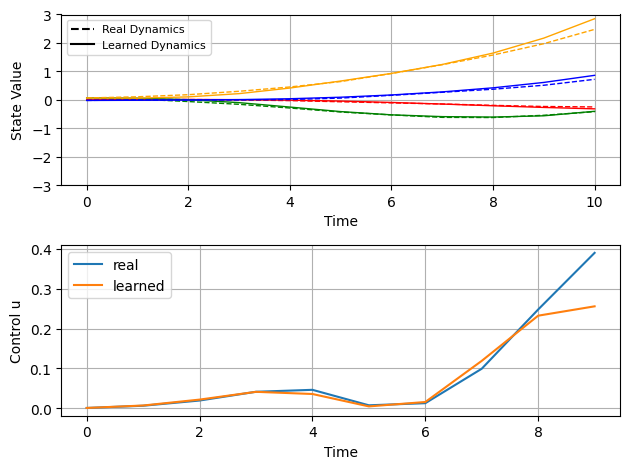


3d plot


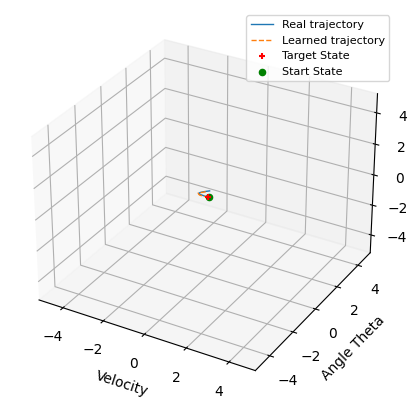

1.2375853
From real dynamics and learned dynamics


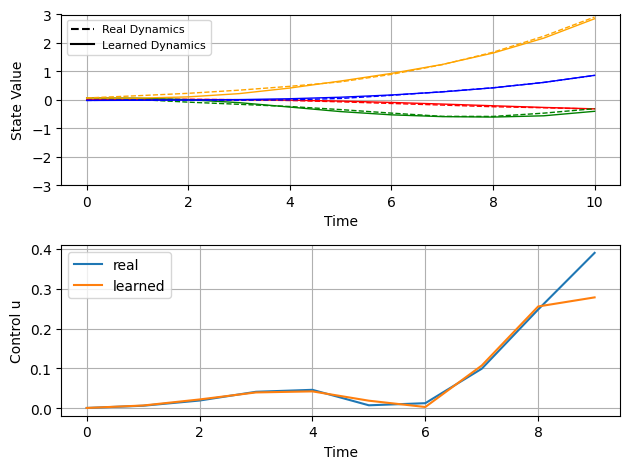


3d plot


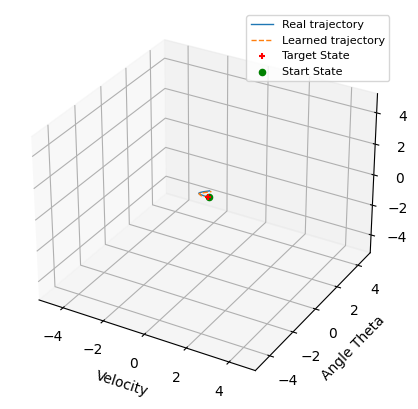

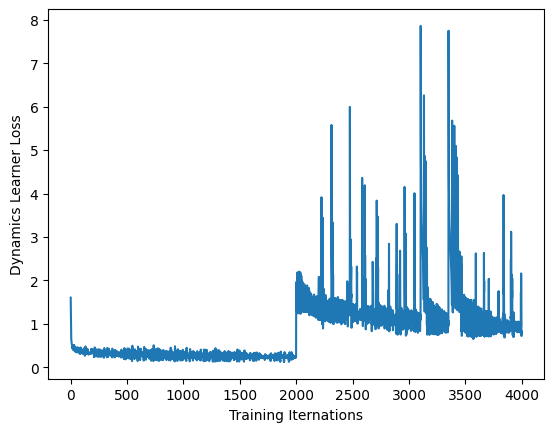


########### Move to next end time 1.5
7.184903
From real dynamics and learned dynamics


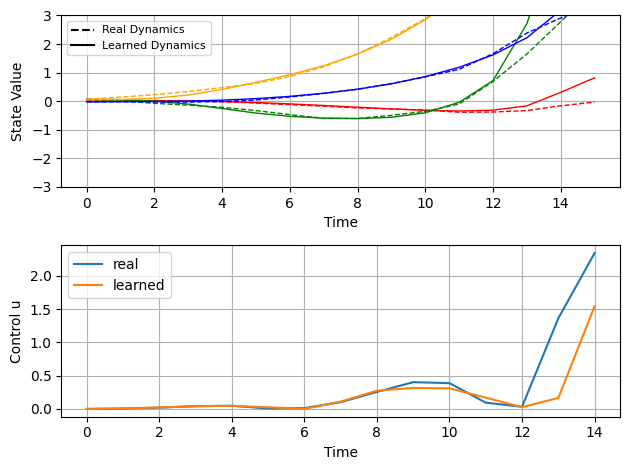


3d plot


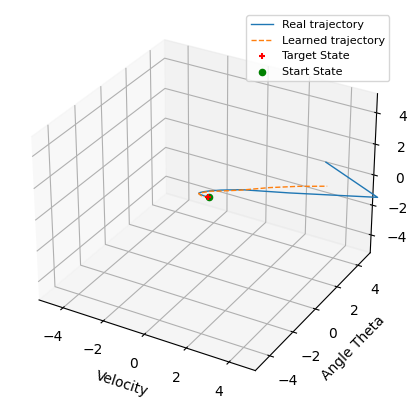

3.7509964
From real dynamics and learned dynamics


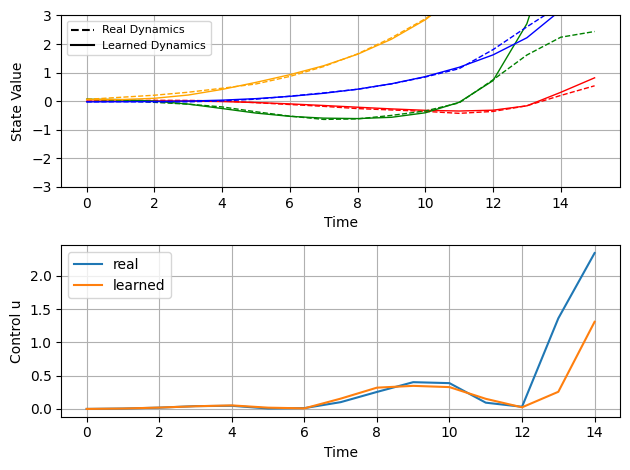


3d plot


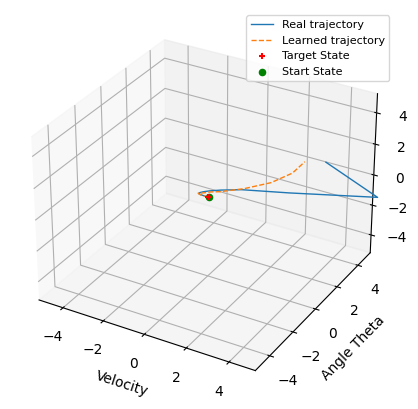

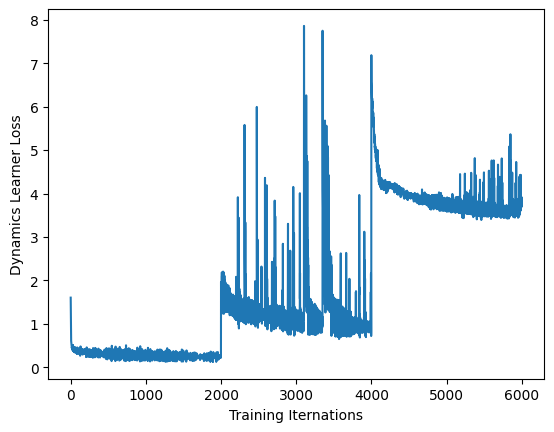

####### $$$$$$$$$$$$$$$$$$$$$#
start con
66.53226
83.342125
81.70599
83.88533
82.164696
80.98017
80.008156
80.399086
78.629974
74.81103
Finish controller training, plot loss:


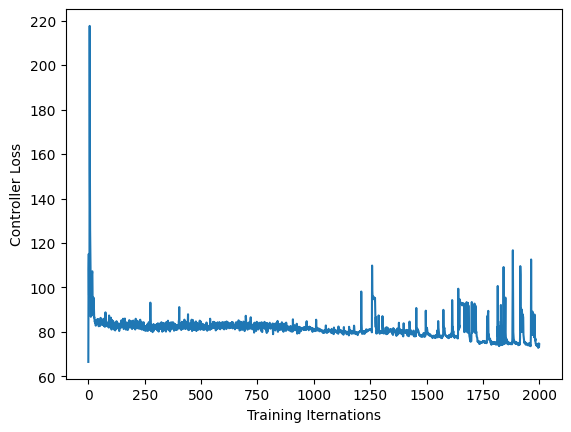

Finish controller training, plot trajectories:


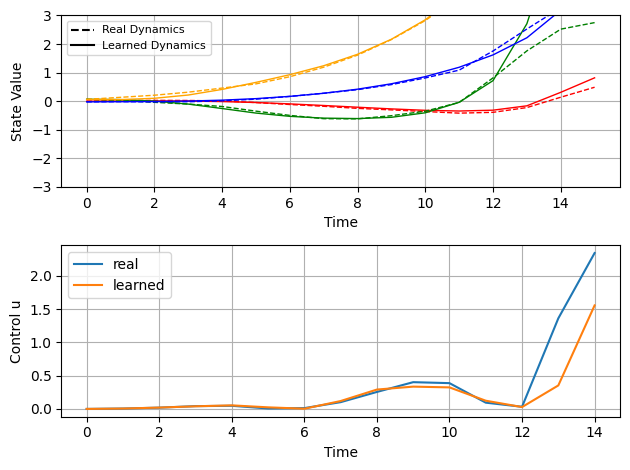

################################################



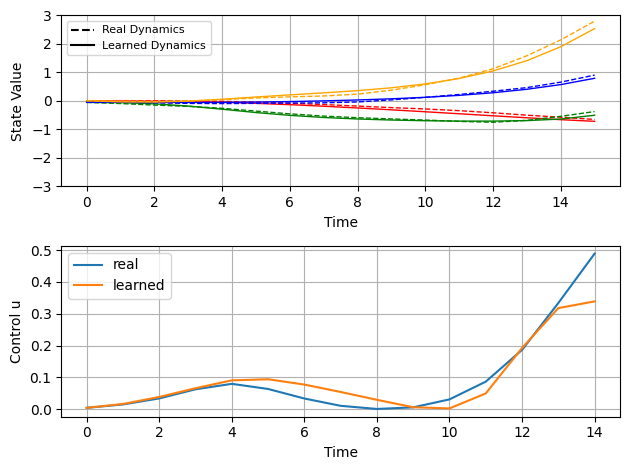

################################################


#########################################################
Alternation 8
#########################################################
start dyn

########### Move to next end time 0.5
1.390014
From real dynamics and learned dynamics


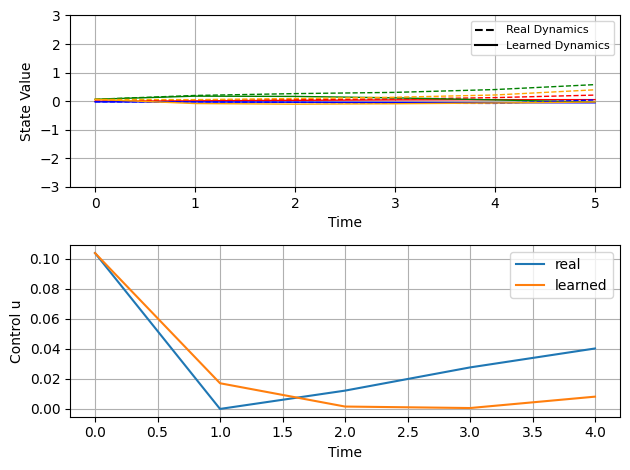


3d plot


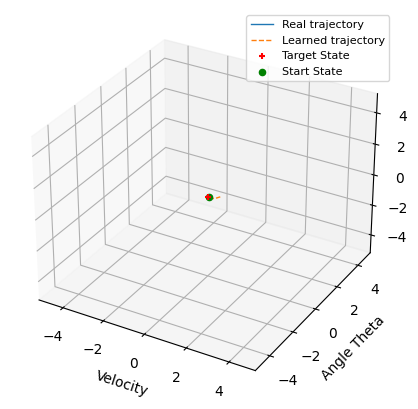

0.08321271
From real dynamics and learned dynamics


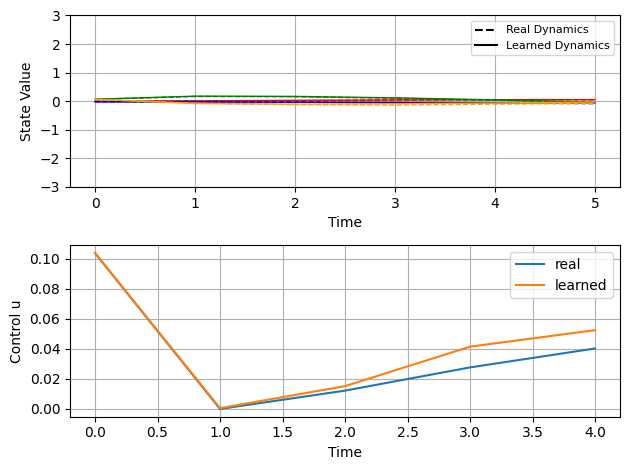


3d plot


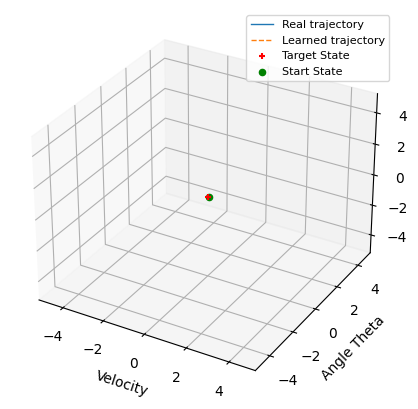

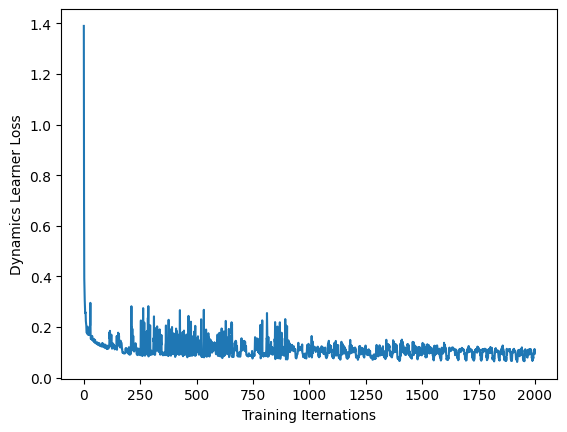


########### Move to next end time 1
0.91417044
From real dynamics and learned dynamics


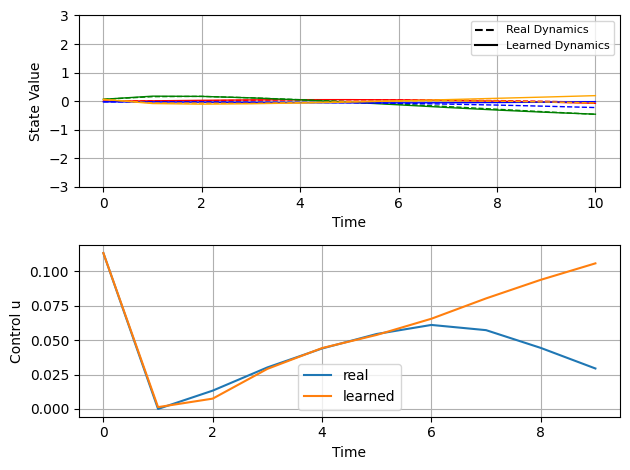


3d plot


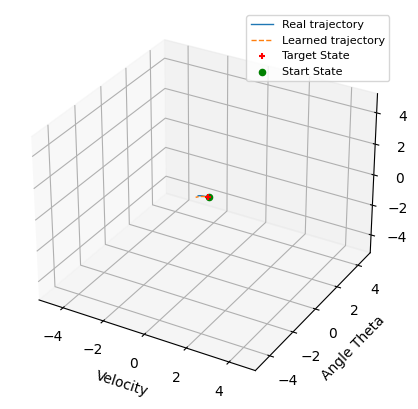

0.40568277
From real dynamics and learned dynamics


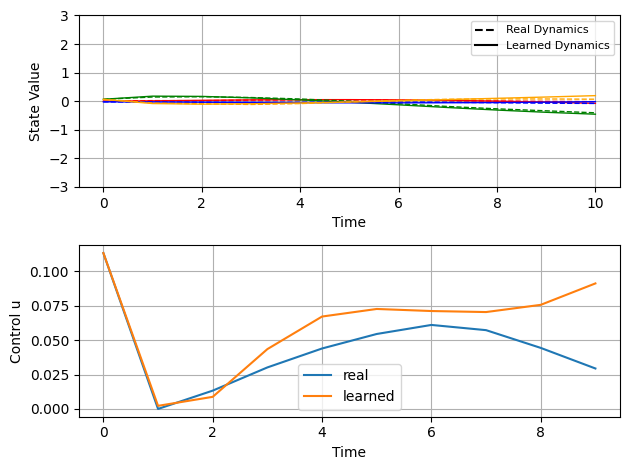


3d plot


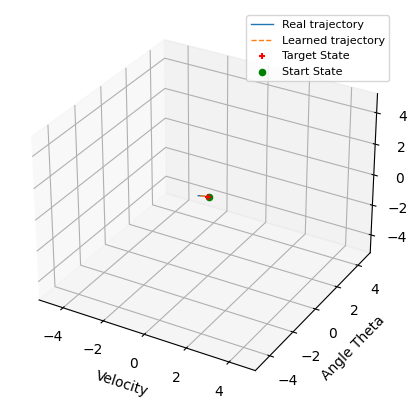

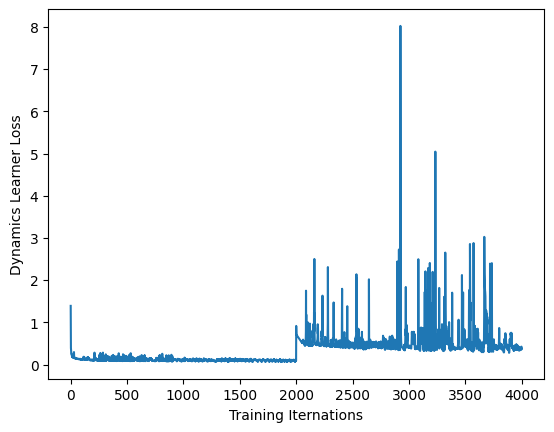


########### Move to next end time 1.5
2.8395636
From real dynamics and learned dynamics


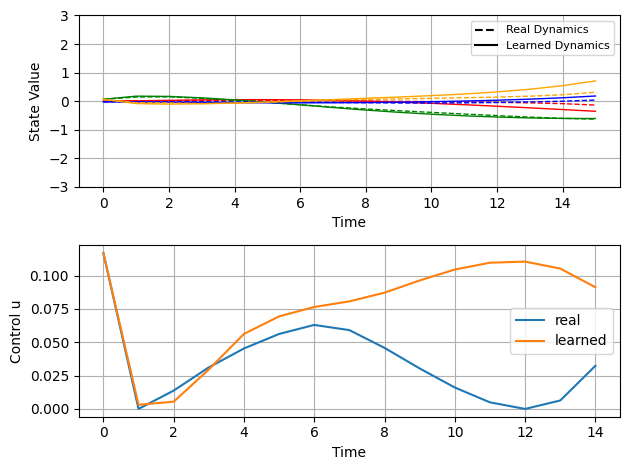


3d plot


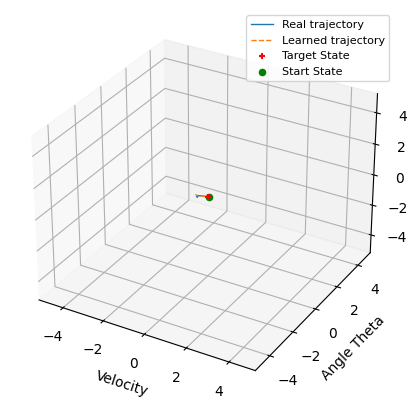

1.8401512
From real dynamics and learned dynamics


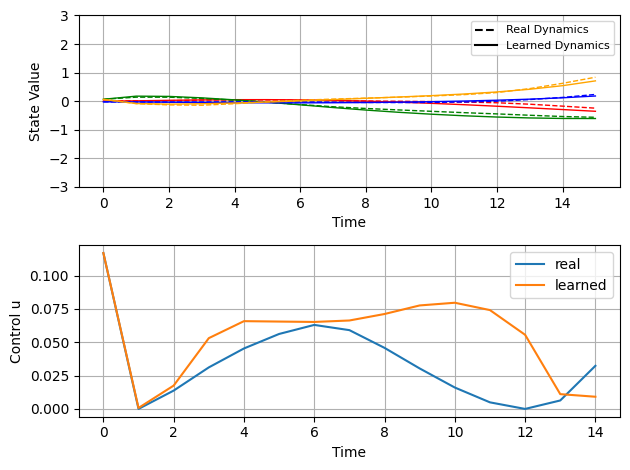


3d plot


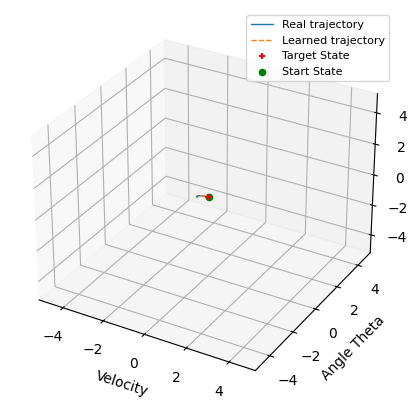

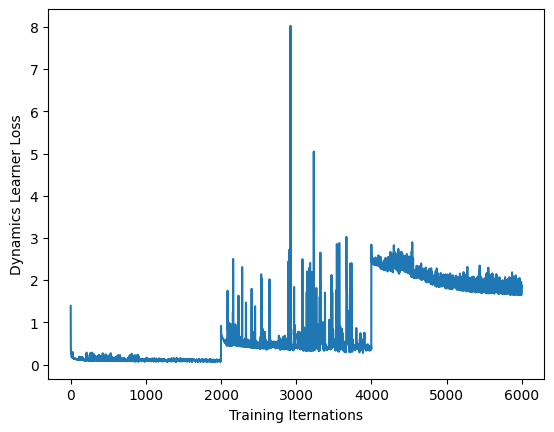

####### $$$$$$$$$$$$$$$$$$$$$#
start con
32.12493
0.7916198
0.434973
0.28454646
0.18742208
0.1453698
0.10606164
0.089263126
0.08417895
0.079673156
Finish controller training, plot loss:


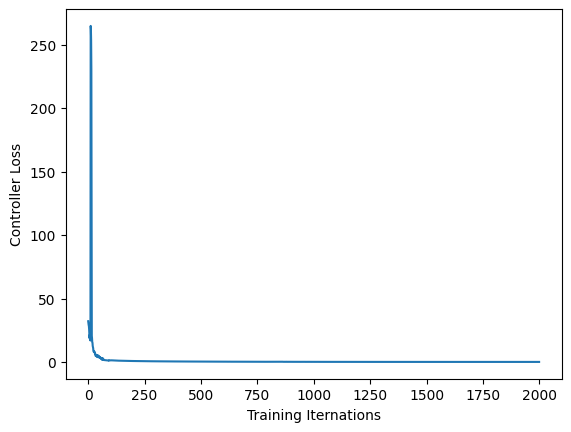

Finish controller training, plot trajectories:


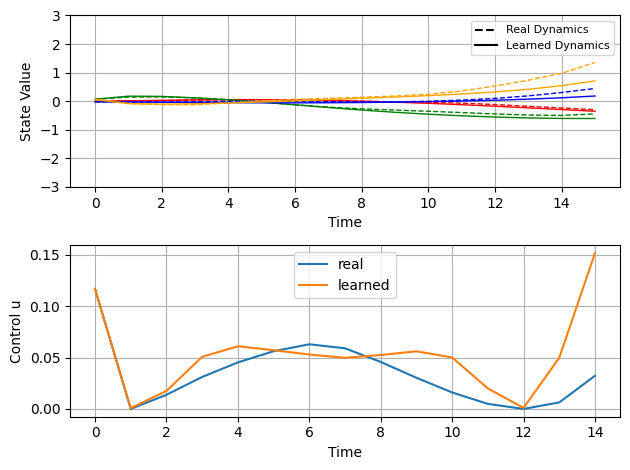

################################################



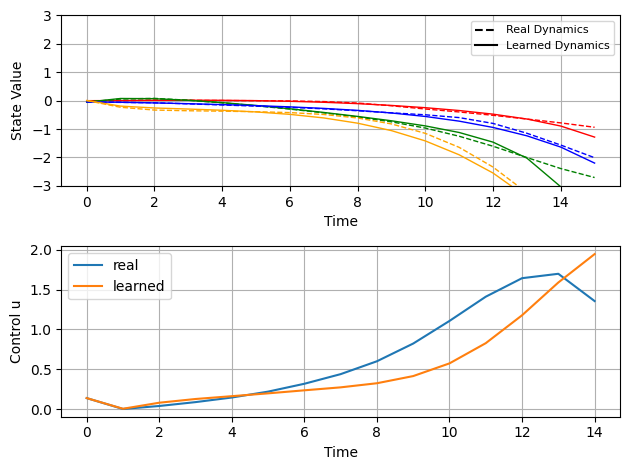

################################################


#########################################################
Alternation 9
#########################################################
start dyn

########### Move to next end time 0.5
0.19689518
From real dynamics and learned dynamics


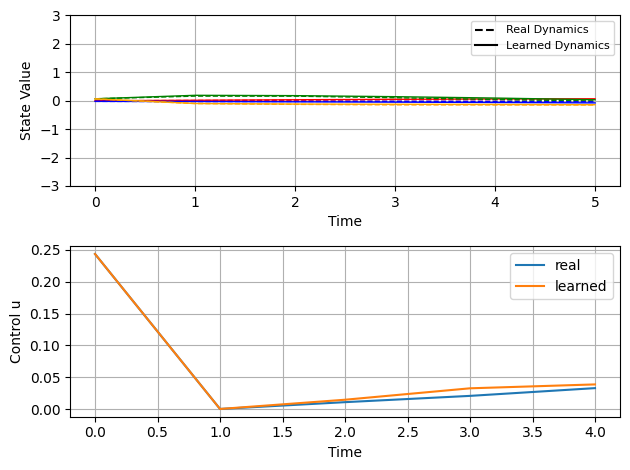


3d plot


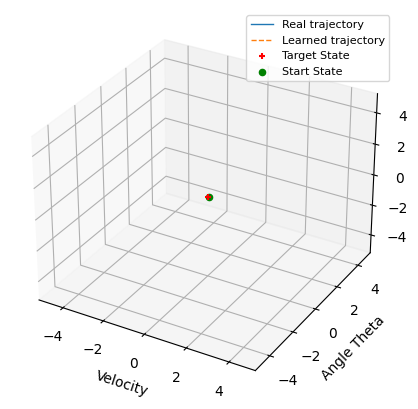

0.07614233
From real dynamics and learned dynamics


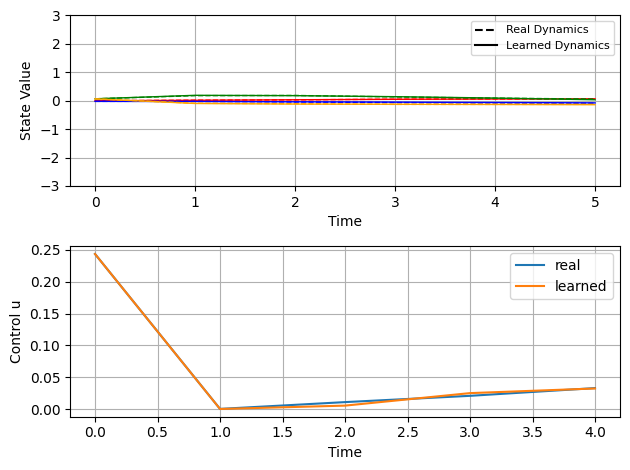


3d plot


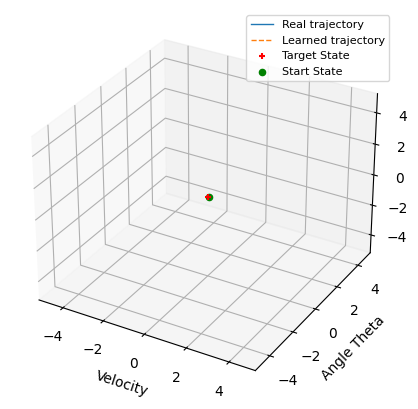

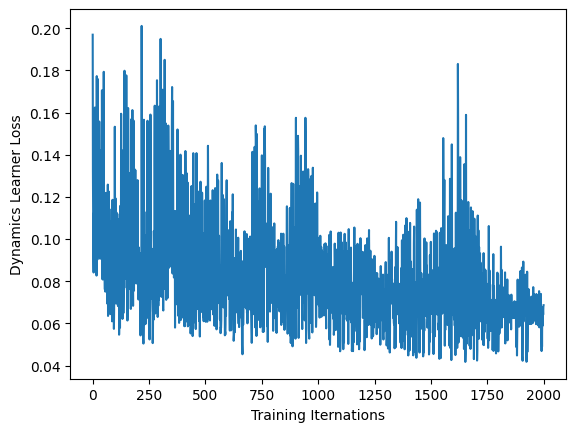


########### Move to next end time 1
0.64522517
From real dynamics and learned dynamics


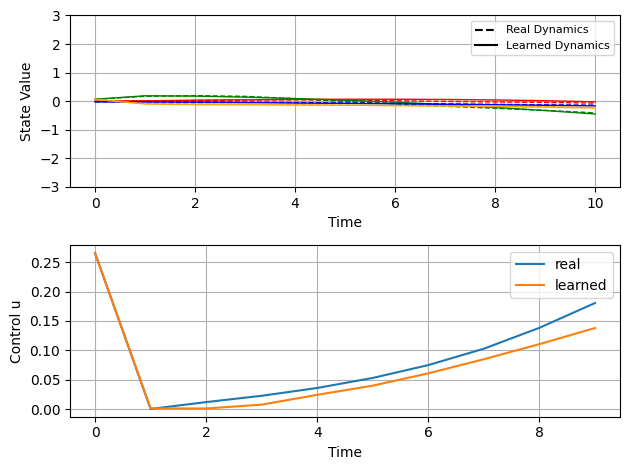


3d plot


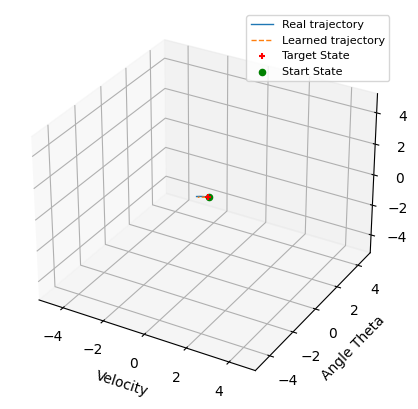

0.36775875
From real dynamics and learned dynamics


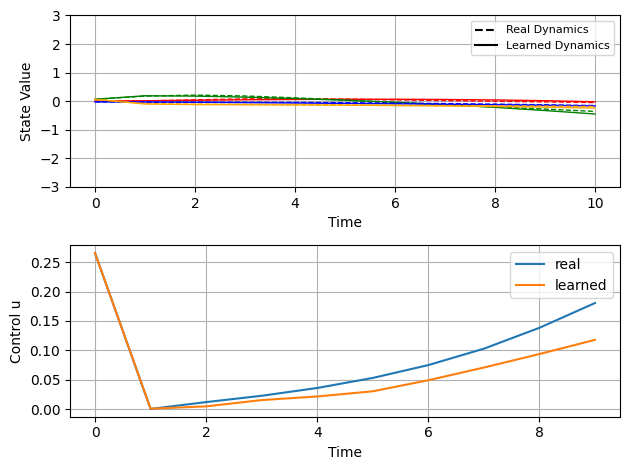


3d plot


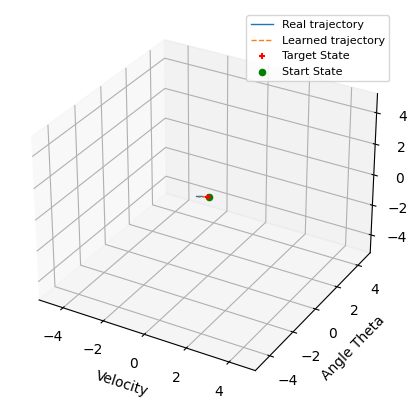

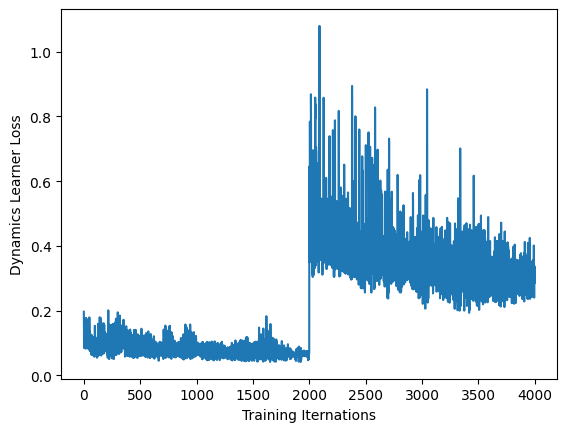


########### Move to next end time 1.5
1.7639115
From real dynamics and learned dynamics


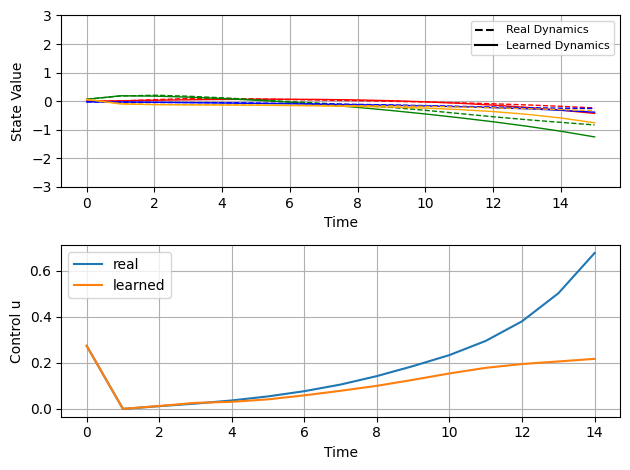


3d plot


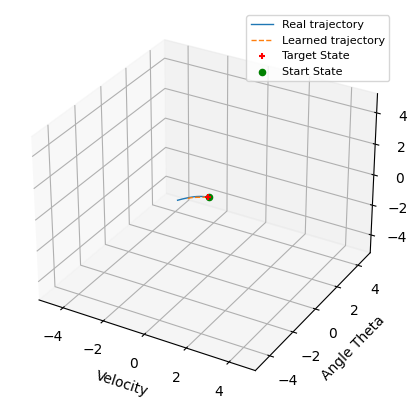

0.6541032
From real dynamics and learned dynamics


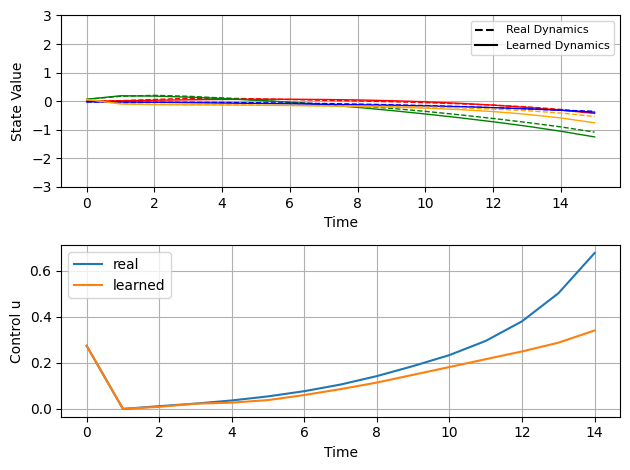


3d plot


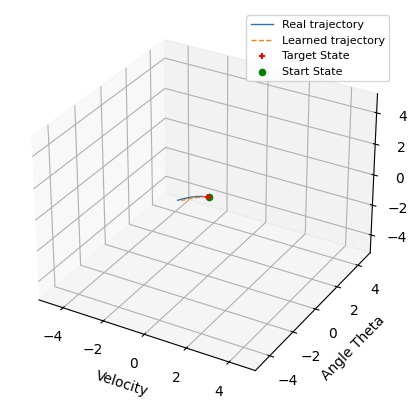

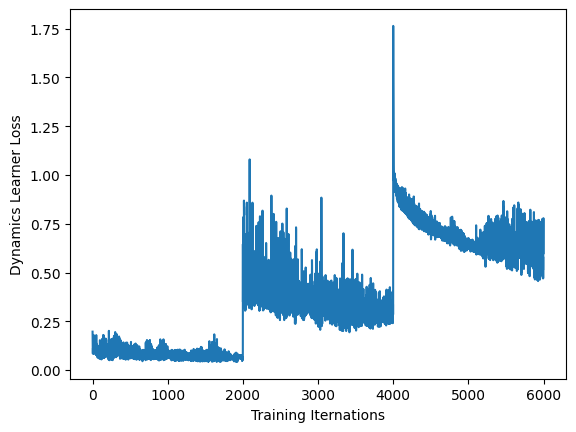

####### $$$$$$$$$$$$$$$$$$$$$#
start con
3.8103387
1.4951729
1.2628328
1.1318191
1.1522844
1.1522255
1.1531506
1.1644716
1.1584489
1.1532128
Finish controller training, plot loss:


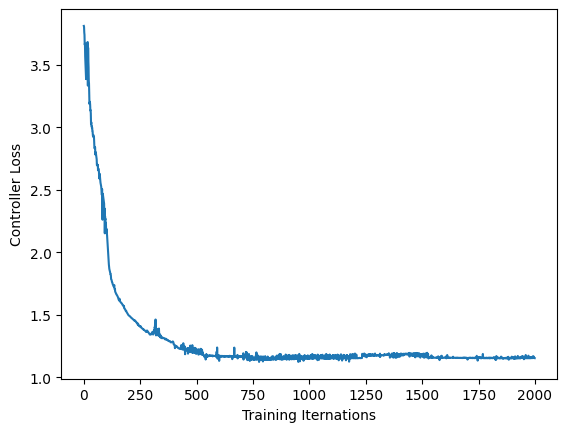

Finish controller training, plot trajectories:


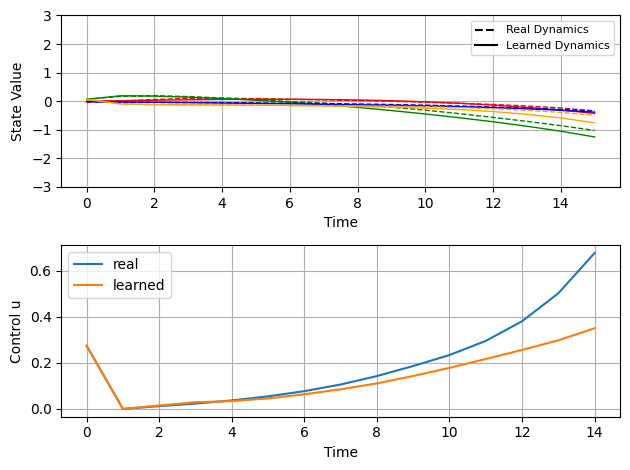

################################################



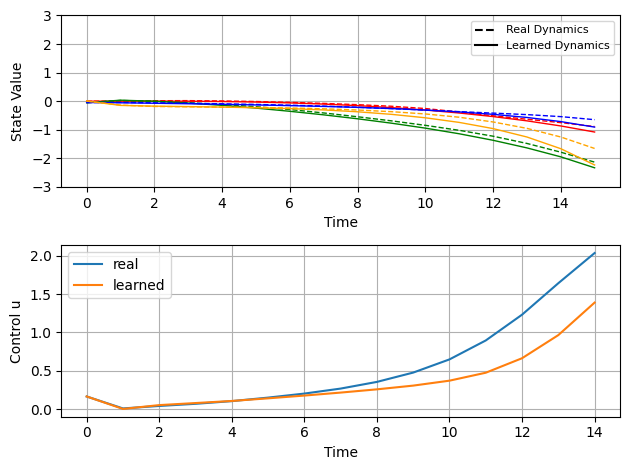

################################################


#########################################################
Alternation 10
#########################################################
start dyn

########### Move to next end time 0.5
0.072428145
From real dynamics and learned dynamics


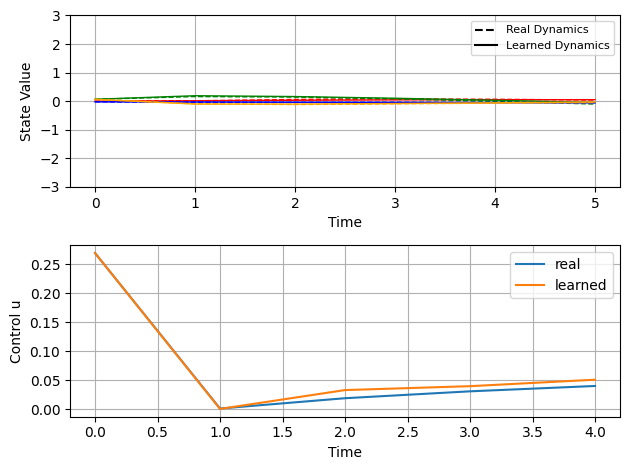


3d plot


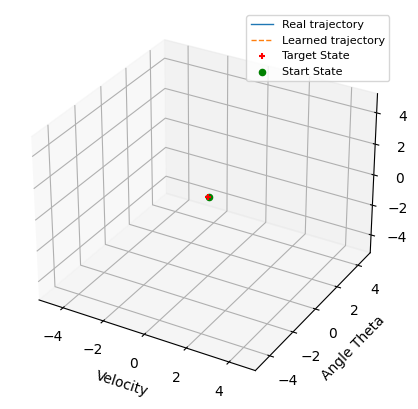

0.055799436
From real dynamics and learned dynamics


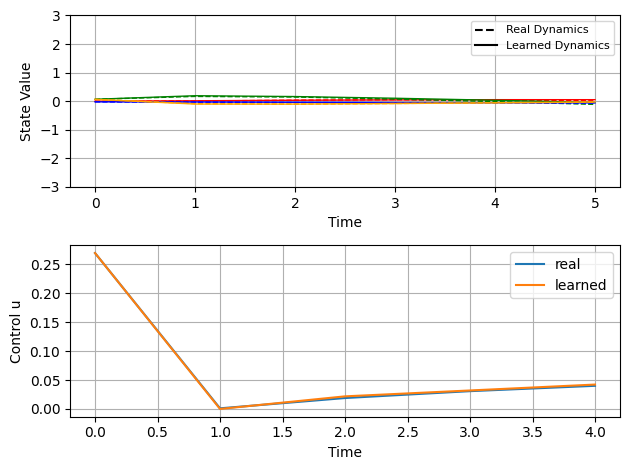


3d plot


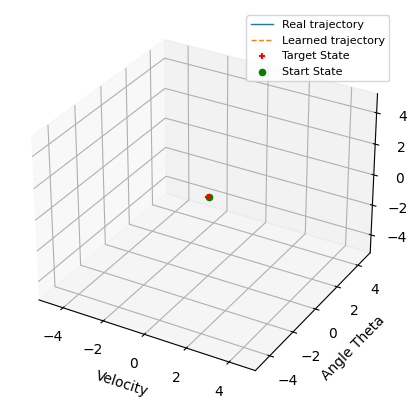

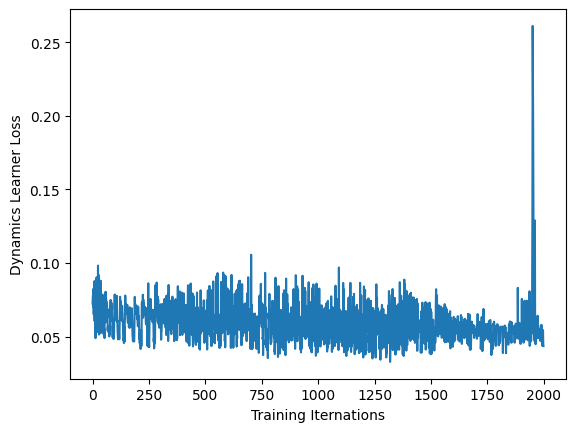


########### Move to next end time 1
0.28502485
From real dynamics and learned dynamics


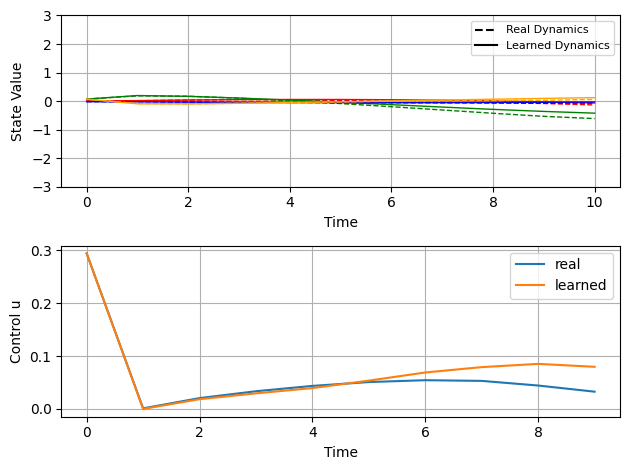


3d plot


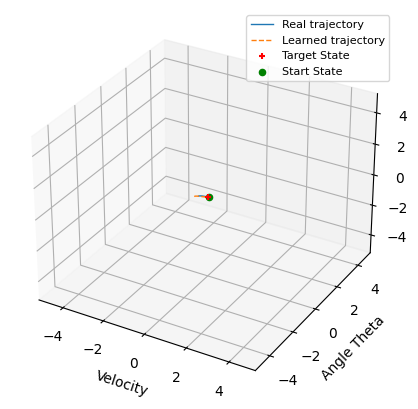

0.26152292
From real dynamics and learned dynamics


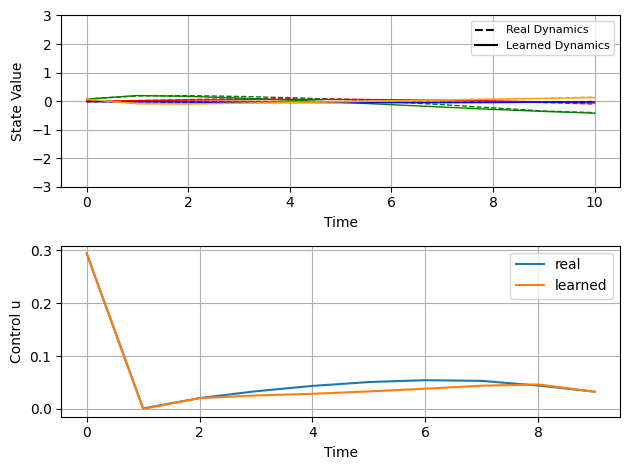


3d plot


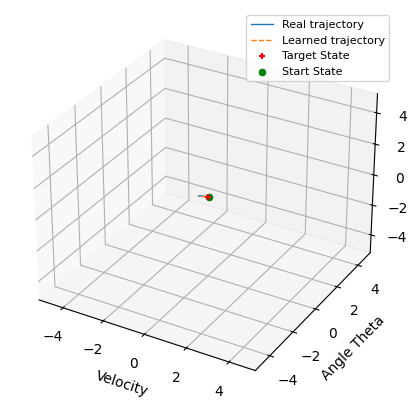

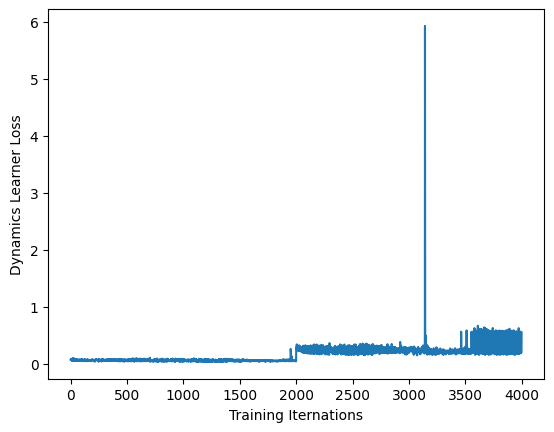


########### Move to next end time 1.5
0.8799936
From real dynamics and learned dynamics


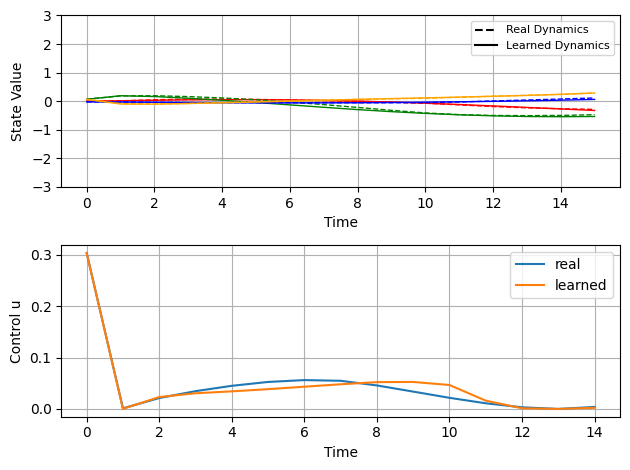


3d plot


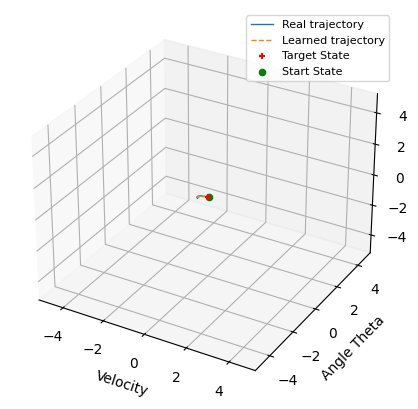

0.42298993
From real dynamics and learned dynamics


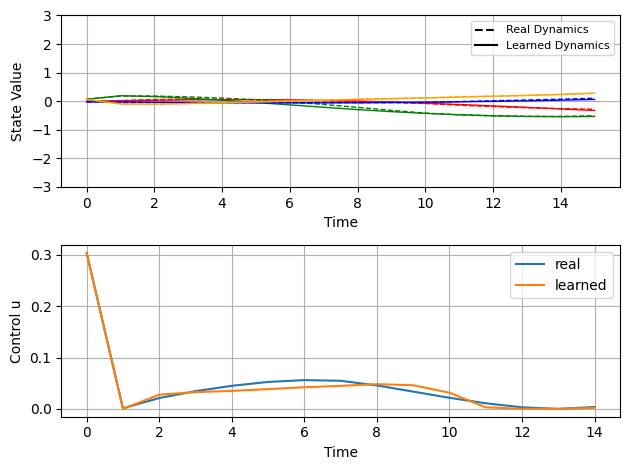


3d plot


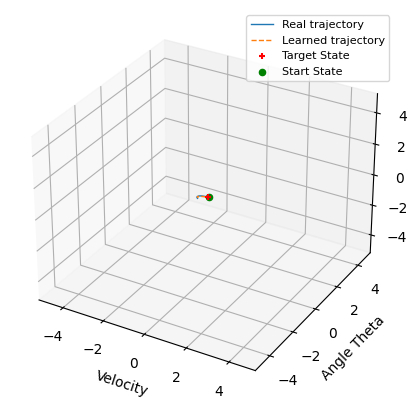

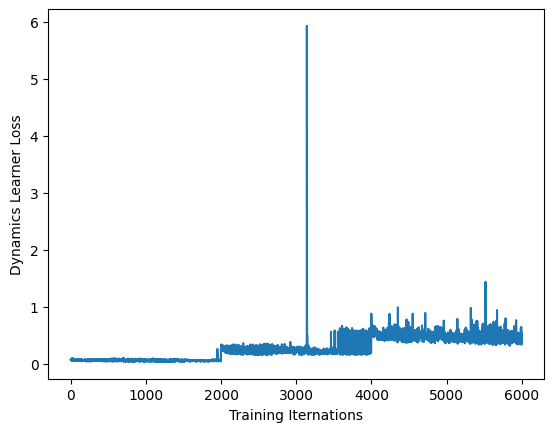

####### $$$$$$$$$$$$$$$$$$$$$#
start con
2.3286989
2.5056467
2.4888763
2.2496185
2.261313
2.336679
2.2882652
2.2849224
2.2908943
2.1241992
Finish controller training, plot loss:


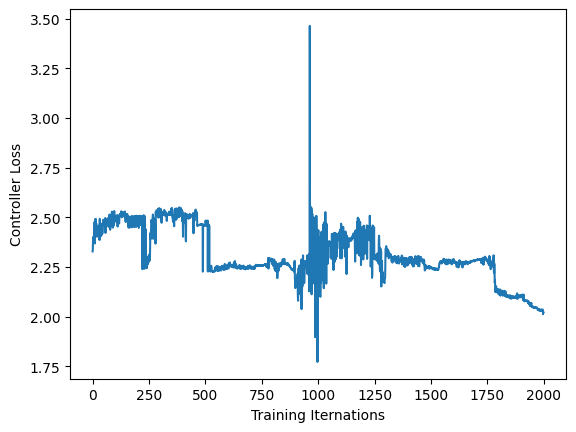

Finish controller training, plot trajectories:


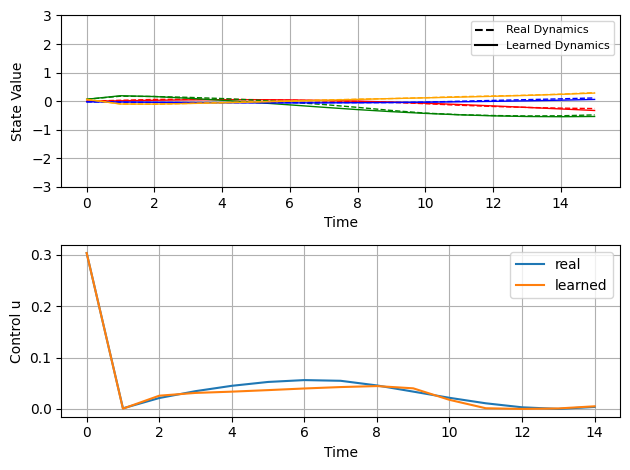

################################################



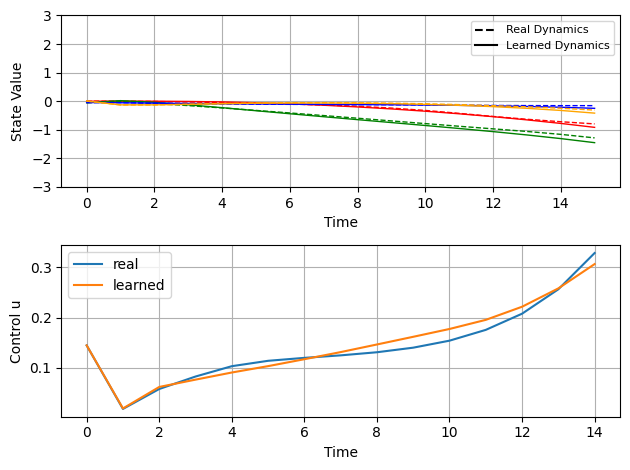

################################################


#########################################################
Alternation 11
#########################################################
start dyn

########### Move to next end time 0.5
0.06837373
From real dynamics and learned dynamics


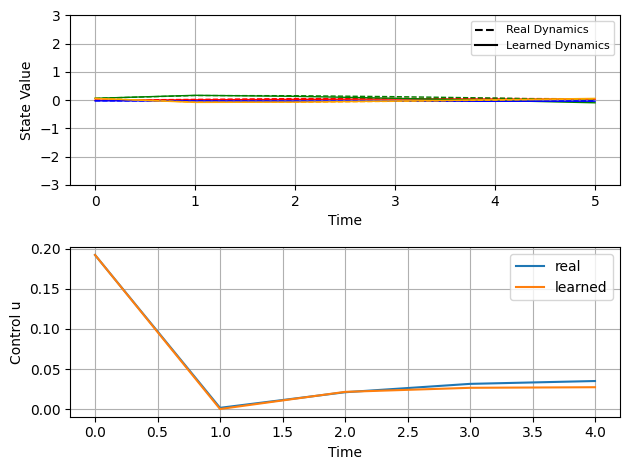


3d plot


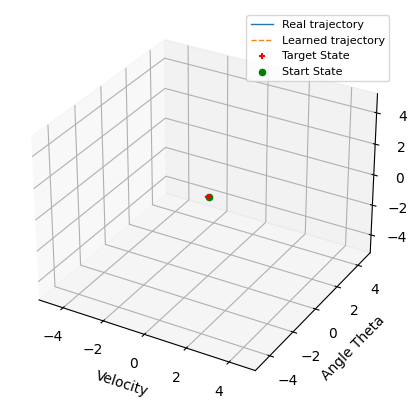

0.051203825
From real dynamics and learned dynamics


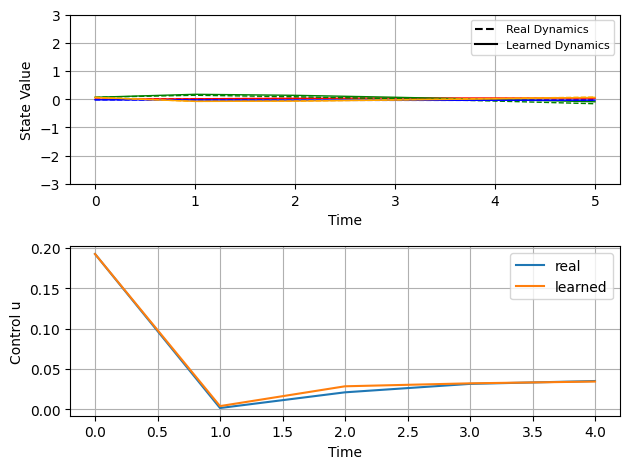


3d plot


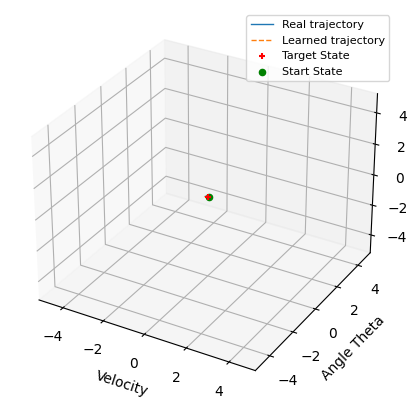

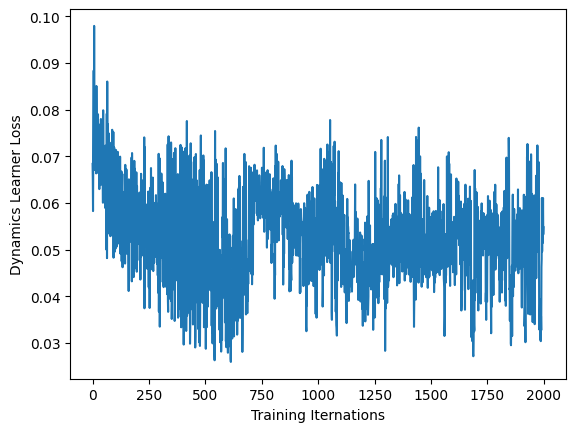


########### Move to next end time 1
0.28956637
From real dynamics and learned dynamics


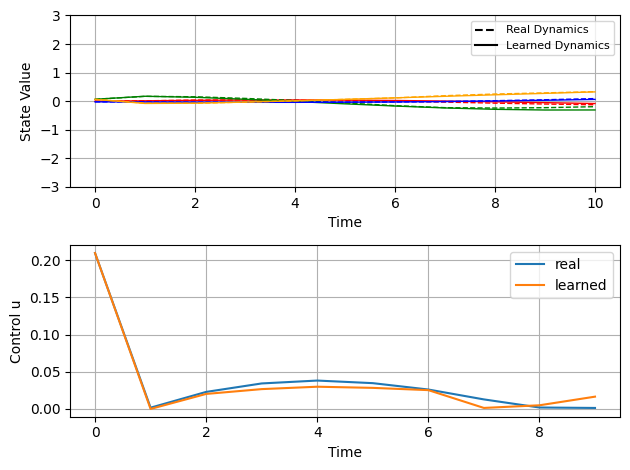


3d plot


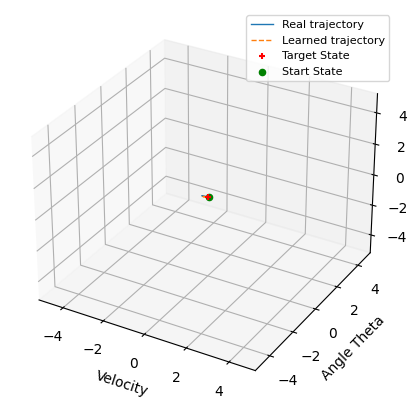

0.17294197
From real dynamics and learned dynamics


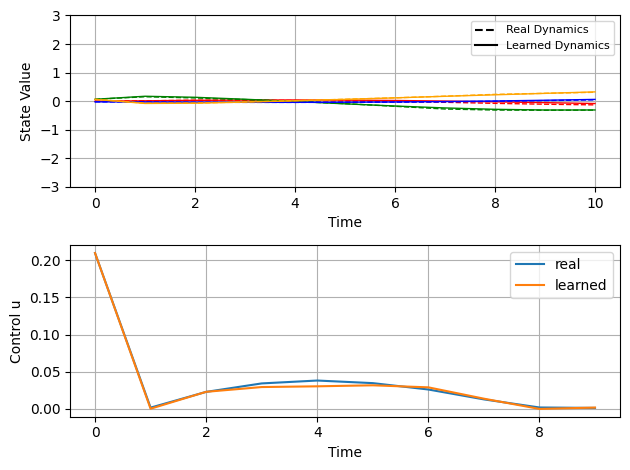


3d plot


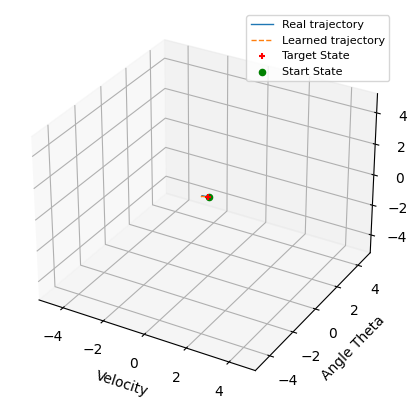

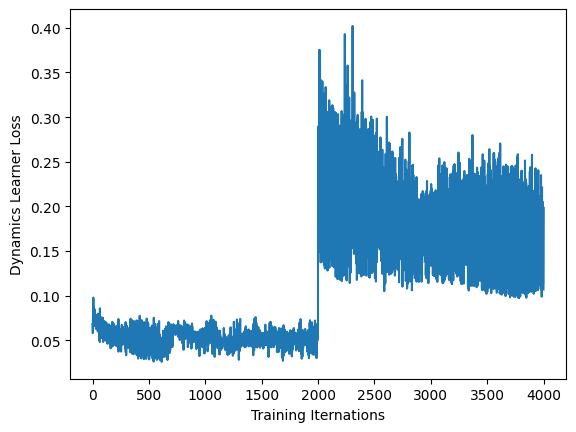


########### Move to next end time 1.5
0.767866
From real dynamics and learned dynamics


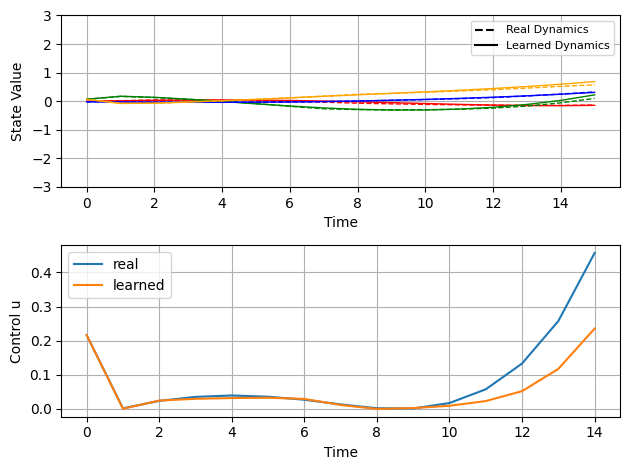


3d plot


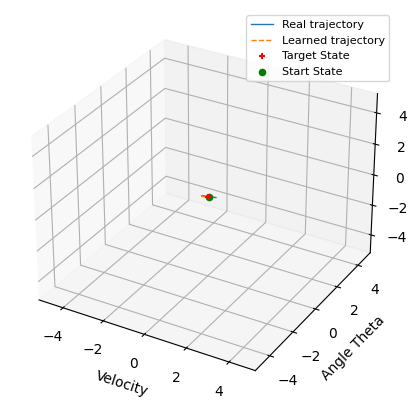

0.44093767
From real dynamics and learned dynamics


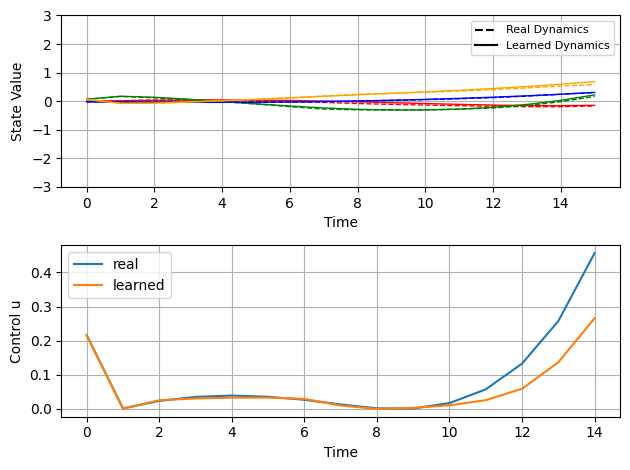


3d plot


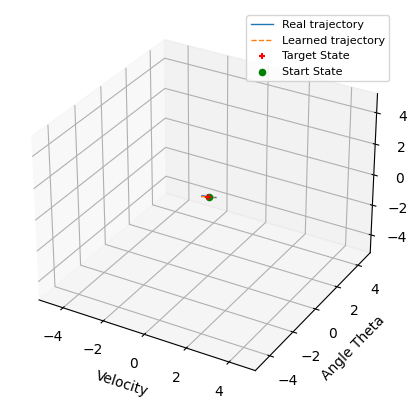

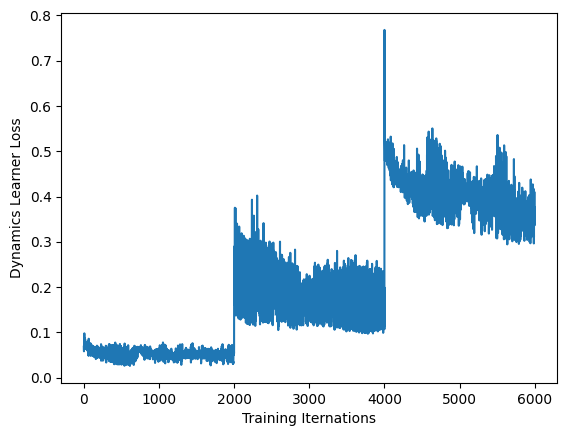

####### $$$$$$$$$$$$$$$$$$$$$#
start con
2.5552616
2.3294551
2.3712502
2.3696814
2.307653
2.2982204
2.2575614
2.2506015
2.2492936
2.1348865
Finish controller training, plot loss:


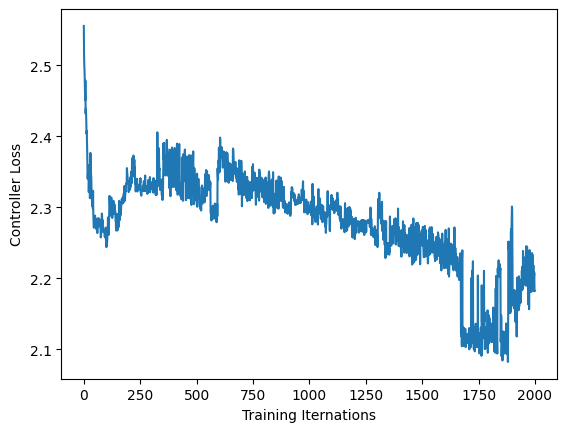

Finish controller training, plot trajectories:


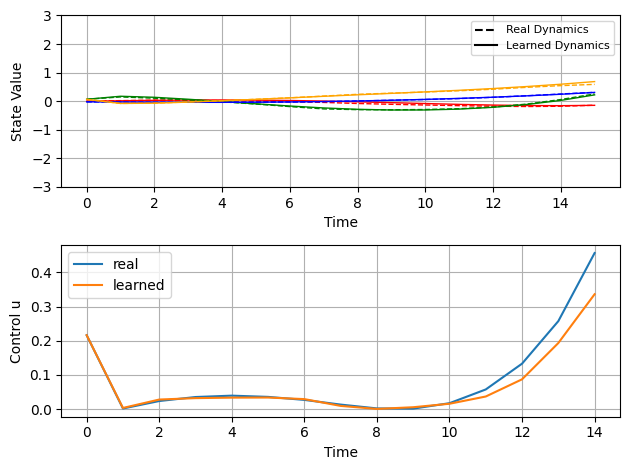

################################################



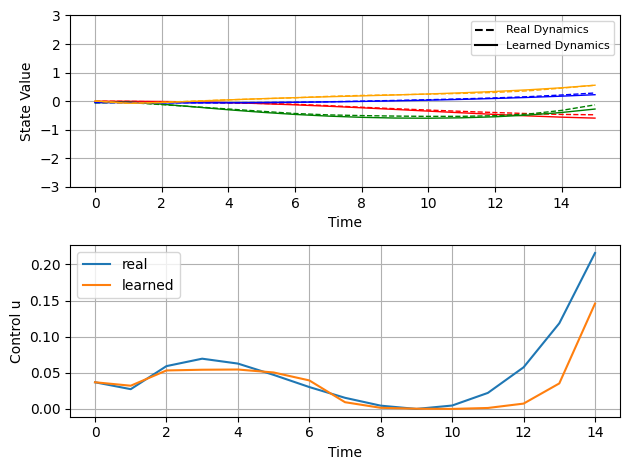

################################################


#########################################################
Alternation 12
#########################################################
start dyn

########### Move to next end time 0.5
0.04543324
From real dynamics and learned dynamics


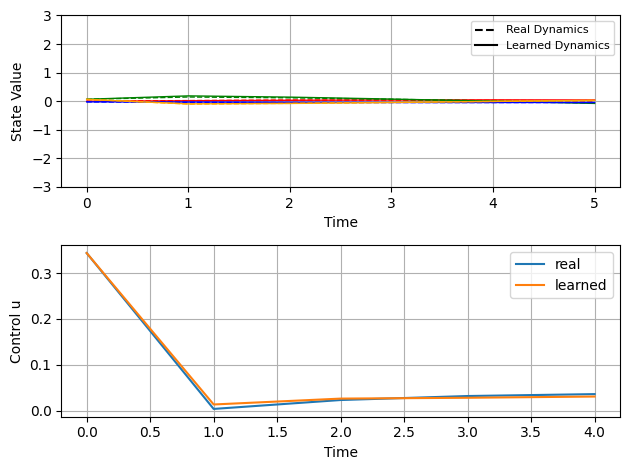


3d plot


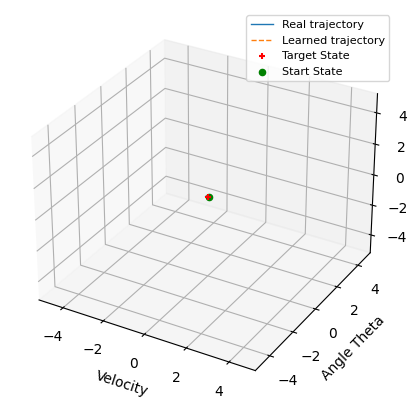

0.07731556
From real dynamics and learned dynamics


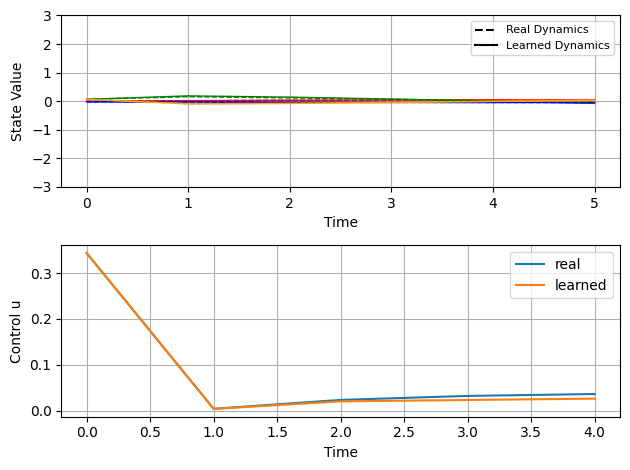


3d plot


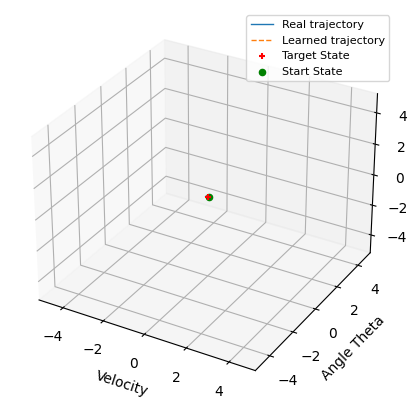

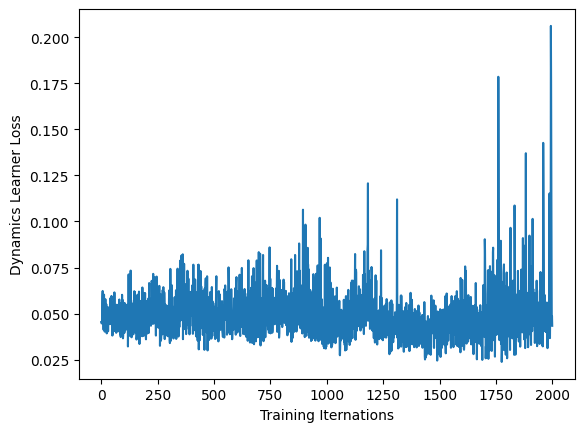


########### Move to next end time 1
0.22237878
From real dynamics and learned dynamics


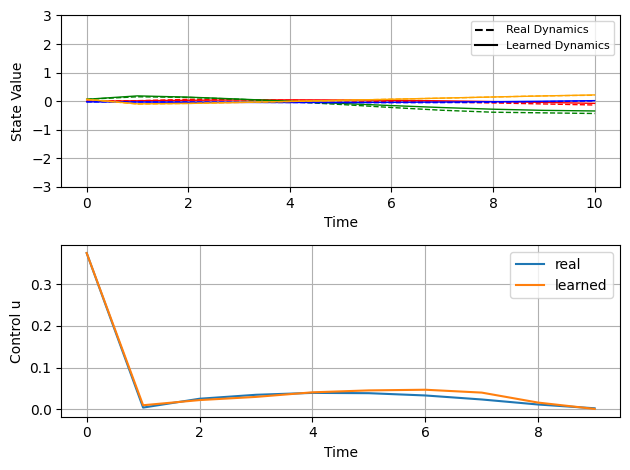


3d plot


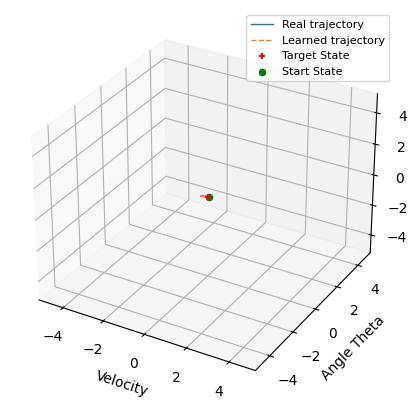

0.22701268
From real dynamics and learned dynamics


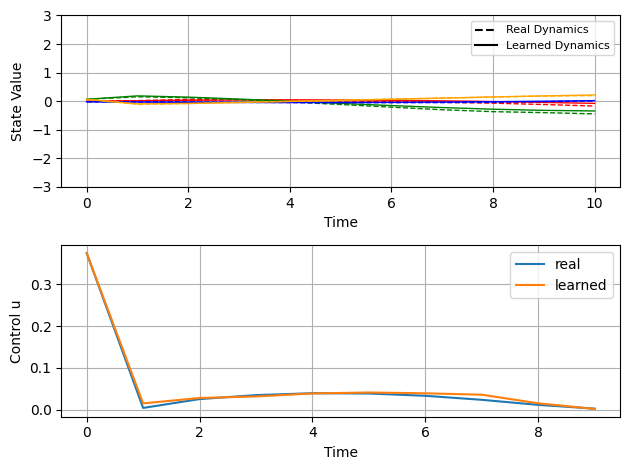


3d plot


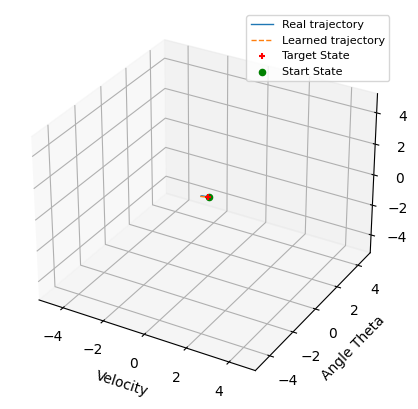

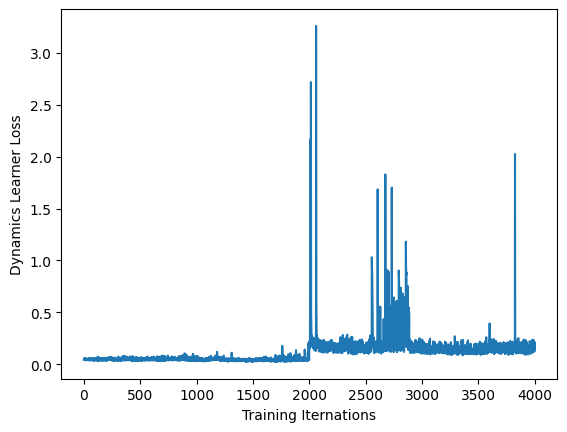


########### Move to next end time 1.5
0.46781787
From real dynamics and learned dynamics


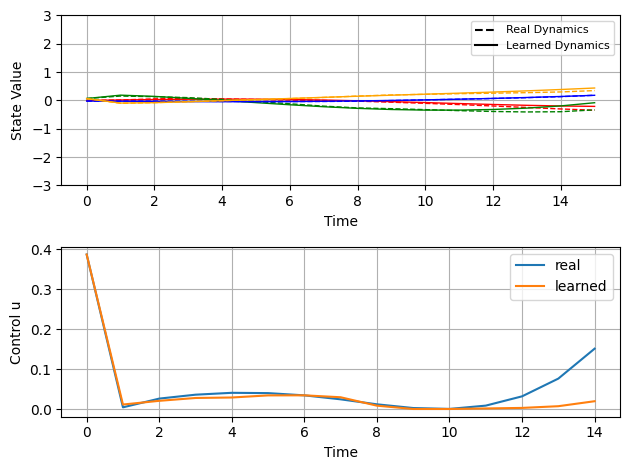


3d plot


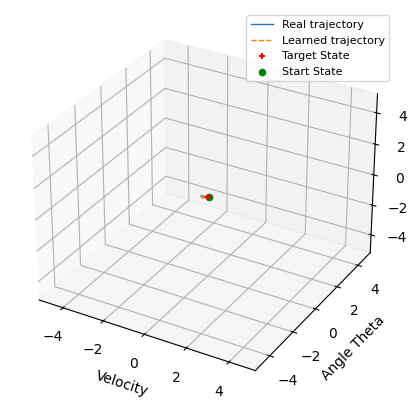

0.2737351
From real dynamics and learned dynamics


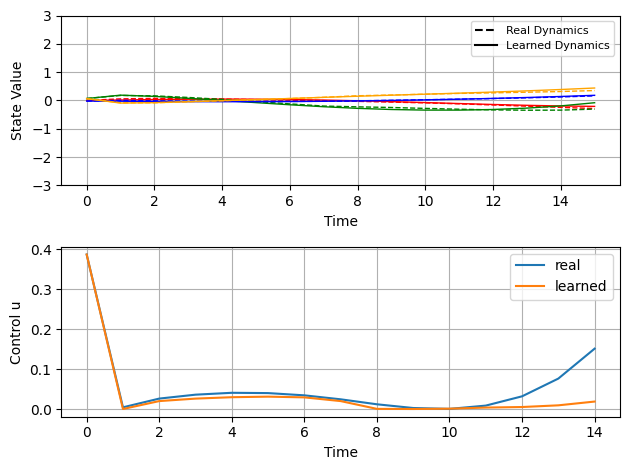


3d plot


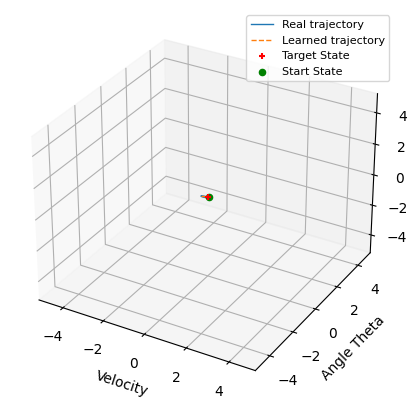

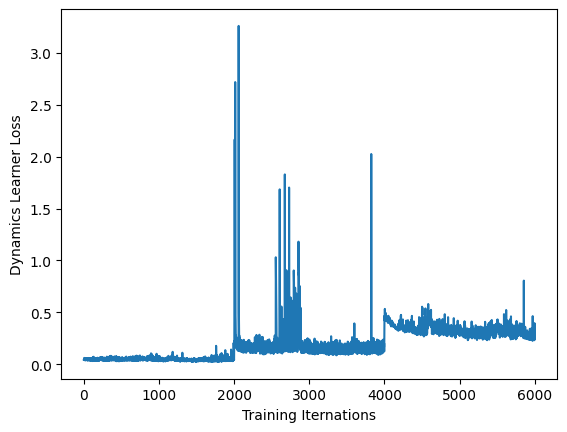

####### $$$$$$$$$$$$$$$$$$$$$#
start con
1.4044207
1.4103731
1.3662349
1.3433167
1.318335
1.3536484
1.3503317
1.3451015
1.3504559
1.319722
Finish controller training, plot loss:


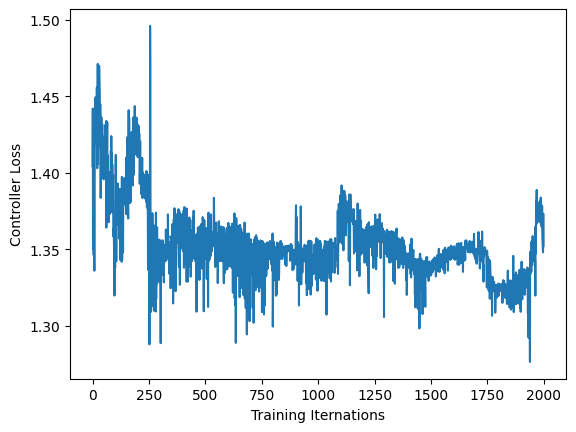

Finish controller training, plot trajectories:


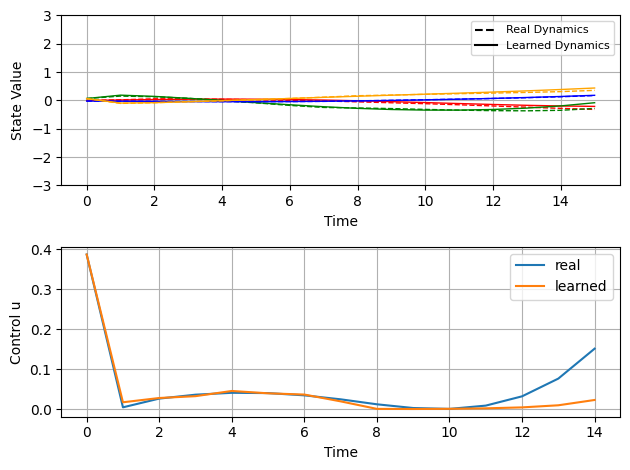

################################################



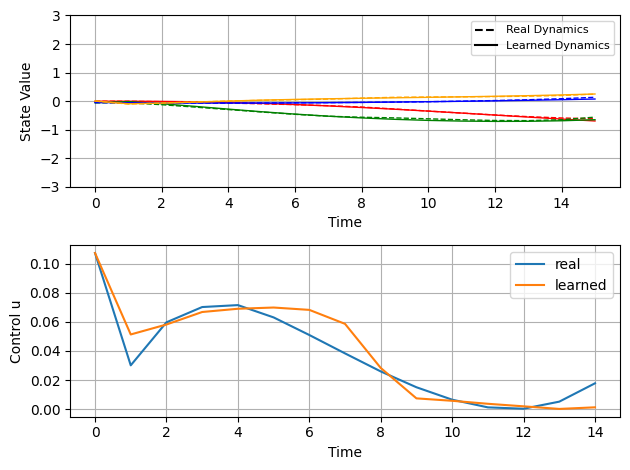

################################################


#########################################################
Alternation 13
#########################################################
start dyn

########### Move to next end time 0.5
0.05486213
From real dynamics and learned dynamics


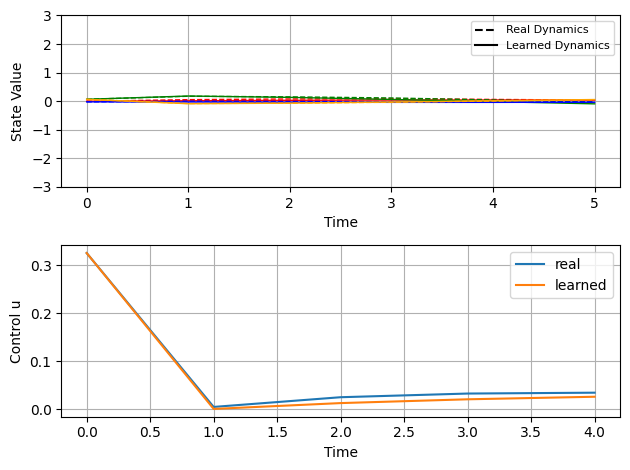


3d plot


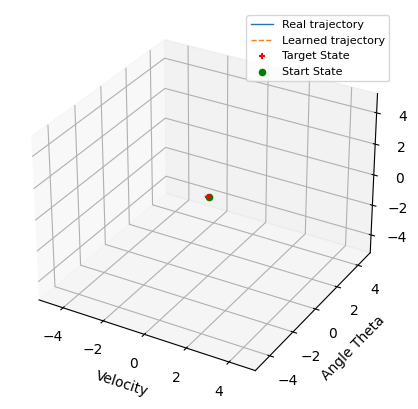

0.0726485
From real dynamics and learned dynamics


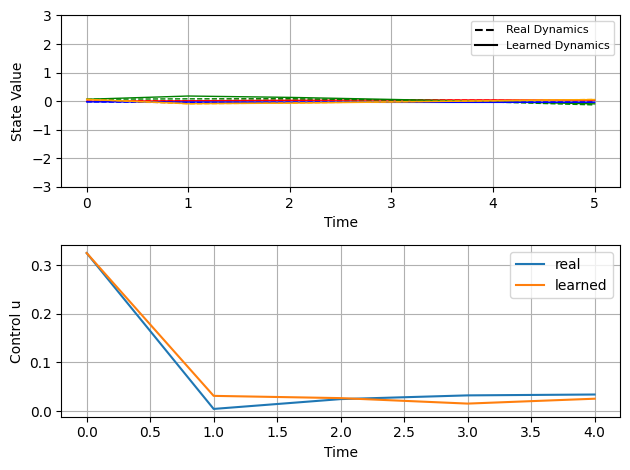


3d plot


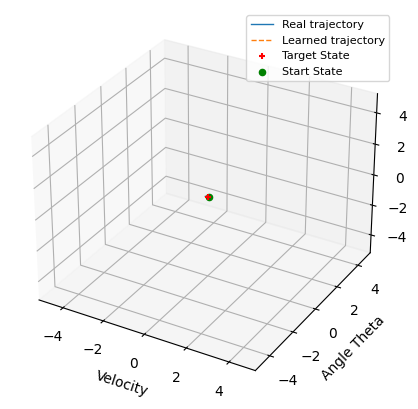

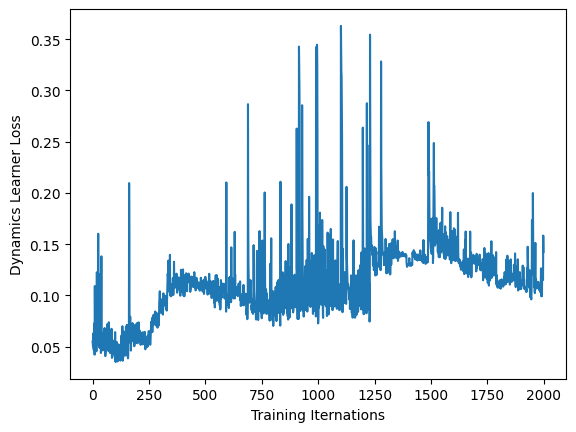


########### Move to next end time 1
0.49134237
From real dynamics and learned dynamics


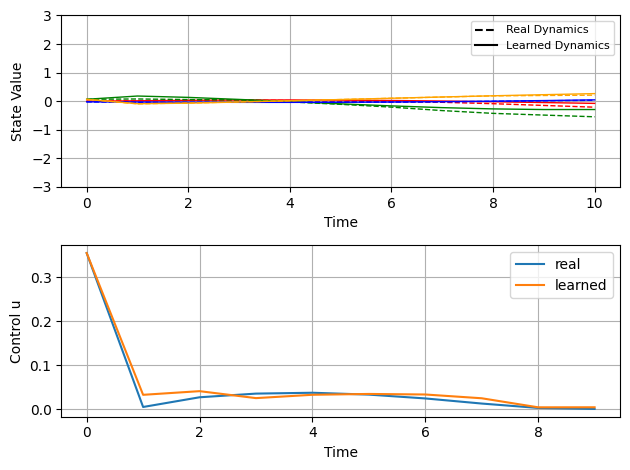


3d plot


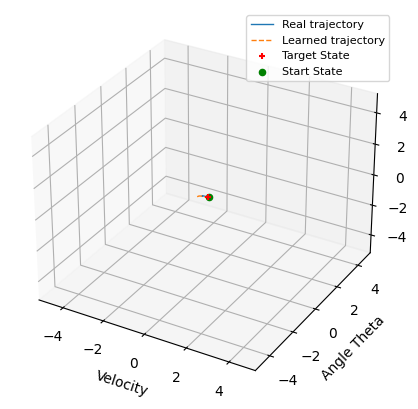

0.31531987
From real dynamics and learned dynamics


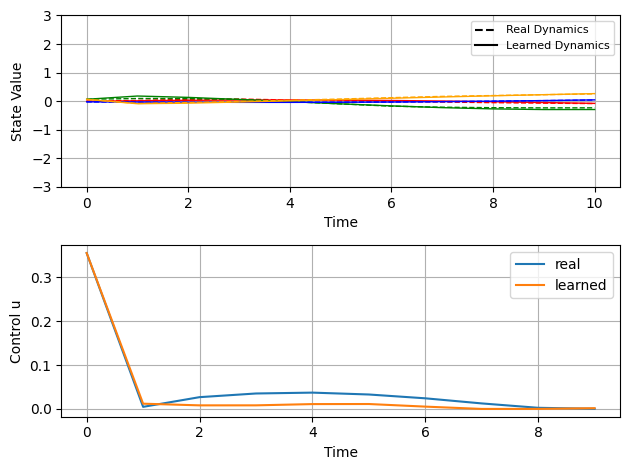


3d plot


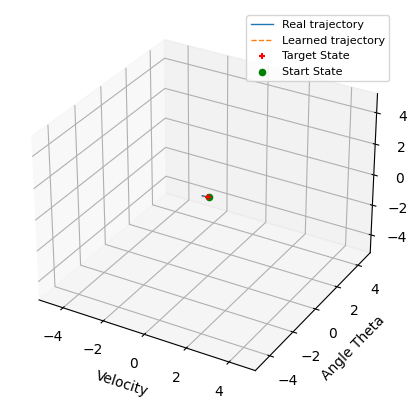

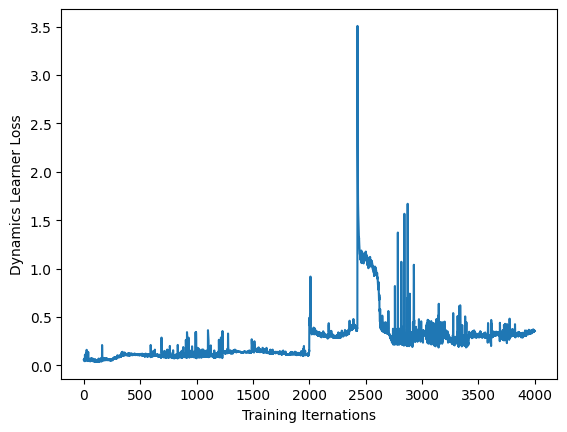


########### Move to next end time 1.5
1.0021347
From real dynamics and learned dynamics


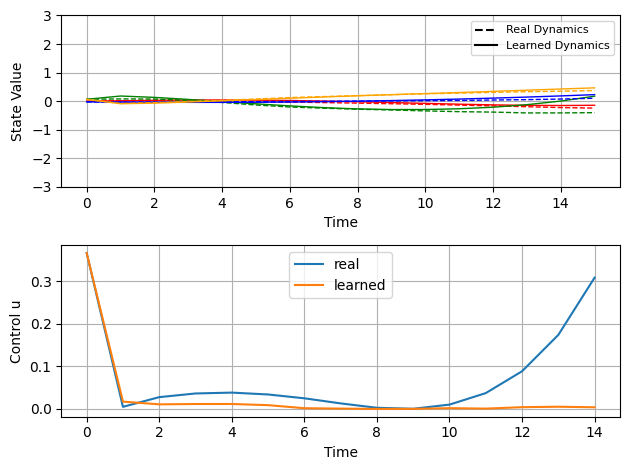


3d plot


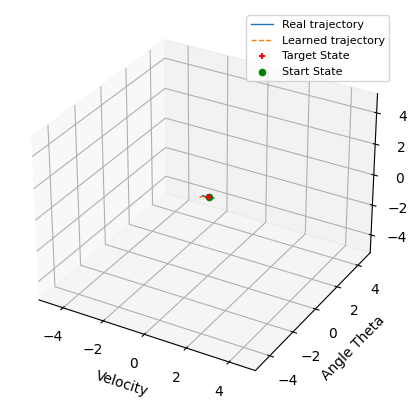

0.7541024
From real dynamics and learned dynamics


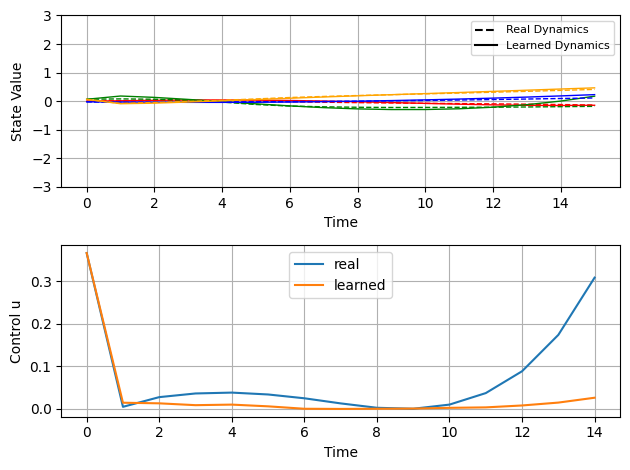


3d plot


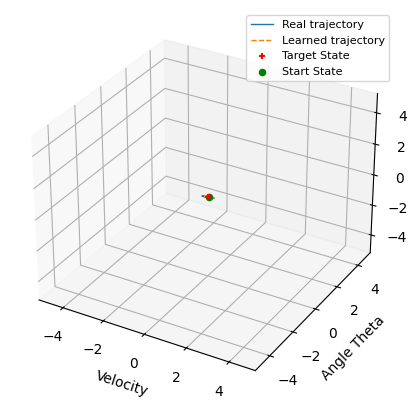

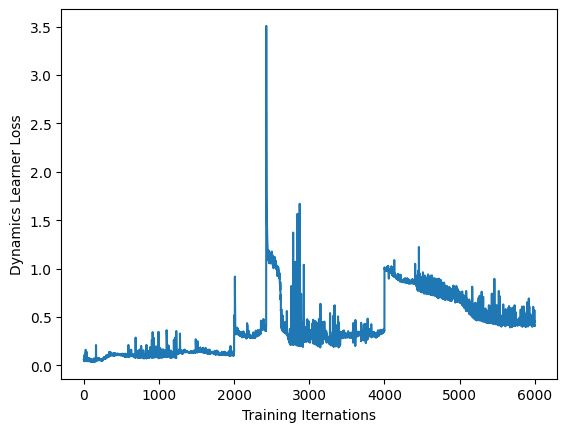

####### $$$$$$$$$$$$$$$$$$$$$#
start con
1.2918872
0.9315613
0.91087925
0.91997766
0.9476206
0.9241066
0.919973
0.90815985
0.90464896
0.9456844
Finish controller training, plot loss:


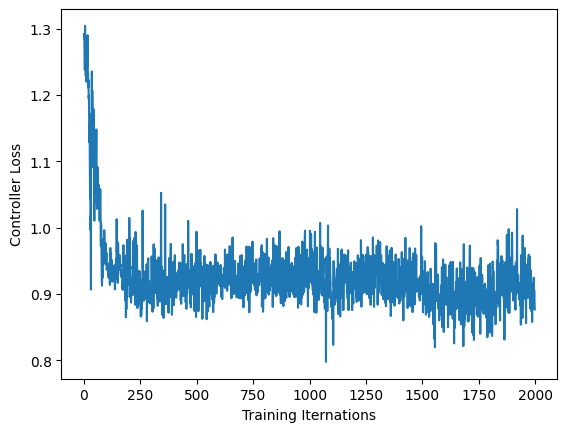

Finish controller training, plot trajectories:


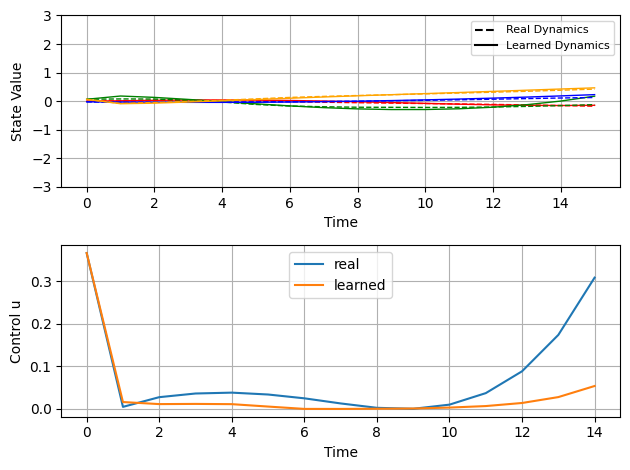

################################################



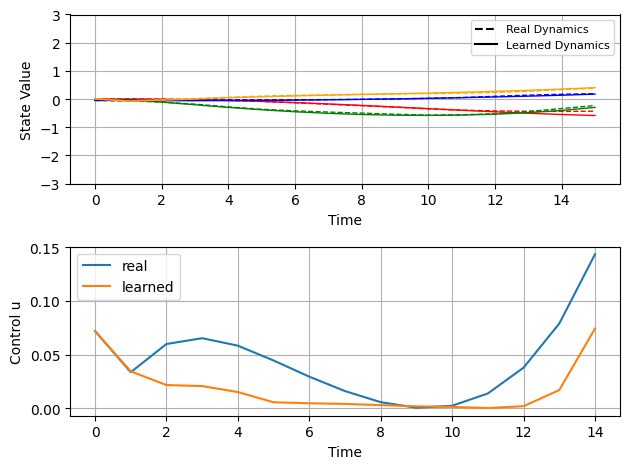

################################################


#########################################################
Alternation 14
#########################################################
start dyn

########### Move to next end time 0.5
0.16732362
From real dynamics and learned dynamics


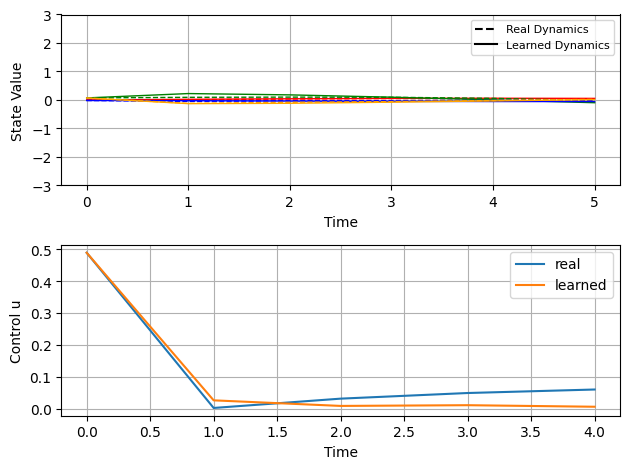


3d plot


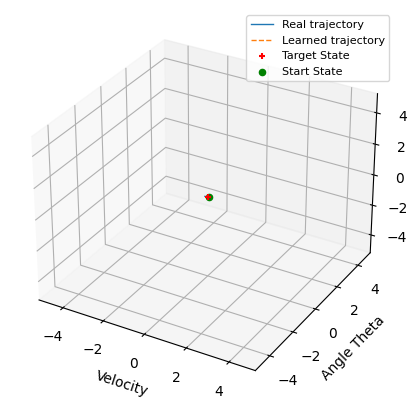

0.4293285
From real dynamics and learned dynamics


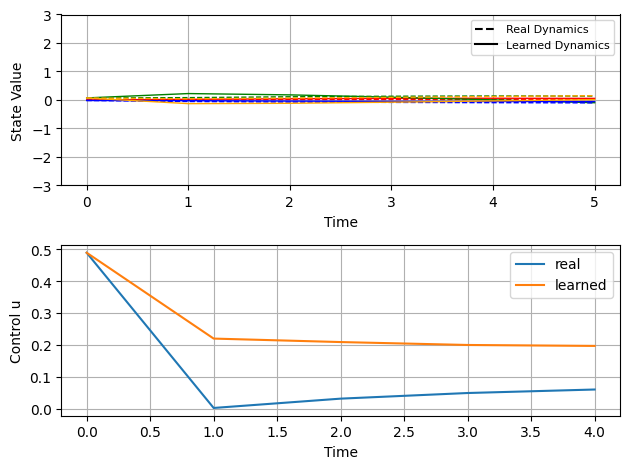


3d plot


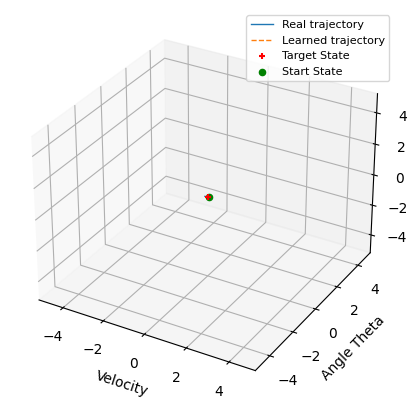

In [ ]:


    
alternation = 12
k=0
step_size=0.0001
list_of_end_times =  [0.5, 1, 1.5]
step_sizes = [0.005, 0.001, 0.0001]

while k <= alternation:
    print("#########################################################")
    print("Alternation {}".format(k))
    print("#########################################################")
    print("start dyn")
    odenet_params_prior = multi_stage_dyn_train(odenet_params_prior,x0_batch_control, step_sizes,list_of_end_times,2000)
    print("####### $$$$$$$$$$$$$$$$$$$$$#")
    print("start con")

    odenet_params_prior = con_train_with_plot(odenet_params_prior,2000,x0_batch_control,x_target_batch,step_size)
    print()
    k+=1

